# Perceptron

## Perceptron lineal (regresion)

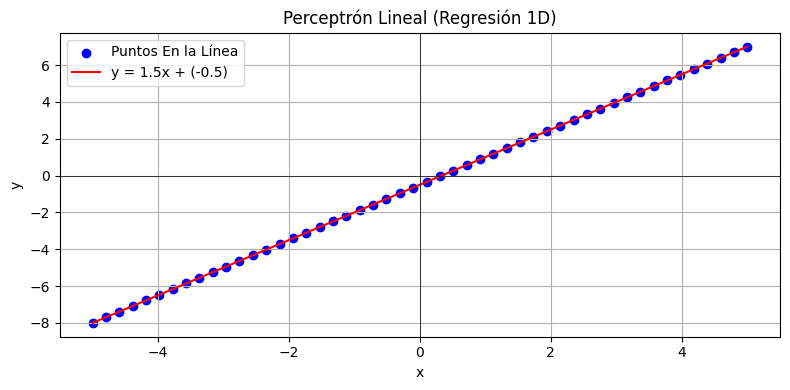

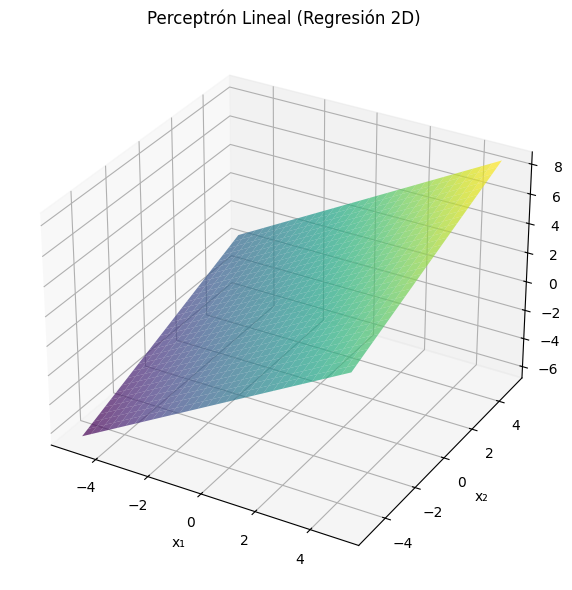

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------------------
# 1) Perceptron Lineal para Regresión
# ----------------------------------------

# Parte A: 1D
# Datos de ejemplo en 1D
x1 = np.linspace(-5, 5, 50)
w1 = 1.5  # peso
b1 = -0.5  # sesgo (bias)
y1 = w1 * x1 + b1  # salida lineal

# Plot 1D
plt.figure(figsize=(8, 4))
plt.scatter(x1, y1, color='blue', label='Puntos En la Línea')
plt.plot(x1, w1 * x1 + b1, color='red', label=f'y = {w1}x + ({b1})')
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.title('Perceptrón Lineal (Regresión 1D)')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Parte B: 2D
# Crear una malla de puntos (x, y)
xx = np.linspace(-5, 5, 30)
yy = np.linspace(-5, 5, 30)
X, Y = np.meshgrid(xx, yy)

# Pesos y sesgo para regresión 2D: z = w1*x + w2*y + b
w2 = np.array([1.0, 0.5])  # w1, w2
b2 = 1.0  # bias
Z = w2[0] * X + w2[1] * Y + b2

# Plot 2D
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, alpha=0.7, cmap='viridis')
ax.set_title('Perceptrón Lineal (Regresión 2D)')
ax.set_xlabel('x₁')
ax.set_ylabel('x₂')
ax.set_zlabel('z = w₁·x₁ + w₂·x₂ + b')
plt.tight_layout()
plt.show()




## Perceptron simple (clasificacion)

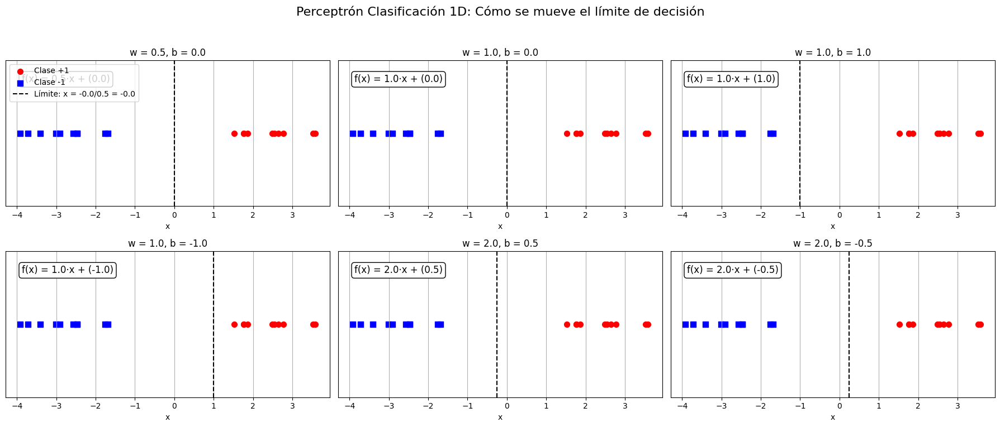

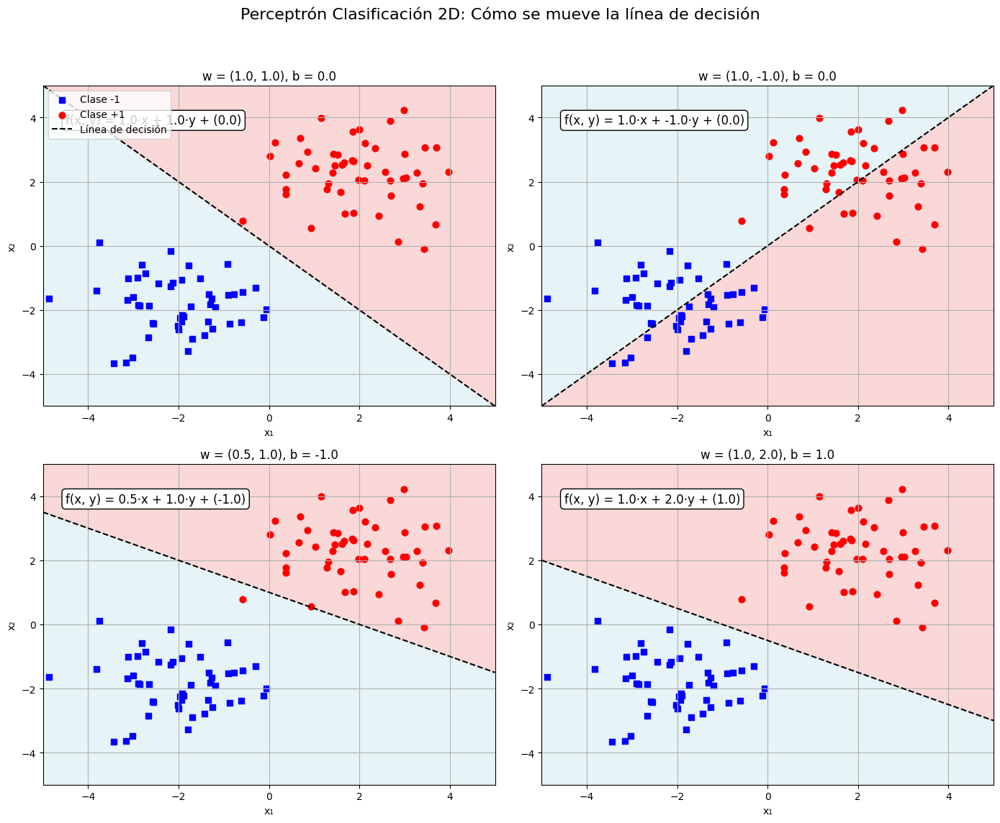

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------------------
# 1) Perceptron Clasificación 1D - Visualización Intuitiva
# ----------------------------------------

# Generar datos 1D con dos clases y algo de ruido
np.random.seed(42)
n_samples = 20
x_pos = np.random.normal(loc=2.0, scale=1.0, size=n_samples // 2)
x_neg = np.random.normal(loc=-2.0, scale=1.0, size=n_samples // 2)
x_1d = np.concatenate([x_pos, x_neg])
y_1d = np.array([1] * (n_samples // 2) + [-1] * (n_samples // 2))

# Parámetros (w, b) a probar
params_1d = [
    (0.5, 0.0),
    (1.0, 0.0),
    (1.0, 1.0),
    (1.0, -1.0),
    (2.0, 0.5),
    (2.0, -0.5),
]

fig1d, axs1d = plt.subplots(2, 3, figsize=(18, 8), sharey=True)
fig1d.suptitle("Perceptrón Clasificación 1D: Cómo se mueve el límite de decisión", fontsize=16)

for idx, (w, b) in enumerate(params_1d):
    ax = axs1d[idx // 3, idx % 3]
    # Plotear puntos con colores según etiqueta
    ax.scatter(x_pos, np.zeros_like(x_pos), color='red', label='Clase +1', s=50, marker='o')
    ax.scatter(x_neg, np.zeros_like(x_neg), color='blue', label='Clase -1', s=50, marker='s')
    
    # Calcular límite (x0 = -b / w)
    if w != 0:
        x0 = -b / w
        ax.axvline(x0, color='black', linestyle='--', label=f'Límite: x = {-b:.1f}/{w:.1f} = {x0:.1f}')
    else:
        x0 = None
    
    # Mostrar fórmula en el plot
    ax.text(0.05, 0.85, f"f(x) = {w:.1f}·x + ({b:.1f})", transform=ax.transAxes,
            fontsize=12, bbox=dict(boxstyle="round", fc="w"))
    
    # Ajustes de visualización
    ax.set_ylim(-0.5, 0.5)
    ax.set_yticks([])
    ax.set_xlabel("x")
    ax.set_title(f"w = {w}, b = {b}")
    ax.grid(True)
    if idx == 0:
        ax.legend(loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# ----------------------------------------
# 2) Perceptrón Clasificación 2D - Visualización Intuitiva
# ----------------------------------------

# Generar datos 2D con dos clases y ruido
np.random.seed(24)
n_samples_2d = 50
pts_pos = np.random.normal(loc=[2, 2], scale=1.0, size=(n_samples_2d, 2))
pts_neg = np.random.normal(loc=[-2, -2], scale=1.0, size=(n_samples_2d, 2))

# Parámetros (w1, w2, b) a probar
params_2d = [
    (1.0, 1.0, 0.0),
    (1.0, -1.0, 0.0),
    (0.5, 1.0, -1.0),
    (1.0, 2.0, 1.0),
]

fig2d, axs2d = plt.subplots(2, 2, figsize=(14, 12))
fig2d.suptitle("Perceptrón Clasificación 2D: Cómo se mueve la línea de decisión", fontsize=16)

xx = np.linspace(-5, 5, 200)
yy = np.linspace(-5, 5, 200)
XX, YY = np.meshgrid(xx, yy)

for idx, (w1, w2, b) in enumerate(params_2d):
    ax = axs2d[idx // 2, idx % 2]
    # Colorear regiones según sign(w1*x + w2*y + b)
    scores = w1 * XX + w2 * YY + b
    labels_grid = np.sign(scores)
    ax.contourf(XX, YY, labels_grid, levels=[-1, 0, 1], colors=['lightblue', 'lightcoral'], alpha=0.3)
    
    # Dibujar puntos
    ax.scatter(pts_neg[:, 0], pts_neg[:, 1], color='blue', label='Clase -1', s=40, marker='s')
    ax.scatter(pts_pos[:, 0], pts_pos[:, 1], color='red', label='Clase +1', s=40, marker='o')
    
    # Dibujar línea de decisión: w1*x + w2*y + b = 0 => y = -(w1/w2)x - b/w2
    if w2 != 0:
        x_line = np.array([-5, 5])
        y_line = - (w1 * x_line + b) / w2
        ax.plot(x_line, y_line, color='black', linestyle='--', label='Línea de decisión')
    
    # Mostrar fórmula
    ax.text(0.05, 0.88, f"f(x, y) = {w1:.1f}·x + {w2:.1f}·y + ({b:.1f})", transform=ax.transAxes,
            fontsize=12, bbox=dict(boxstyle="round", fc="w"))
    
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.set_xlabel("x₁")
    ax.set_ylabel("x₂")
    ax.set_title(f"w = ({w1}, {w2}), b = {b}")
    ax.grid(True)
    if idx == 0:
        ax.legend(loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## Dot product como similaridad

El valor es mas positivo a medida que el dot product sea mas grande (mas alineados esten los vectores o mas importancia le den a las mismas caracteristicas)

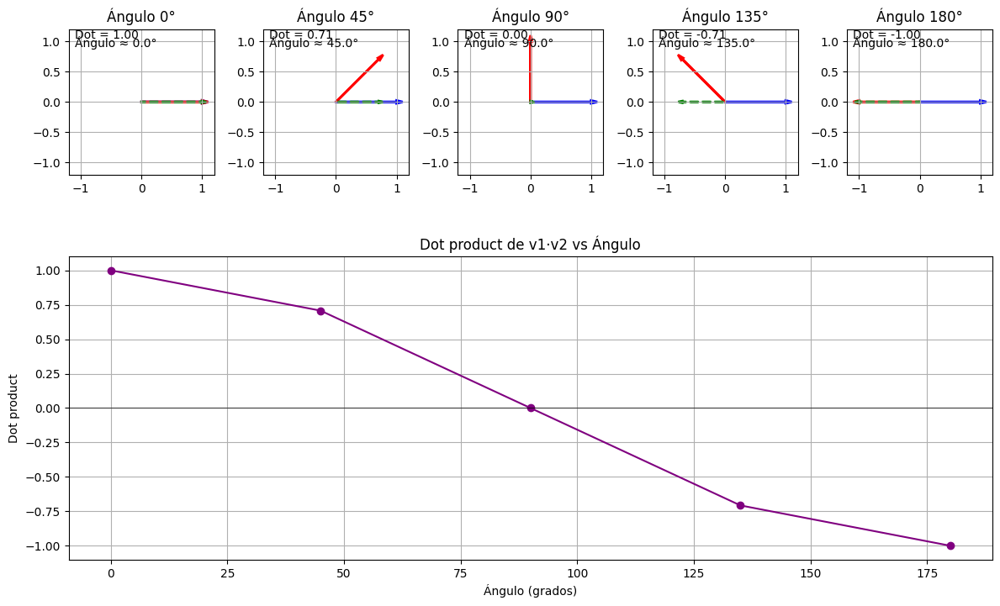

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Función para dibujar dos vectores y mostrar su dot product
def plot_vectors_and_dot(ax, v1, v2, title):
    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-1.2, 1.2)

    # Dibujar vectores v1 y v2
    ax.arrow(0, 0, v1[0], v1[1], head_width=0.05, head_length=0.1, fc='blue', ec='blue', linewidth=2, label='v1')
    ax.arrow(0, 0, v2[0], v2[1], head_width=0.05, head_length=0.1, fc='red', ec='red', linewidth=2, label='v2')

    # Calcular dot product
    dot = np.dot(v1, v2)
    angle = np.arccos(dot / (np.linalg.norm(v1) * np.linalg.norm(v2))) * 180 / np.pi

    # Proyección de v2 sobre v1
    proj_length = dot / np.linalg.norm(v1)
    proj = proj_length * (v1 / np.linalg.norm(v1))
    ax.arrow(0, 0, proj[0], proj[1], head_width=0.03, head_length=0.07, 
             fc='green', ec='green', linestyle='--', linewidth=2, label='Proyección')

    # Anotar el valor del dot product y el ángulo
    ax.text(-1.1, 1.05, f"Dot = {dot:.2f}", fontsize=10)
    ax.text(-1.1, 0.90, f"Ángulo ≈ {angle:.1f}°", fontsize=10)

    ax.set_aspect('equal')
    ax.grid(True)
    ax.set_title(title)

# Vectores base: uno fijo en dirección 0° (1, 0), otro rotando
v1 = np.array([1, 0])

# Elegimos varios ángulos para v2
angles_deg = np.array([0, 45, 90, 135, 180])
angles_rad = np.deg2rad(angles_deg)

# Generar v2 para cada ángulo (cada elemento es un vector 2D)
vectors_v2 = np.column_stack((np.cos(angles_rad), np.sin(angles_rad)))

# Configurar subplots: 2 filas (la segunda es el gráfico de dot vs ángulo)
fig = plt.figure(figsize=(12, 8))

# Primera fila: dibujar cada par v1, v2
for i, angle in enumerate(angles_deg):
    ax = fig.add_subplot(2, len(angles_deg), i + 1)
    plot_vectors_and_dot(ax, v1, vectors_v2[i], f"Ángulo {angle}°")

# Segunda fila: gráfico dot product vs ángulo
dots = [np.dot(v1, vectors_v2[i]) for i in range(len(angles_deg))]
ax2 = fig.add_subplot(2, 1, 2)
ax2.plot(angles_deg, dots, '-o', color='purple')
ax2.axhline(0, color='black', linewidth=0.5)
ax2.set_xlabel('Ángulo (grados)')
ax2.set_ylabel('Dot product')
ax2.set_title('Dot product de v1·v2 vs Ángulo')
ax2.grid(True)

plt.tight_layout()
plt.show()


## Frontera de decision - perceptron

Moviendo los parametros del modelo w, b cambiamos la frontera de decision.

---

**DOT PRODUCT**: Los inputs a y b estan bastante alineado a w, por lo tanto van a aprobar (el valor va a ser mas grande entonces > 0).

Los c y d tienen negativos en valores qeu para el modelo son importante (porque son positivos), entonces caen del otro lado y no van a aprobar.

No siempre que tengan un negativo van a desaprobar. Si por ej e=(-1,3), aprueba, porque esta del lado de aprobacion igual.

---

b mueve el hiperplano, siempre ortogonal a w.

b es como un empujon extra que te hace mas exigente

o menos exigente para aprobar (a todos por igual).

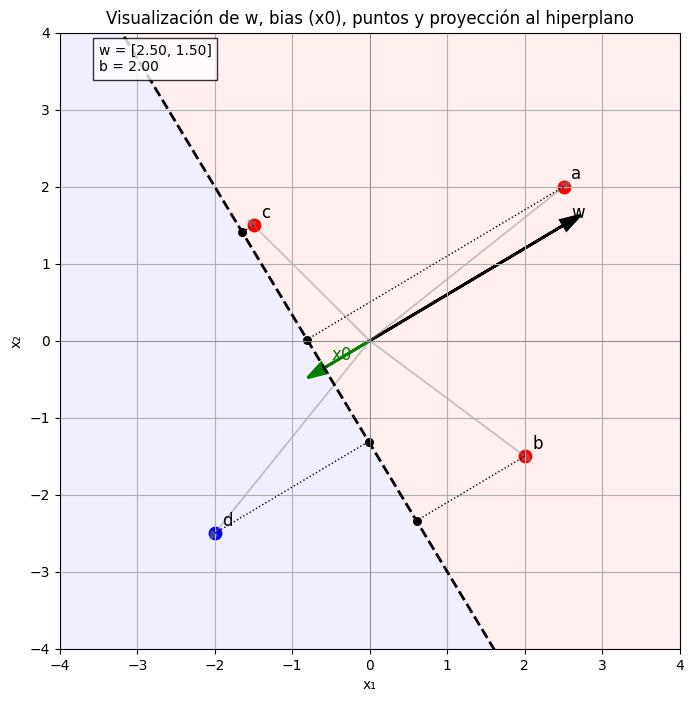

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Definimos w y b
w = np.array([2.5, 1.5])
b = 2

# Normalizamos w para dibujar el vector de dirección y la distancia al hiperplano
w_norm = w / np.linalg.norm(w)

# Calculamos el punto x0 (proyección de origen en el hiperplano): w·x + b = 0
# => x0 = -(b / (||w||^2)) * w
x0 = - (b / np.dot(w, w)) * w

# Conjuntos de ejemplo de puntos a, b, c, d
points = {
    'a': np.array([2.5,  2.0]),
    'b': np.array([2.0, -1.5]),
    'c': np.array([-1.5, 1.5]),
    'd': np.array([-2.0, -2.5])
}

# Función para proyectar un punto p sobre el hiperplano (proyección ortogonal)
def proj_to_hyperplane(p, w, b):
    # Proyección de p sobre la línea normal w: p_proj_line = p - ((w·p)/(||w||^2)) * w
    # Luego desplazamos con b: para la proyección exacta en la recta del hiperplano:
    # p_hyp = p - ((w·p + b)/(||w||^2)) * w
    return p - ((np.dot(w, p) + b) / np.dot(w, w)) * w

# Creamos la figura
plt.figure(figsize=(8, 8))

# Dibujamos región de clasificación en 2D
xx = np.linspace(-4, 4, 400)
yy = np.linspace(-4, 4, 400)
XX, YY = np.meshgrid(xx, yy)
ZZ = w[0] * XX + w[1] * YY + b
# Pintamos de color claro según signo de ZZ
plt.contourf(XX, YY, ZZ > 0, levels=[-0.5, 0.5, 1.5],
             colors=['#ccccff', '#ffcccc'], alpha=0.3)

# Dibujamos línea de decisión: w·x + b = 0 => y = -(w1/w2) x - b/w2
if w[1] != 0:
    x_line = np.array([-4, 4])
    y_line = - (w[0] * x_line + b) / w[1]
    plt.plot(x_line, y_line, 'k--', linewidth=2)

# Dibujamos vector w desde el origen
plt.arrow(0, 0, w[0], w[1], head_width=0.15, head_length=0.25,
          fc='black', ec='black', linewidth=2, label='w')

# Dibujamos el vector x0 (distancia al hiperplano) desde el origen
plt.arrow(0, 0, x0[0], x0[1], head_width=0.15, head_length=0.25,
          fc='green', ec='green', linewidth=2, label='x0 (bias)')

# Plot de los puntos a, b, c, d
for label, p in points.items():
    plt.scatter(p[0], p[1], s=80, color='red' if np.dot(w, p) + b > 0 else 'blue')
    plt.text(p[0] + 0.1, p[1] + 0.1, label, fontsize=12)

    # Dibujamos flecha desde el origen al punto
    plt.arrow(0, 0, p[0], p[1], linestyle='-', alpha=0.4,
              head_width=0.1, head_length=0.1, color='gray')

    # Calculamos la proyección de p sobre el hiperplano
    p_proj = proj_to_hyperplane(p, w, b)
    # Dibujamos línea punteada desde p hasta esa proyección
    plt.plot([p[0], p_proj[0]], [p[1], p_proj[1]], 'k:', linewidth=1)
    # Dibujamos el punto de proyección (en el hiperplano)
    plt.scatter(p_proj[0], p_proj[1], s=30, color='black')

# Etiquetas y ajustes
plt.text(w[0] + 0.1, w[1] + 0.1, 'w', fontsize=12, color='black')
plt.text(x0[0] + 0.1, x0[1] + 0.1, 'x0', fontsize=12, color='green')
plt.axhline(0, color='gray', linewidth=0.5)
plt.axvline(0, color='gray', linewidth=0.5)
plt.xlim(-4, 4)
plt.ylim(-4, 4)
plt.xlabel('x₁')
plt.text(-3.5, 3.5, f'w = [{w[0]:.2f}, {w[1]:.2f}]\nb = {b:.2f}', 
         bbox=dict(facecolor='white', alpha=0.8))
plt.ylabel('x₂')
plt.title('Visualización de w, bias (x0), puntos y proyección al hiperplano')
plt.grid(True)
plt.show()



## Problema XOR

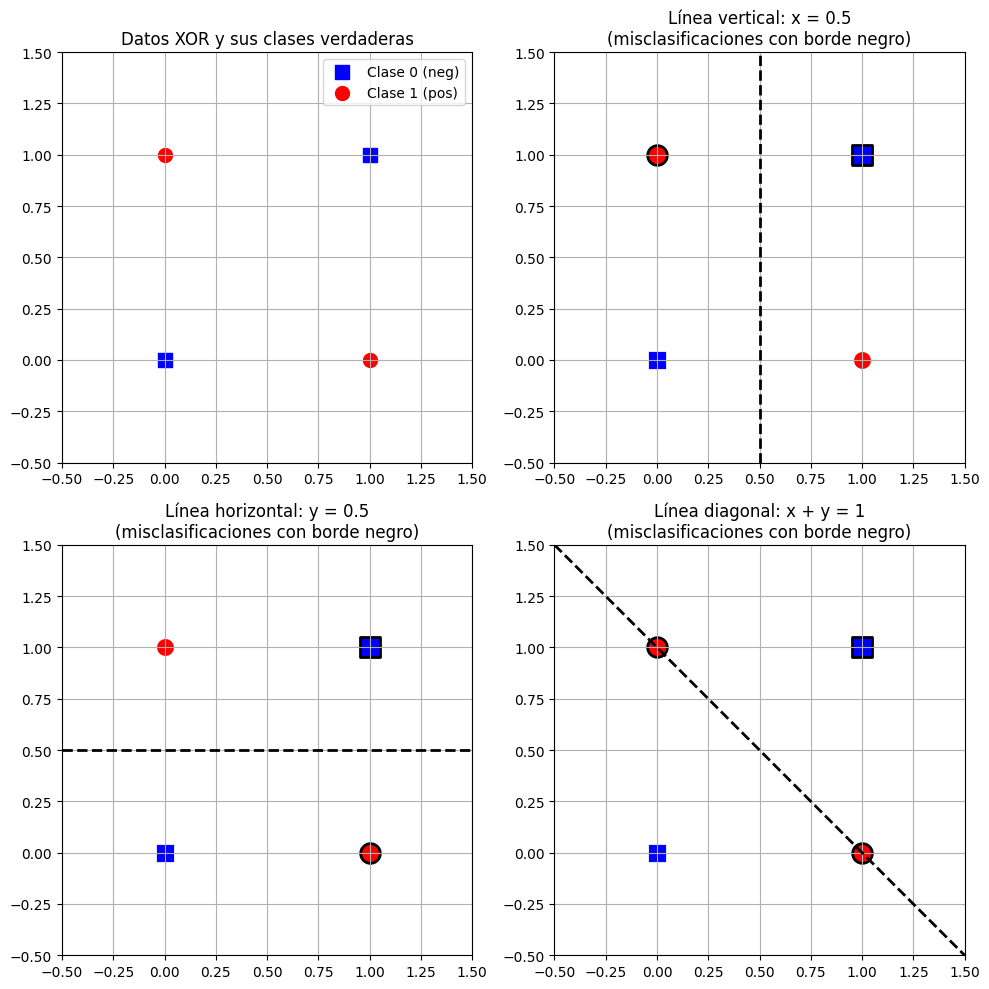

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Datos XOR
# Puntos (x, y) y su etiqueta True (0 o 1)
points = np.array([
    [0, 0],
    [0, 1],
    [1, 0],
    [1, 1]
])
labels = np.array([0, 1, 1, 0])  # XOR: (0,0)->0; (0,1)->1; (1,0)->1; (1,1)->0

# Función que evalúa un clasificador lineal w·x + b
def predict_line(p, w, b):
    return (np.dot(p, w) + b) > 0  # Devuelve True/False

# Definimos tres ejemplos de "líneas de decisión"
# Cada uno representado como (w, b)
classifiers = [
    (np.array([1.0, 0.0]), -0.5),   # x > 0.5
    (np.array([0.0, 1.0]), -0.5),   # y > 0.5
    (np.array([1.0, 1.0]), -1.0)    # x + y > 1
]

titles = [
    "Línea vertical: x = 0.5",
    "Línea horizontal: y = 0.5",
    "Línea diagonal: x + y = 1"
]

fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs = axs.flatten()

# Subplot 0: solo datos XOR y sus clases verdaderas
axs[0].scatter(points[labels == 0, 0], points[labels == 0, 1], 
               c='blue', marker='s', s=100, label='Clase 0 (neg)')
axs[0].scatter(points[labels == 1, 0], points[labels == 1, 1], 
               c='red', marker='o', s=100, label='Clase 1 (pos)')
axs[0].set_title("Datos XOR y sus clases verdaderas")
axs[0].set_xlim(-0.5, 1.5)
axs[0].set_ylim(-0.5, 1.5)
axs[0].legend()
axs[0].grid(True)

# Rango para dibujar líneas
x_vals = np.linspace(-0.5, 1.5, 100)

# Generar los tres subplots con ejemplos de líneas
for i, (w, b) in enumerate(classifiers, start=1):
    ax = axs[i]
    # Dibujar línea de decisión: w·x + b = 0
    # Distintas fórmulas según w
    if w[1] != 0:
        # y = -(w[0]/w[1]) x - b/w[1]
        y_vals = - (w[0] * x_vals + b) / w[1]
    else:
        # vertical: x = -b/w[0]
        x_const = -b / w[0]
        y_vals = np.array([ -0.5, 1.5 ])
        ax.plot([x_const, x_const], y_vals, 'k--', linewidth=2)
        y_vals = None
    
    if y_vals is not None:
        ax.plot(x_vals, y_vals, 'k--', linewidth=2)

    # Predecir etiqueta segun la línea
    preds = np.array([predict_line(p, w, b) for p in points]).astype(int)
    
    # Dibujar cada punto, coloreado según su etiqueta verdadera, pero con borde negro si fue mal clasificado
    for idx, p in enumerate(points):
        true = labels[idx]
        pred = preds[idx]
        color = 'red' if true == 1 else 'blue'
        marker = 'o' if true == 1 else 's'
        edgecolor = 'black' if pred != true else 'white'
        ax.scatter(p[0], p[1], c=color, marker=marker, s=200, 
                   edgecolors=edgecolor, linewidth=2)
    
    ax.set_title(titles[i-1] + "\n(misclasificaciones con borde negro)")
    ax.set_xlim(-0.5, 1.5)
    ax.set_ylim(-0.5, 1.5)
    ax.grid(True)

plt.tight_layout()
plt.show()


## Combinacion de perceptrones

Que pasa si combinamos varios perceptrones asi nomas? Combinacion de funciones lineales da funcion lineal

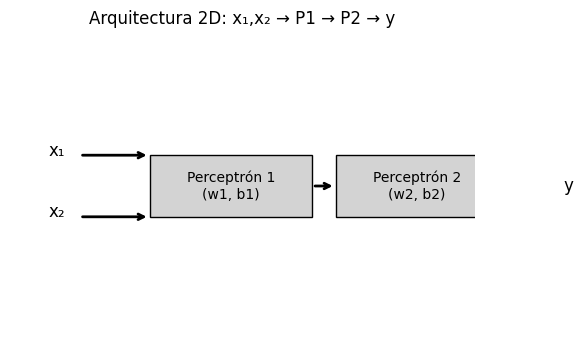

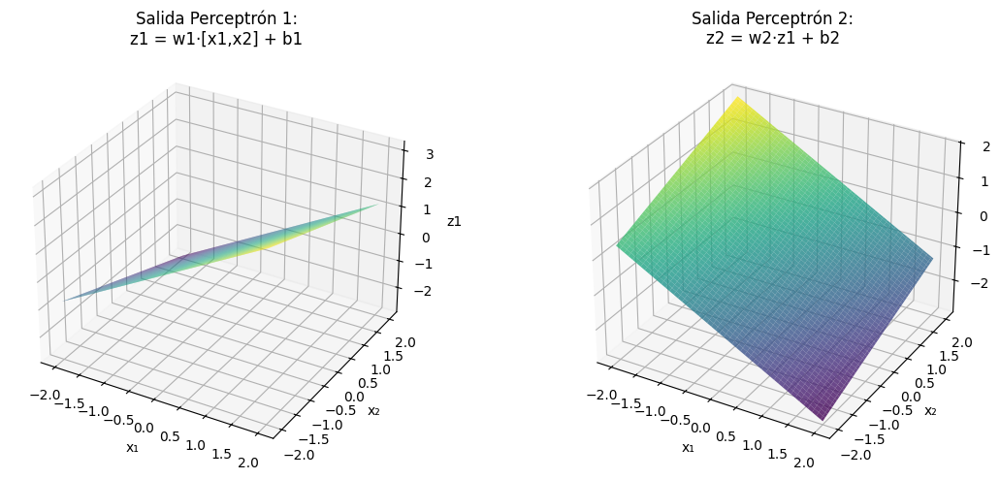

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ====== 1. Arquitectura en 2D con x1, x2 ======
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111)
ax.axis('off')

# Dibujar perceptrones como cajas
box1 = plt.Rectangle((0.3, 0.4), 0.35, 0.2, edgecolor='black', facecolor='lightgray')
box2 = plt.Rectangle((0.7, 0.4), 0.35, 0.2, edgecolor='black', facecolor='lightgray')
ax.add_patch(box1)
ax.add_patch(box2)

# Etiquetas
ax.text(0.475, 0.5, "Perceptrón 1\n(w1, b1)", ha='center', va='center', fontsize=10)
ax.text(0.875, 0.5, "Perceptrón 2\n(w2, b2)", ha='center', va='center', fontsize=10)

# Dibujar nodos de entrada x1, x2
ax.text(0.1, 0.6, "x₁", fontsize=12, ha='center')
ax.text(0.1, 0.4, "x₂", fontsize=12, ha='center')

# Flechas desde x1, x2 a Perceptrón 1
ax.annotate("", xy=(0.3, 0.6), xytext=(0.15, 0.6), arrowprops=dict(arrowstyle="->", lw=2))
ax.annotate("", xy=(0.3, 0.4), xytext=(0.15, 0.4), arrowprops=dict(arrowstyle="->", lw=2))

# Flecha de Perceptrón 1 a Perceptrón 2
ax.annotate("", xy=(0.65, 0.5), xytext=(0.65, 0.5), arrowprops=dict(arrowstyle="->", lw=2))
ax.annotate("", xy=(0.7, 0.5), xytext=(0.65, 0.5), arrowprops=dict(arrowstyle="->", lw=2))

# Flecha de Perceptrón 2 a y
ax.annotate("", xy=(1.05, 0.5), xytext=(1.05, 0.5), arrowprops=dict(arrowstyle="->", lw=2))
ax.annotate("", xy=(1.15, 0.5), xytext=(1.05, 0.5), arrowprops=dict(arrowstyle="->", lw=2))
ax.text(1.2, 0.5, "y", fontsize=12, ha='center', va='center')

ax.set_title("Arquitectura 2D: x₁,x₂ → P1 → P2 → y", fontsize=12)
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ====== Visualización Salidas de Perceptrones en 2D ======

# Definir pesos y sesgos
w1 = np.array([1.0, -0.5])   # vector 2D para Perceptrón 1
b1 = 0.2
w2 = -0.8                    # escalar para Perceptrón 2
b2 = -0.3

# Crear rejilla de puntos (x1, x2)
x1 = np.linspace(-2, 2, 100)
x2 = np.linspace(-2, 2, 100)
X1, X2 = np.meshgrid(x1, x2)

# Capa 1: salida z1 = w1·[x1,x2] + b1
Z1 = w1[0] * X1 + w1[1] * X2 + b1

# Capa 2: salida final z2 = w2 * z1 + b2
Z2 = w2 * Z1 + b2

# Dibujar las dos superficies una al lado de la otra
fig = plt.figure(figsize=(12, 5))

# Salida del Perceptrón 1
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(X1, X2, Z1, cmap='viridis', alpha=0.8)
ax1.set_title("Salida Perceptrón 1:\nz1 = w1·[x1,x2] + b1")
ax1.set_xlabel("x₁")
ax1.set_ylabel("x₂")
ax1.set_zlabel("z1")

# Salida del Perceptrón 2 (recibiendo z1)
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
ax2.plot_surface(X1, X2, Z2, cmap='viridis', alpha=0.8)
ax2.set_title("Salida Perceptrón 2:\nz2 = w2·z1 + b2")
ax2.set_xlabel("x₁")
ax2.set_ylabel("x₂")
ax2.set_zlabel("z2")

plt.tight_layout()
plt.show()


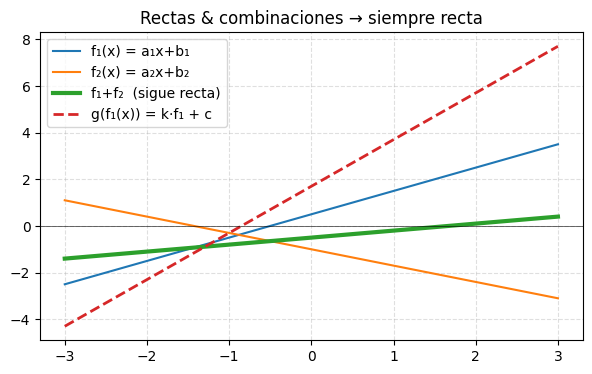

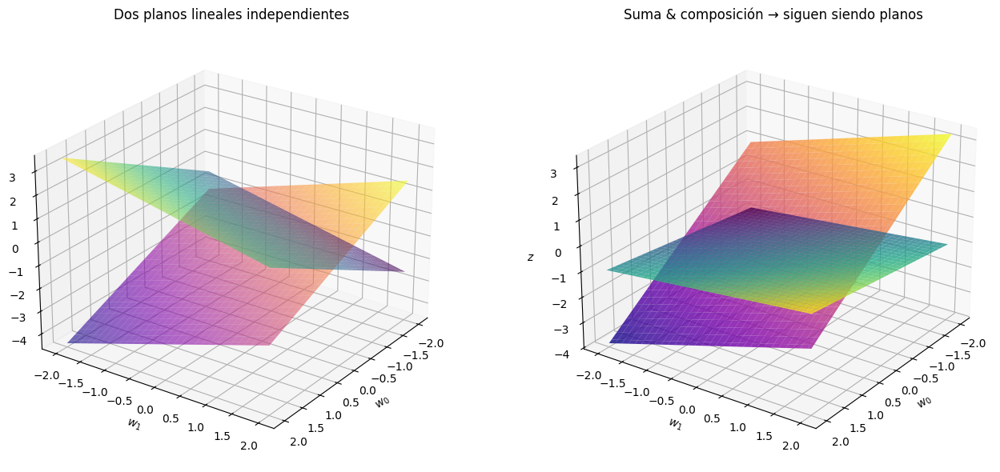

In [26]:
# COMBINACION DE FUNCIONES LINEALES

# %% [markdown]
# # FUNDACIÓN 1 – **Linealidad pura**  
# Queremos “ver” por qué:
# * Suma de lineales ⇒ lineal  
# * Composición de lineales ⇒ lineal  
# * En 2 D (planos) pasa lo mismo
#
# Cambia los parámetros `a,b,c,…` y ejecuta para confirmar que **nunca aparece curvatura**.

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ---------- 1-D: rectas y sus sumas ---------------------------------
x = np.linspace(-3, 3, 400)

# dos rectas
a1, b1 =  1.0,  0.5    # f1(x) = a1·x + b1
a2, b2 = -0.7, -1.0    # f2(x) = a2·x + b2
f1 = a1 * x + b1
f2 = a2 * x + b2
f_sum = f1 + f2                  # suma
g_comp = 2.0 * f1 + 0.7          # composición lineal: g(x)=k·f1(x)+c

plt.figure(figsize=(7,4))
plt.plot(x, f1,  label='f₁(x) = a₁x+b₁')
plt.plot(x, f2,  label='f₂(x) = a₂x+b₂')
plt.plot(x, f_sum,  lw=3, label='f₁+f₂  (sigue recta)')
plt.plot(x, g_comp, '--', lw=2, label='g(f₁(x)) = k·f₁ + c')
plt.axhline(0, color='black', lw=0.4)
plt.title('Rectas & combinaciones → siempre recta')
plt.legend(); plt.grid(ls='--', alpha=0.4); plt.show();

# ---------- 2-D: planos y sus combinaciones -------------------------
# plano 1:  z = p1*w0 + q1*w1 + r1
# plano 2:  z = p2*w0 + q2*w1 + r2
p1,q1,r1 =  1.0, -0.5,  0.5
p2,q2,r2 = -0.8,  0.7, -1.5

w0_vals = np.linspace(-2, 2, 60)
w1_vals = np.linspace(-2, 2, 60)
W0, W1   = np.meshgrid(w0_vals, w1_vals)
Z1 = p1*W0 + q1*W1 + r1
Z2 = p2*W0 + q2*W1 + r2
Z_sum = Z1 + Z2                # sigue plano
Z_comp = -1.2*Z1 + 0.3         # composición lineal → plano

fig = plt.figure(figsize=(14,6))
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(W0, W1, Z1, cmap='viridis', alpha=0.6)
ax1.plot_surface(W0, W1, Z2, cmap='plasma', alpha=0.6)
ax1.set_title('Dos planos lineales independientes')

ax2 = fig.add_subplot(122, projection='3d')
ax2.plot_surface(W0, W1, Z_sum, cmap='viridis', alpha=0.8)
ax2.plot_surface(W0, W1, Z_comp, cmap='plasma', alpha=0.8)
ax2.set_title('Suma & composición → siguen siendo planos')

for ax in (ax1, ax2):
    ax.set_xlabel('$w_0$'); ax.set_ylabel('$w_1$'); ax.set_zlabel('$z$')
    ax.view_init(elev=25, azim=35)

plt.tight_layout();

## No linealidad (ReLU)

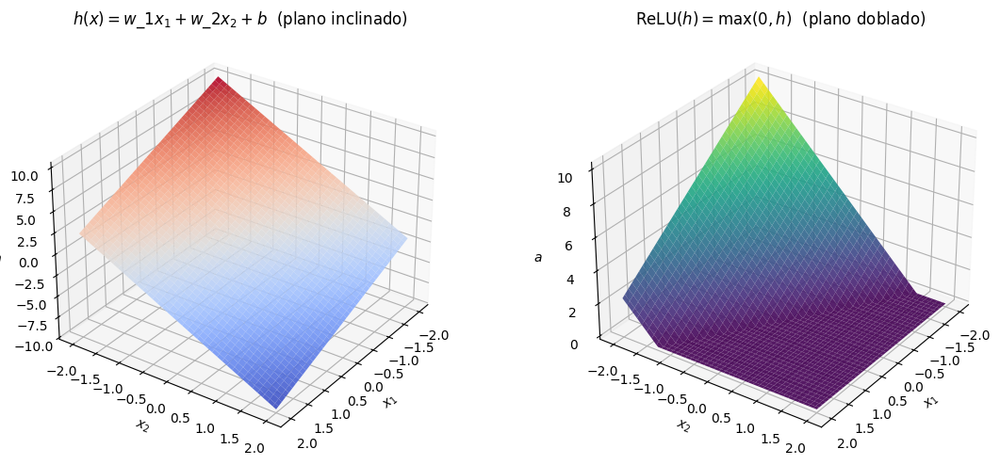

In [32]:
# %% [markdown]
# ## ReLU en 3-D: antes vs. después — vista limpia
#
# * Una sola neurona lineal `h = W·x + b` (doble entrada).  
# * Después le aplicamos **ReLU** \(a = \max(0,h)\).  
# * Dibujamos **dos** superficies en 3-D, lado a lado, con la misma perspectiva
#   para que el “doblez” se aprecie al instante.

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ---------- plano de entrada ----------
grid = np.linspace(-2, 2, 120)
X1, X2 = np.meshgrid(grid, grid)

# ---------- parámetros de la capa lineal ----------
W = np.array([-2.0, -3.0])   # pesos
b = 0.2                   # sesgo

H = W[0]*X1 + W[1]*X2 + b       # pre-activación
A = np.maximum(0, H)            # ReLU

# ---------- plotting ----------
fig = plt.figure(figsize=(12,5))

# (A) Superficie lineal h(x)
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(X1, X2, H,
                         cmap='coolwarm', alpha=0.9, linewidth=0)
ax1.set_title('$h(x)=w\\_1x_1 + w\\_2x_2 + b$  (plano inclinado)')
ax1.set_xlabel('$x_1$'); ax1.set_ylabel('$x_2$'); ax1.set_zlabel('$h$')
ax1.view_init(elev=30, azim=35)

# (B) Después de ReLU
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(X1, X2, A,
                         cmap='viridis', alpha=0.9, linewidth=0)
ax2.set_title('$\\text{ReLU}(h)=\\max(0,h)$  (plano doblado)')
ax2.set_xlabel('$x_1$'); ax2.set_ylabel('$x_2$'); ax2.set_zlabel('$a$')
ax2.view_init(elev=30, azim=35)

plt.tight_layout()

## Combinacion no-lineal secuencial

SIN RELU EN LA SALIDA DE LA SEGUNDA NEURONA

x₁ → [Perceptrón 1 (w₁,b₁)] → ReLU → [Perceptrón 2 (w₂,b₂)] → y 

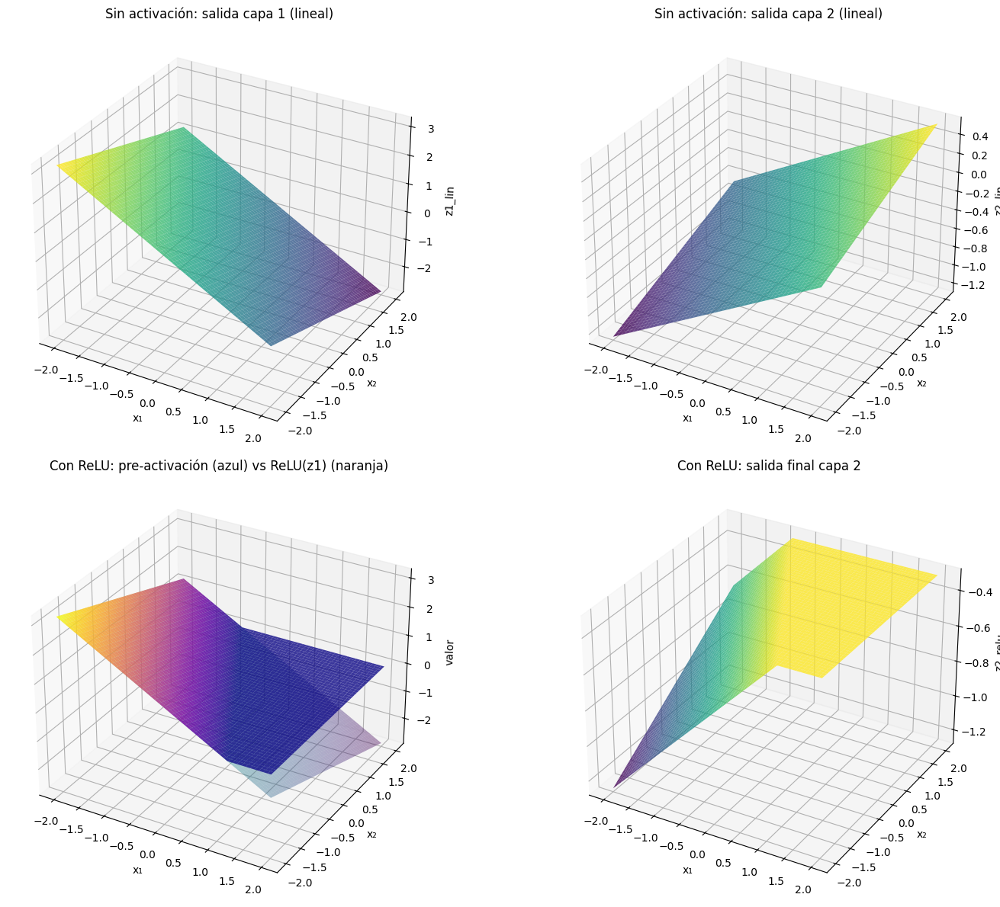

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ===== Parámetros de los perceptrones =====
w1 = np.array([-1.0, -0.5])  # pesos capa 1
b1 = 0.2                    # bias capa 1
w2 = -0.3                    # peso capa 2 (escala de salida)
b2 = -0.3                   # bias capa 2

# ===== Rejilla de input (x1, x2) =====
x1 = np.linspace(-2, 2, 200)
x2 = np.linspace(-2, 2, 200)
X1, X2 = np.meshgrid(x1, x2)

# ===== 1) Sin no linealidad (solo lineal) =====
Z1_lin = w1[0]*X1 + w1[1]*X2 + b1               # salida capa 1 (lineal)
Z2_lin = w2 * Z1_lin + b2                       # salida capa 2 (lineal)

# ===== 2) Con no linealidad (ReLU) después del perceptrón 1 =====
Z1 = w1[0]*X1 + w1[1]*X2 + b1                   # salida capa 1 (pre-activación)
A1 = np.maximum(0, Z1)                          # ReLU(Z1)
Z2_relu = w2 * A1 + b2                          # salida capa 2 tras ReLU

# ===== Dibujar superficies 3D =====
fig = plt.figure(figsize=(16, 12))

# Sin activación: capa 1 y capa 2 lineal
ax0 = fig.add_subplot(2, 2, 1, projection='3d')
ax0.plot_surface(X1, X2, Z1_lin, cmap='viridis', alpha=0.8)
ax0.set_title("Sin activación: salida capa 1 (lineal)")
ax0.set_xlabel("x₁"); ax0.set_ylabel("x₂"); ax0.set_zlabel("z1_lin")

ax1 = fig.add_subplot(2, 2, 2, projection='3d')
ax1.plot_surface(X1, X2, Z2_lin, cmap='viridis', alpha=0.8)
ax1.set_title("Sin activación: salida capa 2 (lineal)")
ax1.set_xlabel("x₁"); ax1.set_ylabel("x₂"); ax1.set_zlabel("z2_lin")

# Con activación: ReLU en medio
ax2 = fig.add_subplot(2, 2, 3, projection='3d')
ax2.plot_surface(X1, X2, Z1, cmap='viridis', alpha=0.4)
ax2.plot_surface(X1, X2, A1, cmap='plasma', alpha=0.8)
ax2.set_title("Con ReLU: pre-activación (azul) vs ReLU(z1) (naranja)")
ax2.set_xlabel("x₁"); ax2.set_ylabel("x₂"); ax2.set_zlabel("valor")

ax3 = fig.add_subplot(2, 2, 4, projection='3d')
ax3.plot_surface(X1, X2, Z2_relu, cmap='viridis', alpha=0.8)
ax3.set_title("Con ReLU: salida final capa 2")
ax3.set_xlabel("x₁"); ax3.set_ylabel("x₂"); ax3.set_zlabel("z2_relu")

plt.tight_layout()
plt.show()


Con ReLU EN AMBAS SALIDAS


x₁ → [Perceptrón 1 (w₁,b₁)] → ReLU → [Perceptrón 2 (w₂,b₂)] → ReLU → y

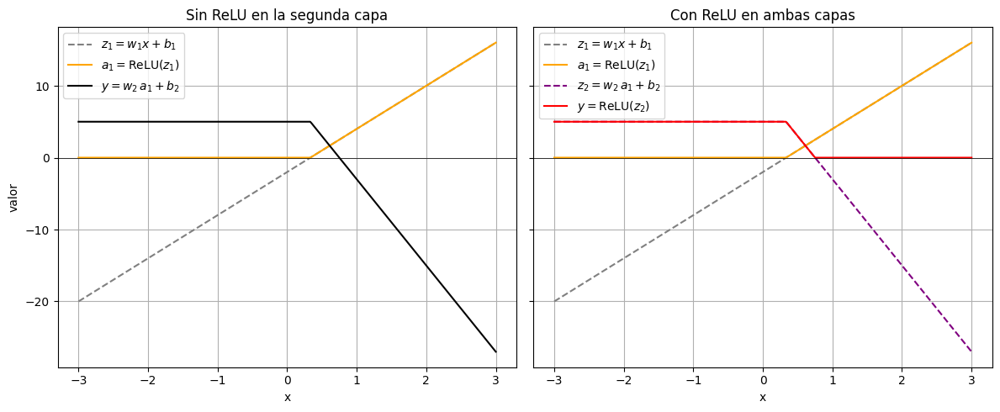

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de ejemplo
w1, b1 = 6.0, -2
w2, b2 = -2.0,  5

# Rejilla de inputs
x = np.linspace(-3, 3, 300)

# --- Capa 1: Perceptrón 1 + ReLU ---
z1 = w1 * x + b1
a1 = np.maximum(0, z1)

# --- Capa 2 sin ReLU final ---
y_lin = w2 * a1 + b2

# --- Capa 2 con ReLU final ---
z2 = w2 * a1 + b2
y_relu = np.maximum(0, z2)

# Crear figura con 2 subplots lado a lado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# --- Subplot 1: sin ReLU en capa 2 ---
ax1.plot(x, z1,  '--', color='gray', label=r'$z_1 = w_1 x + b_1$')
ax1.plot(x, a1,  '-',  color='orange', label=r'$a_1 = \mathrm{ReLU}(z_1)$')
ax1.plot(x, y_lin, '-k', label=r'$y = w_2\,a_1 + b_2$')
ax1.axhline(0, color='black', linewidth=0.5)
ax1.set_title("Sin ReLU en la segunda capa")
ax1.set_xlabel("x")
ax1.set_ylabel("valor")
ax1.legend()
ax1.grid(True)

# --- Subplot 2: con ReLU en ambas capas ---
ax2.plot(x, z1,  '--', color='gray', label=r'$z_1 = w_1 x + b_1$')
ax2.plot(x, a1,  '-',  color='orange', label=r'$a_1 = \mathrm{ReLU}(z_1)$')
ax2.plot(x, z2,  '--', color='purple', label=r'$z_2 = w_2\,a_1 + b_2$')
ax2.plot(x, y_relu, '-r', label=r'$y = \mathrm{ReLU}(z_2)$')
ax2.axhline(0, color='black', linewidth=0.5)
ax2.set_title("Con ReLU en ambas capas")
ax2.set_xlabel("x")
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


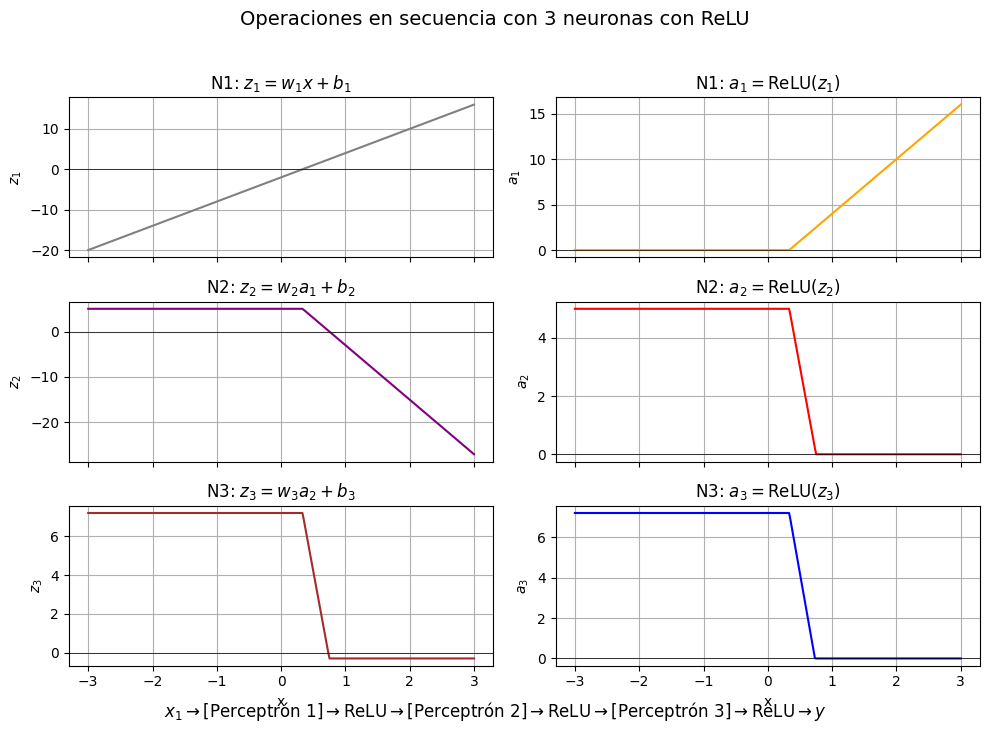

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de las 3 neuronas
w1, b1 = 6.0, -2
w2, b2 = -2.0,  5
w3, b3 = 1.5, -0.3   # Perceptrón 3

# Rejilla de inputs (1D)
x = np.linspace(-3, 3, 300)

# 1) Neurona 1
z1 = w1 * x + b1
a1 = np.maximum(0, z1)  # ReLU en salida de N1

# 2) Neurona 2 (recibe a1)
z2 = w2 * a1 + b2
a2 = np.maximum(0, z2)  # ReLU en salida de N2

# 3) Neurona 3 (recibe a2)
z3 = w3 * a2 + b3
a3 = np.maximum(0, z3)  # ReLU en salida de N3

# Crear figura con 3 filas y 2 columnas
fig, axes = plt.subplots(3, 2, figsize=(10, 7), sharex=True)

# Neurona 1: pre-activación y activación en la misma fila
axes[0, 0].plot(x, z1, '-', color='gray')
axes[0, 0].axhline(0, color='black', linewidth=0.5)
axes[0, 0].set_ylabel(r'$z_1$')
axes[0, 0].set_title('N1: $z_1 = w_1 x + b_1$')
axes[0, 0].grid(True)

axes[0, 1].plot(x, a1, '-', color='orange')
axes[0, 1].axhline(0, color='black', linewidth=0.5)
axes[0, 1].set_ylabel(r'$a_1$')
axes[0, 1].set_title('N1: $a_1 = \mathrm{ReLU}(z_1)$')
axes[0, 1].grid(True)

# Neurona 2: pre-activación y activación en la misma fila
axes[1, 0].plot(x, z2, '-', color='purple')
axes[1, 0].axhline(0, color='black', linewidth=0.5)
axes[1, 0].set_ylabel(r'$z_2$')
axes[1, 0].set_title('N2: $z_2 = w_2 a_1 + b_2$')
axes[1, 0].grid(True)

axes[1, 1].plot(x, a2, '-', color='red')
axes[1, 1].axhline(0, color='black', linewidth=0.5)
axes[1, 1].set_ylabel(r'$a_2$')
axes[1, 1].set_title('N2: $a_2 = \mathrm{ReLU}(z_2)$')
axes[1, 1].grid(True)

# Neurona 3: pre-activación y activación en la misma fila
axes[2, 0].plot(x, z3, '-', color='brown')
axes[2, 0].axhline(0, color='black', linewidth=0.5)
axes[2, 0].set_ylabel(r'$z_3$')
axes[2, 0].set_title('N3: $z_3 = w_3 a_2 + b_3$')
axes[2, 0].grid(True)

axes[2, 1].plot(x, a3, '-', color='blue')
axes[2, 1].axhline(0, color='black', linewidth=0.5)
axes[2, 1].set_ylabel(r'$a_3$')
axes[2, 1].set_title('N3: $a_3 = \mathrm{ReLU}(z_3)$')
axes[2, 1].grid(True)

# Etiqueta del eje x
for ax in axes[-1, :]:
    ax.set_xlabel('x')

plt.suptitle('Operaciones en secuencia con 3 neuronas con ReLU', y=1.02, fontsize=14)
plt.figtext(0.5, 0.01, r'$x_1 \rightarrow [\mathrm{Perceptrón\ 1}] \rightarrow \mathrm{ReLU} \rightarrow [\mathrm{Perceptrón\ 2}] \rightarrow \mathrm{ReLU} \rightarrow [\mathrm{Perceptrón\ 3}] \rightarrow \mathrm{ReLU} \rightarrow y$', 
            ha='center', fontsize=12)

plt.tight_layout()
plt.show()



# Shallow network (1 hidden layer)

        x ──► [ w₁·x + b₁ ] ──► ReLU ──► h₁ ┐
           ──► [ w₂·x + b₂ ] ──► ReLU ──► h₂ ├─► (combinación lineal) ──► y
           ──► [ w₃·x + b₃ ] ──► ReLU ──► h₃ ┘

En vez de hacerlo secuencial:

x₁ → [Perceptrón 1 (w₁,b₁)] → ReLU → [Perceptrón 2 (w₂,b₂)] → ReLU → [Perceptrón 2 (w₂,b₂)] → ReLU → y

Porque en este caso secuencial se va delimitando el espacio JERARQUICAMENTE, por lo que va matando zonas y solo trabajamos para hacer particiones consecutivas solo en el rango que quedo vivo, no en todo el espacio.

---

Si queremos usar todo el espacio y cortarlo de distintas manera, no jerarquicamente, podemos hacer una CAPA de neuronas con ReLU (en paralelo) y despues simplemente combinarlas linealmente.

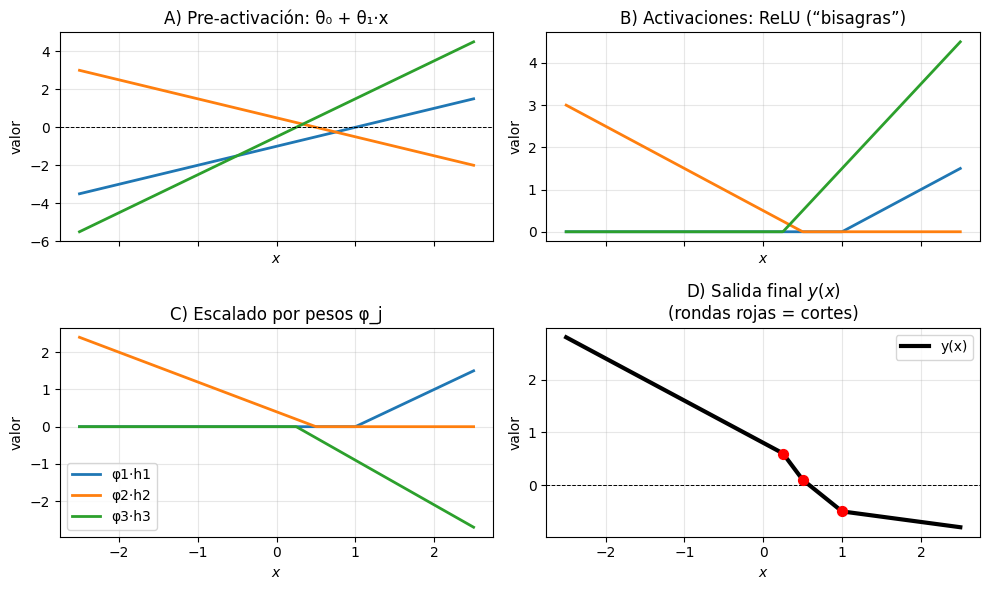

In [64]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── Parámetros de la red ──────────
n_hidden = 3                                  # nº de unidades ocultas
theta    = np.array([[-1.0,  1.0],            # [θ10, θ11]
                     [ 0.5, -1.0],            # [θ20, θ21]
                     [-0.5,  2.0]])[:n_hidden]
phi      = np.array([0.4,  1.0,  0.8, -0.6])   # [φ0, φ1, φ2, φ3]

# ───────── Dominio de entrada ────────────
x = np.linspace(-2.5, 2.5, 400)

# ───────── Cálculos paso a paso ───────────
# (1) Pre‐activaciones z_j(x) = θ_j0 + θ_j1·x
h_lin   = theta[:,0,None] + theta[:,1,None] * x      # forma: (n_hidden, len(x))
# (2) Aplicar ReLU → h_relu[j] = max(0, z_j)
h_relu  = np.maximum(0, h_lin)
# (3) Escalar cada ReLU por φ_j y sumar sesgo φ0
h_scaled= phi[1:,None] * h_relu
y_final = phi[0] + h_scaled.sum(axis=0)

# ───────── Calcular los "breakpoints" x*_j donde θ_j0 + θ_j1·x = 0 ─────────
breaks = []
for j in range(n_hidden):
    θ0, θ1 = theta[j]
    if θ1 != 0:
        xj = -θ0/θ1
        # chequear que xj esté dentro del dominio mostrado (si quieres filtrar)
        if x.min() <= xj <= x.max():
            breaks.append(xj)

# ───────── Plotting con las cuatro ventanas A–D ─────────────────────
fig, axes = plt.subplots(2, 2, figsize=(10,6), sharex=True)
axes = axes.ravel()
colors = ['tab:blue','tab:orange','tab:green']

# Panel A – rectas originales (pre‐activación)
for j in range(n_hidden):
    axes[0].plot(x, h_lin[j], color=colors[j], lw=2)
axes[0].set_title('A) Pre-activación: θ₀ + θ₁·x')
axes[0].axhline(0, color='k', ls='--', lw=0.7)
axes[0].grid(alpha=0.3)

# Panel B – ReLU aplicada
for j in range(n_hidden):
    axes[1].plot(x, h_relu[j], color=colors[j], lw=2)
axes[1].set_title('B) Activaciones: ReLU (“bisagras”)')
axes[1].grid(alpha=0.3)

# Panel C – cada ReLU escalada por φ_j
for j in range(n_hidden):
    axes[2].plot(x, h_scaled[j], color=colors[j], lw=2,
                 label=fr'φ{j+1}·h{j+1}')
axes[2].set_title('C) Escalado por pesos φ_j')
axes[2].legend()
axes[2].grid(alpha=0.3)

# Panel D – suma final + sesgo φ0, marcando los cortes
axes[3].plot(x, y_final, color='k', lw=3, label='y(x)')
axes[3].axhline(0, color='k', ls='--', lw=0.7)

# Dibujar un punto rojo en cada xj para marcar el corte
for xj in breaks:
    # obtener el valor y(xj) interpolando directamente del arreglo
    yj = np.interp(xj, x, y_final)
    axes[3].scatter([xj], [yj], color='red', s=50, zorder=5)

axes[3].set_title('D) Salida final $y(x)$\n(rondas rojas = cortes)')
axes[3].grid(alpha=0.3)
axes[3].legend()

for ax in axes:
    ax.set_xlabel('$x$')
    ax.set_ylabel('valor')

plt.tight_layout()
plt.show()


## Regiones lineales (analisis)

**La idea es entender que estamos trabajando en un espacio y lo "llenamos" con regiones lineales**, entonces es importante saber cuantas regiones lineales pueden haber. Mientras mas, mas flexibilidad tiene el modelo, mas capacidad.

La cantidad de regiones lineales (en shallow network) esta dado por: **numero de hidden units** y **dimension de input**

---

PARA 1D INPUT y N NEURONAS EN HIDDEN LAYER:

Se generan **n+1 regiones lineales**, porque hay n  cortes (cada neurona aporta un corte) -> esto es como maximo (puede estar en el mismo lugar el corte)

---

Si hay mas dimensiones de input, En dimensiones más altas, cada neurona ReLU en paralelo “corta” el espacio con un hiperplano distinto, y el número máximo de regiones poligonales que se pueden formar crece combinatoriamente con n y d.

**Regiones lineales en 2D con $n$ unidades ocultas**

* Cada unidad oculta $j$ aporta un **hiperplano** (en 2D, una línea) $\{\,(x_{1},x_{2}):\;z_{j}=0\,\}$.
* Ese hiperplano separa el campo $(x_{1},x_{2})$ en dos semiplanos:

  * En uno $\,z_{j}<0$ y $h_{j}=0$.
  * En el otro $\,z_{j}\ge0$ y $h_{j}=z_{j}$.
* Con $n$ líneas independientes, el número máximo de **regiones poligonales** en que se puede partir el plano $(x_{1},x_{2})$ es

  $$
    1 \;+\; n \;+\; \frac{n(n-1)}{2} \;=\; \frac{n^{2} + n + 2}{2}.
  $$

  Dentro de cada región poligonal la función final $y(x_{1},x_{2})$ es **una sola lámina lineal** (sin más quiebres), porque en esa región cada ReLU está o apagada (0) o “abierta” (devolviendo exactamente su $z_{j}$).
* En el ejemplo con $n=3$ líneas, puedes llegar a tener hasta

  $$
    \frac{3^{2} + 3 + 2}{2} \;=\; \frac{14}{2} \;=\; 7 
  $$

  regiones distintas. Cada una de esas 7 regiones tendría su propia pendiente lineal para $y$. En el panel D verás el efecto de esas divisiones: la superficie final “se monta” en diferentes planos según la combinación de ReLU activas.


---

**Regla general**

Número de regiones lineales vs. dimensiones de entrada. 

1. Con una única dimensión de entrada, un modelo con una unidad oculta crea una unión, que divide el eje en dos regiones lineales.
2. Con dos dimensiones de entrada, un modelo con dos unidades ocultas puede dividir el espacio de entrada usando dos líneas (aquí alineadas con los ejes) para crear cuatro regiones.
3. Con tres dimensiones de entrada, un modelo con tres unidades ocultas puede dividir el espacio de entrada usando tres planos (nuevamente alineados con los ejes) para crear ocho regiones. 
4. Continuando este argumento, se deduce que un modelo con Di dimensiones de entrada y Di unidades ocultas puede dividir el espacio de entrada con Di hiperplanos para crear 2^Di regiones lineales.

![Linear Regions per Input Dimension](images/linear_regions_per_input_dim.PNG)

En una dimension de entrada se divide en 2, con 2 dimensiones, en 4, con tres, en 8...

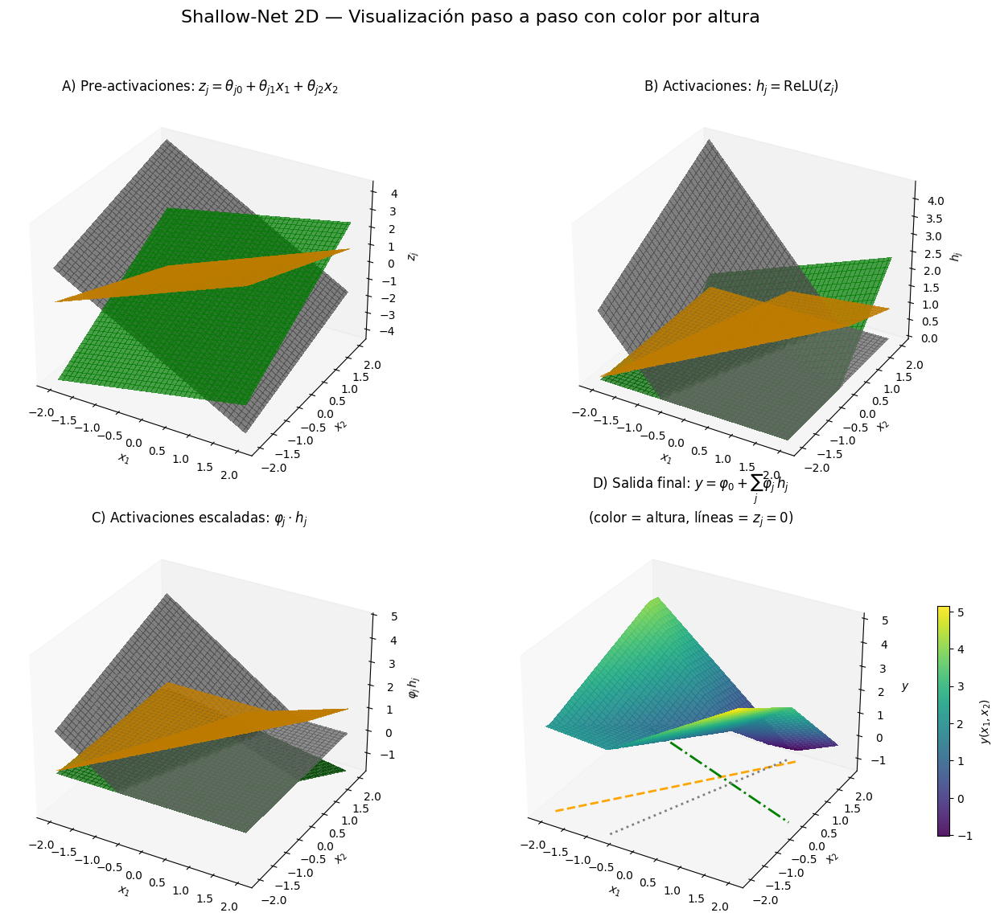

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # necesario para proyecciones 3D

# ───────── Parámetros de la red (3 unidades ocultas) ─────────
# Cada fila de theta = [θ_j0, θ_j1, θ_j2], de modo que
# z_j(x1,x2) = θ_j0 + θ_j1·x1 + θ_j2·x2
theta = np.array([
    [ 0.5,  1.0, -0.8],   # θ10, θ11, θ12  (unidad oculta 1)
    [-1.0,  0.5,  1.2],   # θ20, θ21, θ22  (unidad oculta 2)
    [ 0.2, -1.5,  0.6]    # θ30, θ31, θ32  (unidad oculta 3)
])
# Pesos de la capa de salida: [φ0, φ1, φ2, φ3]
phi = np.array([0.3,  1.2,  -0.7,  0.9])

# ───────── Dominio de entrada 2D ─────────
n = 80  # tamaño de la rejilla por eje
x1 = np.linspace(-2, 2, n)
x2 = np.linspace(-2, 2, n)
X1, X2 = np.meshgrid(x1, x2)

# ───────── Cálculos paso a paso ─────────
# 1) Pre‐activaciones: z_j(x1,x2) = θ_j0 + θ_j1·x1 + θ_j2·x2
Z = np.zeros((3, n, n))
for j in range(3):
    θ0, θ1, θ2 = theta[j]
    Z[j] = θ0 + θ1 * X1 + θ2 * X2

# 2) Activaciones ReLU: h_j = max(0, Z[j])
H = np.maximum(0, Z)

# 3) Activaciones escaladas: φ_j * h_j  (j=1,2,3)
H_scaled = np.zeros_like(H)
for j in range(3):
    H_scaled[j] = phi[j+1] * H[j]

# 4) Salida final: y(x1,x2) = φ0 + Σ φ_j * h_j
Y = phi[0] + np.sum(H_scaled, axis=0)

# ───────── Dibujo de las 4 visualizaciones (2×2) ─────────
fig = plt.figure(figsize=(14, 12))
fig.suptitle("Shallow‐Net 2D — Visualización paso a paso con color por altura", fontsize=16)

# Colores para las tres unidades ocultas
colors = ['orange','green','gray']

# — Panel A: planos de pre‐activación z₁, z₂, z₃ —
axA = fig.add_subplot(2, 2, 1, projection='3d')
for j, c in zip(range(3), colors):
    axA.plot_surface(
        X1, X2, Z[j],
        color=c, alpha=0.7, linewidth=0, antialiased=False
    )
axA.set_title("A) Pre‐activaciones: $z_j = θ_{j0} + θ_{j1}x_1 + θ_{j2}x_2$")
axA.set_xlabel("$x_1$")
axA.set_ylabel("$x_2$")
axA.set_zlabel("$z_j$")
axA.view_init(elev=30, azim=-60)
axA.grid(False)

# — Panel B: activaciones ReLU h₁, h₂, h₃ —
axB = fig.add_subplot(2, 2, 2, projection='3d')
for j, c in zip(range(3), colors):
    axB.plot_surface(
        X1, X2, H[j],
        color=c, alpha=0.7, linewidth=0, antialiased=False
    )
axB.set_title("B) Activaciones: $h_j = \\mathrm{ReLU}(z_j)$")
axB.set_xlabel("$x_1$")
axB.set_ylabel("$x_2$")
axB.set_zlabel("$h_j$")
axB.view_init(elev=30, azim=-60)
axB.grid(False)

# — Panel C: activaciones escaladas φ_j·h_j —
axC = fig.add_subplot(2, 2, 3, projection='3d')
for j, c in zip(range(3), colors):
    axC.plot_surface(
        X1, X2, H_scaled[j],
        color=c, alpha=0.7, linewidth=0, antialiased=False
    )
axC.set_title("C) Activaciones escaladas: $\\varphi_j \\cdot h_j$")
axC.set_xlabel("$x_1$")
axC.set_ylabel("$x_2$")
axC.set_zlabel("$\\varphi_j\,h_j$")
axC.view_init(elev=30, azim=-60)
axC.grid(False)

# — Panel D: suma final y = φ₀ + Σ φ_j·h_j, coloreada según altura, con contornos z_j = 0 —
axD = fig.add_subplot(2, 2, 4, projection='3d')
# 4a) Superficie final con colormap según altura
surf = axD.plot_surface(
    X1, X2, Y,
    cmap='viridis',         # usa un colormap que colorea según z = Y
    alpha=0.9, linewidth=0, antialiased=False
)
# Añadir barra de color para la altura
fig.colorbar(surf, ax=axD, pad=0.1, shrink=0.6, label='$y(x_1,x_2)$')

# 4b) Dibujar las líneas donde z_j(x1,x2) = 0 para marcar los cortes
z_min = float(np.min(Y)) - 0.5
for j, (c, ls) in enumerate(zip(colors, ['--','-.',':'])):
    axD.contour(
        X1, X2, Z[j],
        levels=[0],
        colors=[c],
        linestyles=[ls],
        linewidths=2,
        zdir='z',
        offset=z_min
    )

axD.set_zlim(z_min, np.max(Y))
axD.set_title("D) Salida final: $y=\\varphi_0 + \\sum_j \\varphi_j\,h_j$\n(color = altura, líneas = $z_j=0$)")
axD.set_xlabel("$x_1$")
axD.set_ylabel("$x_2$")
axD.set_zlabel("$y$")
axD.view_init(elev=30, azim=-60)
axD.grid(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


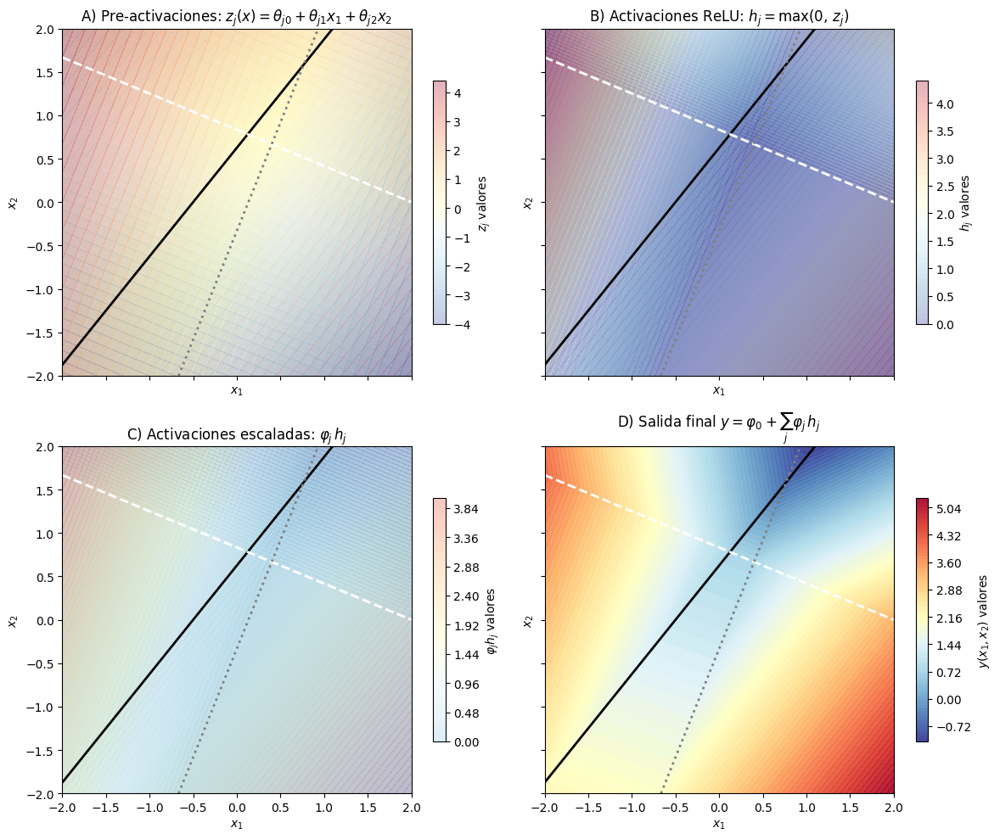

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── Parámetros de la red (3 unidades ocultas) ─────────
# Cada fila de theta = [θ_j0, θ_j1, θ_j2], de modo que
# z_j(x1,x2) = θ_j0 + θ_j1·x1 + θ_j2·x2
theta = np.array([
    [ 0.5,  1.0, -0.8],   # θ10, θ11, θ12  (unidad oculta 1)
    [-1.0,  0.5,  1.2],   # θ20, θ21, θ22  (unidad oculta 2)
    [ 0.2, -1.5,  0.6]    # θ30, θ31, θ32  (unidad oculta 3)
])
# Pesos de la capa de salida: [φ0, φ1, φ2, φ3]
phi = np.array([0.3,  1.2,  -0.7,  0.9])

# ───────── Dominio de entrada 2D ─────────
n = 200  # resolución de la rejilla en cada eje
x1 = np.linspace(-2, 2, n)
x2 = np.linspace(-2, 2, n)
X1, X2 = np.meshgrid(x1, x2)

# ───────── Cálculos paso a paso ─────────
# 1) Pre‐activaciones: Z[j] = θ_j0 + θ_j1·X1 + θ_j2·X2
Z = np.zeros((3, n, n))
for j in range(3):
    θ0, θ1, θ2 = theta[j]
    Z[j] = θ0 + θ1*X1 + θ2*X2

# 2) Activaciones ReLU: H[j] = max(0, Z[j])
H = np.maximum(0, Z)

# 3) Activaciones escaladas: H_scaled[j] = φ_{j+1} * H[j]
H_scaled = np.zeros_like(H)
for j in range(3):
    H_scaled[j] = phi[j+1] * H[j]

# 4) Salida final: Y = φ0 + Σ_{j=1..3} φ_j * H[j]
Y = phi[0] + H_scaled.sum(axis=0)

# ───────── Dibujo de las 4 visualizaciones (2×2) en 2D ─────────
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=True)
axes = axes.ravel()
cmap = 'RdYlBu_r'

# Colores para las líneas z_j=0 (cada unidad oculta)
line_colors = ['black', 'white', 'gray']
line_styles = ['-', '--', ':']

# Panel A: Pre‐activaciones Z[j]
ax = axes[0]
for j in range(3):
    # pintamos cada Z[j] en semitransparencia
    cf = ax.contourf(X1, X2, Z[j],
                     levels=50,
                     cmap=cmap,
                     alpha=0.3,
                     vmin=Z.min(), vmax=Z.max())
    # dibujamos línea donde Z[j]=0
    ax.contour(X1, X2, Z[j],
               levels=[0],
               colors=[line_colors[j]],
               linestyles=[line_styles[j]],
               linewidths=2)
ax.set_title("A) Pre‐activaciones: $z_j(x)=θ_{j0}+θ_{j1}x_1+θ_{j2}x_2$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
# opcional: añadir barra de color para Z (la misma para todos)
cbar = fig.colorbar(cf, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('$z_j$ valores')

# Panel B: Activaciones ReLU H[j]
ax = axes[1]
for j in range(3):
    cf = ax.contourf(X1, X2, H[j],
                     levels=50,
                     cmap=cmap,
                     alpha=0.3,
                     vmin=0, vmax=H.max())
    # dibujar la misma línea Z[j]=0 para indicar dónde cambia
    ax.contour(X1, X2, Z[j],
               levels=[0],
               colors=[line_colors[j]],
               linestyles=[line_styles[j]],
               linewidths=2)
ax.set_title("B) Activaciones ReLU: $h_j = \\max(0,\,z_j)$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
cbar = fig.colorbar(cf, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('$h_j$ valores')

# Panel C: Activaciones escaladas φ_j·H[j]
ax = axes[2]
for j in range(3):
    cf = ax.contourf(X1, X2, H_scaled[j],
                     levels=50,
                     cmap=cmap,
                     alpha=0.3,
                     vmin=H_scaled.min(), vmax=H_scaled.max())
    ax.contour(X1, X2, Z[j],
               levels=[0],
               colors=[line_colors[j]],
               linestyles=[line_styles[j]],
               linewidths=2)
ax.set_title("C) Activaciones escaladas: $\\varphi_j\\,h_j$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
cbar = fig.colorbar(cf, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('$\\varphi_j h_j$ valores')

# Panel D: Salida final Y, coloreada con líneas de bisagra z_j=0
ax = axes[3]
cf = ax.contourf(X1, X2, Y,
                 levels=100,
                 cmap=cmap,
                 alpha=0.9,
                 vmin=Y.min(), vmax=Y.max())
# Dibujar las líneas donde z_j=0 para marcar regiones
for j in range(3):
    ax.contour(X1, X2, Z[j],
               levels=[0],
               colors=[line_colors[j]],
               linestyles=[line_styles[j]],
               linewidths=2)
ax.set_title(r"D) Salida final $y = \varphi_0 + \sum_j \varphi_j\,h_j$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
cbar = fig.colorbar(cf, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('$y(x_1, x_2)$ valores')

plt.tight_layout()
plt.show()


REGIONES LINEALES CON OTRAS ACTIVACIONES

- threshold
- ReLU
- sigmoid

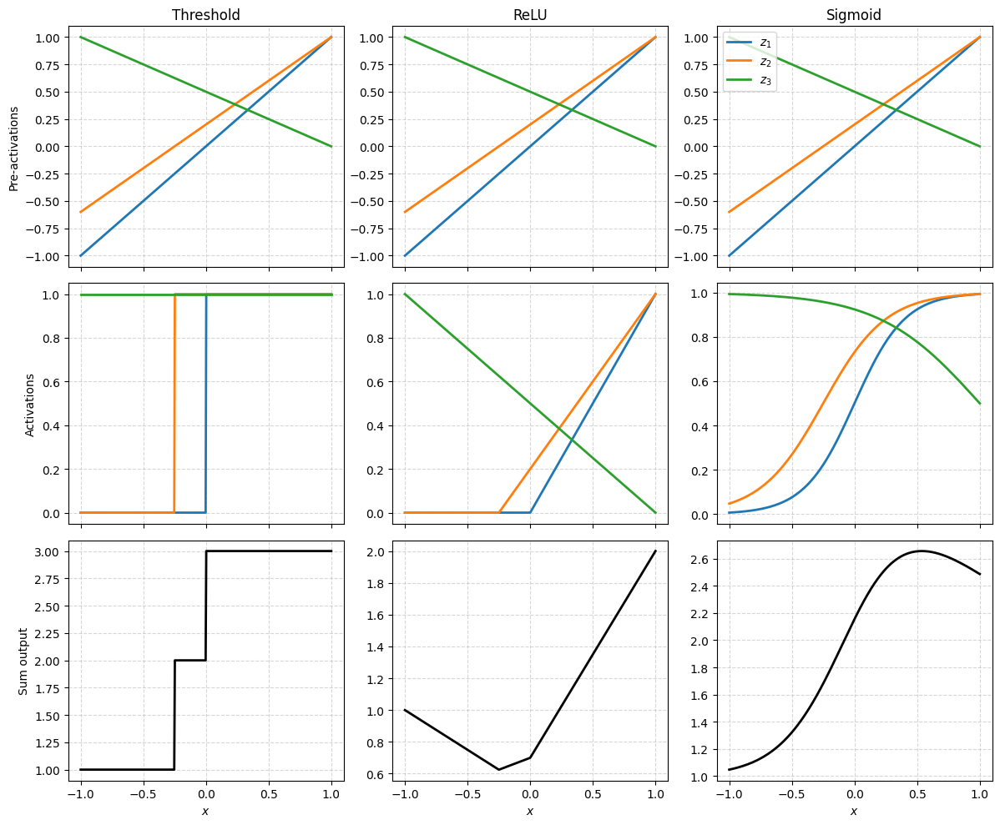

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── Dominio de entrada 1D ─────────
x = np.linspace(-1, 1, 400)

# ───────── Pre‐activaciones (mismas tres funciones lineales) ─────────
z1 = x
z2 = 0.8 * x + 0.2
z3 = -0.5 * x + 0.5

# Definir activaciones
def step(x):
    return (x >= 0).astype(float)

def relu(x):
    return np.maximum(0, x)

def sigmoid(x):
    return 1 / (1 + np.exp(-5 * x))  # pendiente aguda

# Calcular activaciones
h_step = np.vstack([step(z1), step(z2), step(z3)])
h_relu = np.vstack([relu(z1), relu(z2), relu(z3)])
h_sig  = np.vstack([sigmoid(z1), sigmoid(z2), sigmoid(z3)])

# Sumar contribuciones
sum_step = np.sum(h_step, axis=0)
sum_relu = np.sum(h_relu, axis=0)
sum_sig  = np.sum(h_sig,  axis=0)

# ───────── Plot 3x3 paneles ─────────
fig, axes = plt.subplots(3, 3, figsize=(12, 10), sharex=True)
activations = ['Threshold', 'ReLU', 'Sigmoid']
# Row 1: preactivations
for col, ax in enumerate(axes[0]):
    ax.plot(x, z1, 'C0', lw=2, label='$z_1$')
    ax.plot(x, z2, 'C1', lw=2, label='$z_2$')
    ax.plot(x, z3, 'C2', lw=2, label='$z_3$')
    ax.set_title(activations[col])
    if col == 0:
        ax.set_ylabel('Pre-activations')
    ax.grid(ls='--', alpha=0.5)
    if col == 2:
        ax.legend(loc='upper left')

# Row 2: activations
for col, (h, ax) in enumerate(zip([h_step, h_relu, h_sig], axes[1])):
    ax.plot(x, h[0], 'C0', lw=2)
    ax.plot(x, h[1], 'C1', lw=2)
    ax.plot(x, h[2], 'C2', lw=2)
    if col == 0:
        ax.set_ylabel('Activations')
    ax.grid(ls='--', alpha=0.5)

# Row 3: sum of activations
for col, (s, ax) in enumerate(zip([sum_step, sum_relu, sum_sig], axes[2])):
    ax.plot(x, s, 'k', lw=2)
    ax.set_xlabel('$x$')
    if col == 0:
        ax.set_ylabel('Sum output')
    ax.grid(ls='--', alpha=0.5)

plt.tight_layout()
plt.show()


## XOR con shallow network

Si no usamos activacion en la output neuron, podemos hacer que >0 sea de una clase y <=0 sea de la otra.

Podriamos usarla igual...

Entonces con dos inputs, dos hidden units y una output neuron se puede resolver XOR. Se crean 3 (n+1) regiones lineales

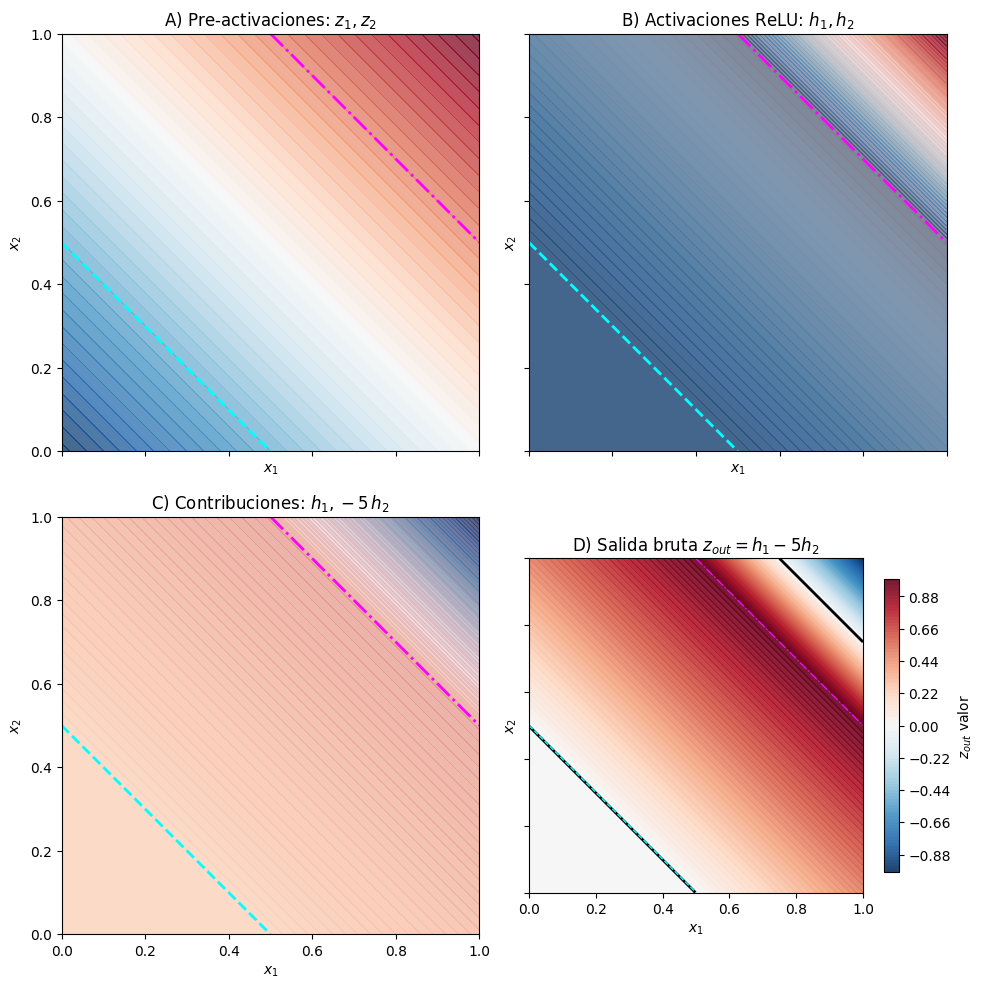

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── Definir la red XOR con 2 ReLU ocultas y salida lineal ─────────
def compute_maps(n=300):
    x = np.linspace(0, 1, n)
    X1, X2 = np.meshgrid(x, x)
    # Pre-activaciones
    Z1 = X1 + X2 - 0.5       # bisagra 1 en x1+x2 = 0.5
    Z2 = X1 + X2 - 1.5       # bisagra 2 en x1+x2 = 1.5
    # Activaciones ReLU
    H1 = np.maximum(0, Z1)
    H2 = np.maximum(0, Z2)
    # Contribuciones escaladas
    C1 = H1               # φ1 = +1
    C2 = -5 * H2          # φ2 = -5
    # Salida bruta
    Z_out = C1 + C2       # φ0 = 0
    return X1, X2, Z1, Z2, H1, H2, C1, C2, Z_out

# ───────── Crear mapas ─────────
X1, X2, Z1, Z2, H1, H2, C1, C2, Z_out = compute_maps()

# ───────── Dibujo 4 paneles ─────────
fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
axes = axes.ravel()
cmap = 'RdBu_r'

# Colores y estilos para las bisagras
contour_colors = ['cyan', 'magenta']
contour_styles = ['--', '-.']

# Panel A: pre-activaciones Z1, Z2
ax = axes[0]
ax.contourf(X1, X2, Z1, levels=50, cmap=cmap, alpha=0.5, vmin=Z1.min(), vmax=Z1.max())
ax.contourf(X1, X2, Z2, levels=50, cmap=cmap, alpha=0.5, vmin=Z2.min(), vmax=Z2.max())
# Líneas de bisagra
ax.contour(X1, X2, Z1, levels=[0], colors=[contour_colors[0]], linestyles=[contour_styles[0]], linewidths=2)
ax.contour(X1, X2, Z2, levels=[0], colors=[contour_colors[1]], linestyles=[contour_styles[1]], linewidths=2)
ax.set_title("A) Pre-activaciones: $z_1,z_2$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_aspect('equal')

# Panel B: activaciones ReLU H1, H2
ax = axes[1]
ax.contourf(X1, X2, H1, levels=50, cmap=cmap, alpha=0.5, vmin=0, vmax=H1.max())
ax.contourf(X1, X2, H2, levels=50, cmap=cmap, alpha=0.5, vmin=0, vmax=H2.max())
# Líneas de bisagra de Z1, Z2
ax.contour(X1, X2, Z1, levels=[0], colors=[contour_colors[0]], linestyles=[contour_styles[0]], linewidths=2)
ax.contour(X1, X2, Z2, levels=[0], colors=[contour_colors[1]], linestyles=[contour_styles[1]], linewidths=2)
ax.set_title("B) Activaciones ReLU: $h_1,h_2$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_aspect('equal')

# Panel C: contribuciones C1, C2
ax = axes[2]
ax.contourf(X1, X2, C1, levels=50, cmap=cmap, alpha=0.5, vmin=min(C1.min(), C2.min()), vmax=max(C1.max(), C2.max()))
ax.contourf(X1, X2, C2, levels=50, cmap=cmap, alpha=0.5, vmin=min(C1.min(), C2.min()), vmax=max(C1.max(), C2.max()))
# Líneas de bisagra
ax.contour(X1, X2, Z1, levels=[0], colors=[contour_colors[0]], linestyles=[contour_styles[0]], linewidths=2)
ax.contour(X1, X2, Z2, levels=[0], colors=[contour_colors[1]], linestyles=[contour_styles[1]], linewidths=2)
ax.set_title("C) Contribuciones: $h_1, -5\,h_2$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_aspect('equal')

# Panel D: salida bruta Z_out y frontera Z_out = 0
ax = axes[3]
cf = ax.contourf(X1, X2, Z_out, levels=100, cmap=cmap, alpha=0.9, vmin=Z_out.min(), vmax=Z_out.max())
ax.contour(X1, X2, Z_out, levels=[0], colors='k', linewidths=2)
# Bisagras
ax.contour(X1, X2, Z1, levels=[0], colors=[contour_colors[0]], linestyles=[contour_styles[0]], linewidths=1)
ax.contour(X1, X2, Z2, levels=[0], colors=[contour_colors[1]], linestyles=[contour_styles[1]], linewidths=1)
ax.set_title("D) Salida bruta $z_{out}=h_1 - 5h_2$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_aspect('equal')

# Barra de color para panel D
cbar = fig.colorbar(cf, ax=axes[3], orientation='vertical', shrink=0.7)
cbar.set_label('$z_{out}$ valor')

plt.tight_layout()
plt.show()


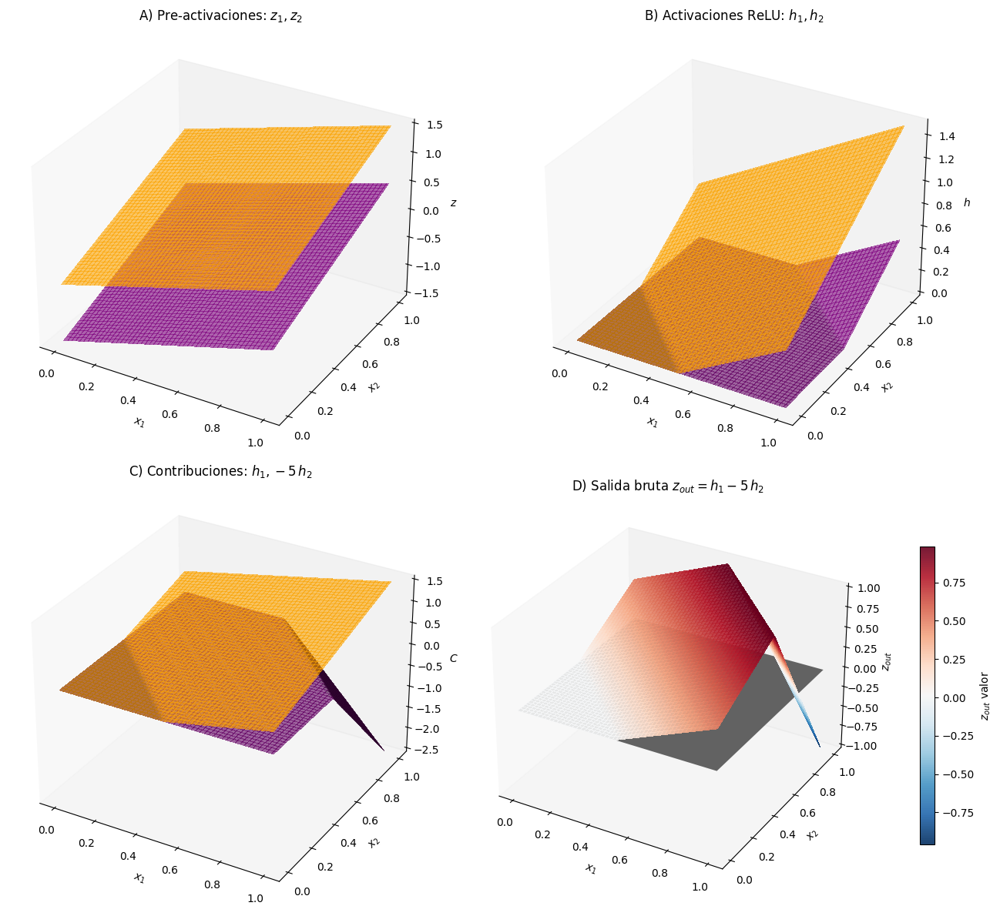

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ───────── Definir la red XOR con 2 ReLU ocultas y salida lineal ─────────
def compute_maps(n=100):
    x = np.linspace(0, 1, n)
    X1, X2 = np.meshgrid(x, x)
    # Pre-activaciones
    Z1 = X1 + X2 - 0.5       # bisagra 1 en x1+x2 = 0.5
    Z2 = X1 + X2 - 1.5       # bisagra 2 en x1+x2 = 1.5
    # Activaciones ReLU
    H1 = np.maximum(0, Z1)
    H2 = np.maximum(0, Z2)
    # Contribuciones escaladas
    C1 = H1               # φ1 = +1
    C2 = -5 * H2          # φ2 = -5
    # Salida bruta
    Z_out = C1 + C2       # φ0 = 0
    return X1, X2, Z1, Z2, H1, H2, C1, C2, Z_out

# ───────── Crear mapas ─────────
X1, X2, Z1, Z2, H1, H2, C1, C2, Z_out = compute_maps(n=100)

# ───────── Dibujo 4 paneles 3D ─────────
fig = plt.figure(figsize=(14, 12))

# Panel A: Pre-activaciones Z1, Z2
axA = fig.add_subplot(2, 2, 1, projection='3d')
axA.plot_surface(X1, X2, Z1, color='orange', alpha=0.6, linewidth=0, antialiased=False)
axA.plot_surface(X1, X2, Z2, color='purple', alpha=0.6, linewidth=0, antialiased=False)
axA.set_title("A) Pre-activaciones: $z_1, z_2$")
axA.set_xlabel("$x_1$")
axA.set_ylabel("$x_2$")
axA.set_zlabel("$z$")
axA.view_init(elev=30, azim=-60)
axA.grid(False)

# Panel B: Activaciones ReLU H1, H2
axB = fig.add_subplot(2, 2, 2, projection='3d')
axB.plot_surface(X1, X2, H1, color='orange', alpha=0.6, linewidth=0, antialiased=False)
axB.plot_surface(X1, X2, H2, color='purple', alpha=0.6, linewidth=0, antialiased=False)
axB.set_title("B) Activaciones ReLU: $h_1, h_2$")
axB.set_xlabel("$x_1$")
axB.set_ylabel("$x_2$")
axB.set_zlabel("$h$")
axB.view_init(elev=30, azim=-60)
axB.grid(False)

# Panel C: Contribuciones C1, C2
axC = fig.add_subplot(2, 2, 3, projection='3d')
axC.plot_surface(X1, X2, C1, color='orange', alpha=0.6, linewidth=0, antialiased=False)
axC.plot_surface(X1, X2, C2, color='purple', alpha=0.6, linewidth=0, antialiased=False)
axC.set_title("C) Contribuciones: $h_1, -5\,h_2$")
axC.set_xlabel("$x_1$")
axC.set_ylabel("$x_2$")
axC.set_zlabel("$C$")
axC.view_init(elev=30, azim=-60)
axC.grid(False)

# Panel D: Salida bruta Z_out con contorno de frontera z=0
axD = fig.add_subplot(2, 2, 4, projection='3d')
surf = axD.plot_surface(
    X1, X2, Z_out,
    cmap='RdBu_r', alpha=0.9, linewidth=0, antialiased=False
)
# Dibujar plano z=0
xx = np.linspace(0, 1, 2)
yy = np.linspace(0, 1, 2)
PX, PY = np.meshgrid(xx, yy)
PZ = np.zeros_like(PX)
axD.plot_surface(PX, PY, PZ, color='gray', alpha=1.0)
axD.set_title("D) Salida bruta $z_{out} = h_1 - 5\,h_2$")
axD.set_xlabel("$x_1$")
axD.set_ylabel("$x_2$")
axD.set_zlabel("$z_{out}$")
axD.view_init(elev=30, azim=-60)
axD.grid(False)

# Barra de color para panel D
fig.colorbar(surf, ax=axD, pad=0.1, shrink=0.7, label='$z_{out}$ valor')

plt.tight_layout()
plt.show()


CON SIGMOID FUNCTION

Se nota mucho mejor. En vez de hacer <0 o >=0, aca ya tenemos todo entre 0 y 1 por lo que mientras mas alto sea, mas prob de una clase y menos de la otra. Se puede interpretar como una probabilidad.

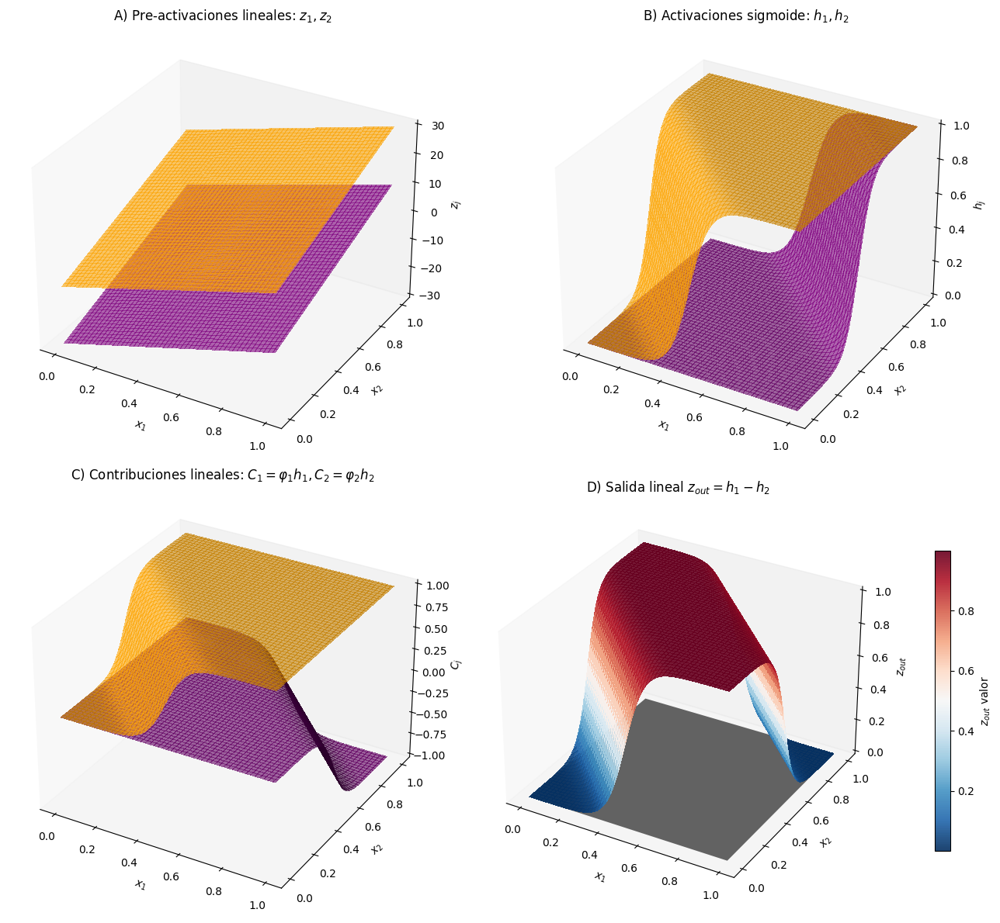

In [83]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ───────── Parámetros y definiciones para XOR con sigmoid en ocultas ─────────
k = 20.0  # pendiente de las sigmoides para aproximar step
phi1, phi2 = 1.0, -1.0  # pesos de salida para las dos sigmoides

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def compute_maps_sigmoid(n=100):
    x = np.linspace(0, 1, n)
    X1, X2 = np.meshgrid(x, x)
    # Pre-activaciones lineales (planos) para cada unidad oculta
    Z1 = k * (X1 + X2 - 0.5)  # activa cerca de x1+x2=0.5
    Z2 = k * (X1 + X2 - 1.5)  # activa cerca de x1+x2=1.5
    # Activaciones sigmoide
    H1 = sigmoid(Z1)
    H2 = sigmoid(Z2)
    # Contribuciones escaladas
    C1 = phi1 * H1
    C2 = phi2 * H2
    # Salida lineal sin activación final
    Z_out = C1 + C2
    return X1, X2, Z1, Z2, H1, H2, C1, C2, Z_out

# ───────── Crear mapas ─────────
X1, X2, Z1, Z2, H1, H2, C1, C2, Z_out = compute_maps_sigmoid(n=100)

# ───────── Dibujo de los 4 paneles en 3D ─────────
fig = plt.figure(figsize=(14, 12))
colors = ['orange', 'purple']

# Panel A: Pre-activaciones Z1 y Z2
axA = fig.add_subplot(2, 2, 1, projection='3d')
axA.plot_surface(X1, X2, Z1, color=colors[0], alpha=0.6, linewidth=0, antialiased=False)
axA.plot_surface(X1, X2, Z2, color=colors[1], alpha=0.6, linewidth=0, antialiased=False)
axA.set_title("A) Pre-activaciones lineales: $z_1, z_2$")
axA.set_xlabel("$x_1$")
axA.set_ylabel("$x_2$")
axA.set_zlabel("$z_j$")
axA.view_init(elev=30, azim=-60)
axA.grid(False)

# Panel B: Activaciones sigmoide H1 y H2
axB = fig.add_subplot(2, 2, 2, projection='3d')
axB.plot_surface(X1, X2, H1, color=colors[0], alpha=0.6, linewidth=0, antialiased=False)
axB.plot_surface(X1, X2, H2, color=colors[1], alpha=0.6, linewidth=0, antialiased=False)
axB.set_title("B) Activaciones sigmoide: $h_1, h_2$")
axB.set_xlabel("$x_1$")
axB.set_ylabel("$x_2$")
axB.set_zlabel("$h_j$")
axB.view_init(elev=30, azim=-60)
axB.grid(False)

# Panel C: Contribuciones C1=φ1*h1, C2=φ2*h2
axC = fig.add_subplot(2, 2, 3, projection='3d')
axC.plot_surface(X1, X2, C1, color=colors[0], alpha=0.6, linewidth=0, antialiased=False)
axC.plot_surface(X1, X2, C2, color=colors[1], alpha=0.6, linewidth=0, antialiased=False)
axC.set_title("C) Contribuciones lineales: $C_1=φ_1 h_1, C_2=φ_2 h_2$")
axC.set_xlabel("$x_1$")
axC.set_ylabel("$x_2$")
axC.set_zlabel("$C_j$")
axC.view_init(elev=30, azim=-60)
axC.grid(False)

# Panel D: Salida bruta Z_out = C1 + C2 con plano z=0
axD = fig.add_subplot(2, 2, 4, projection='3d')
surf = axD.plot_surface(
    X1, X2, Z_out,
    cmap='RdBu_r', alpha=0.9, linewidth=0, antialiased=False
)
# Plano z=0 para marcar frontera
xx = np.linspace(0, 1, 2)
yy = np.linspace(0, 1, 2)
PX, PY = np.meshgrid(xx, yy)
PZ = np.zeros_like(PX)
axD.plot_surface(PX, PY, PZ, color='gray', alpha=1.0)

axD.set_title("D) Salida lineal $z_{out} = h_1 - h_2$")
axD.set_xlabel("$x_1$")
axD.set_ylabel("$x_2$")
axD.set_zlabel("$z_{out}$")
axD.view_init(elev=30, azim=-60)
axD.grid(False)

# Barra de color en Panel D
fig.colorbar(surf, ax=axD, pad=0.1, shrink=0.7, label='$z_{out}$ valor')

plt.tight_layout()
plt.show()


**Shallow con threshold (no ReLU)**

Tambien se puede hacer con threshold, que es la funcion de activacion mas basica... 

Y con esto tambien se puede resolver XOR

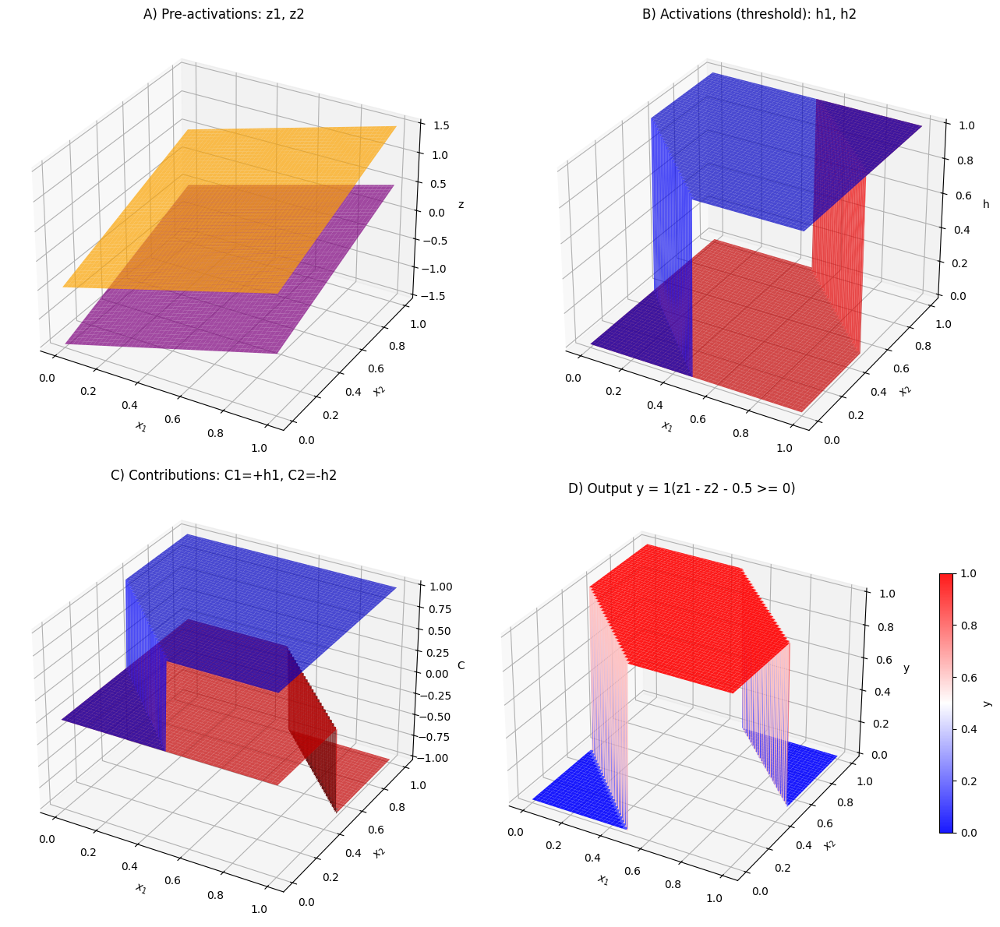

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ───────── Dominio de entrada 2D ─────────
n = 100
x = np.linspace(0, 1, n)
X1, X2 = np.meshgrid(x, x)

# ───────── Parámetros de la red threshold para XOR ─────────
# Hidden unit 1: OR
w1 = np.array([1.0, 1.0])
theta1 = 0.5  # threshold
# Hidden unit 2: AND
w2 = np.array([1.0, 1.0])
theta2 = 1.5  # threshold
# Output unit
v = np.array([1.0, -1.0])
theta_out = 0.5

# ───────── 1) Pre‐activations ocultas z1, z2 ─────────
Z1 = w1[0]*X1 + w1[1]*X2 - theta1
Z2 = w2[0]*X1 + w2[1]*X2 - theta2

# ───────── 2) Activations threshold h1, h2 ─────────
H1 = (Z1 >= 0).astype(float)
H2 = (Z2 >= 0).astype(float)

# ───────── 3) Contributions C1, C2 ─────────
C1 = v[0] * H1   # +1 * h1
C2 = v[1] * H2   # -1 * h2

# ───────── 4) Pre‐activation de salida z_out y activación final Y ─────────
Z_out = C1 + C2 - theta_out
Y = (Z_out >= 0).astype(float)

# ───────── Graficar 4 paneles 3D ─────────
fig = plt.figure(figsize=(14, 12))

# Panel A: pre‐activations Z1, Z2
axA = fig.add_subplot(2, 2, 1, projection='3d')
axA.plot_surface(X1, X2, Z1, color='orange', alpha=0.7, linewidth=0)
axA.plot_surface(X1, X2, Z2, color='purple', alpha=0.7, linewidth=0)
axA.set_title("A) Pre-activations: z1, z2")
axA.set_xlabel("$x_1$"); axA.set_ylabel("$x_2$"); axA.set_zlabel("z")
axA.view_init(elev=30, azim=-60)

# Panel B: activations H1, H2
axB = fig.add_subplot(2, 2, 2, projection='3d')
axB.plot_surface(X1, X2, H1, color='blue', alpha=0.7, linewidth=0)
axB.plot_surface(X1, X2, H2, color='red', alpha=0.7, linewidth=0)
axB.set_title("B) Activations (threshold): h1, h2")
axB.set_xlabel("$x_1$"); axB.set_ylabel("$x_2$"); axB.set_zlabel("h")
axB.view_init(elev=30, azim=-60)

# Panel C: contributions C1, C2
axC = fig.add_subplot(2, 2, 3, projection='3d')
axC.plot_surface(X1, X2, C1, color='blue', alpha=0.7, linewidth=0)
axC.plot_surface(X1, X2, C2, color='red', alpha=0.7, linewidth=0)
axC.set_title("C) Contributions: C1=+h1, C2=-h2")
axC.set_xlabel("$x_1$"); axC.set_ylabel("$x_2$"); axC.set_zlabel("C")
axC.view_init(elev=30, azim=-60)

# Panel D: final output Y
axD = fig.add_subplot(2, 2, 4, projection='3d')
surf = axD.plot_surface(X1, X2, Y, cmap='bwr', alpha=0.9, linewidth=0)
axD.set_title("D) Output y = 1(z1 - z2 - 0.5 >= 0)")
axD.set_xlabel("$x_1$"); axD.set_ylabel("$x_2$"); axD.set_zlabel("y")
axD.view_init(elev=30, azim=-60)
fig.colorbar(surf, ax=axD, pad=0.1, shrink=0.6, label='y')

plt.tight_layout()
plt.show()


Que se use el threshold como activacion no implica que la salida final del modelo siempre sea binaria. Al combinarlos, puede dar otros valores...

El problema es que no es diferenciable y aparte que perdes informacion al ser binaria en cada neurona, no capta ciertas cosas porque es menos expresiva, por eso por lo general usamos otra como ReLU o sigmoid

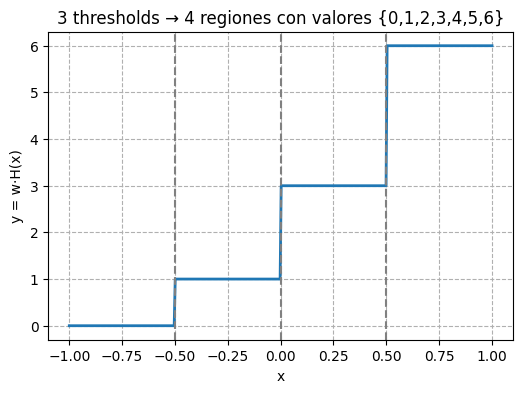

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# 3 neuronas ocultas threshold en x = -0.5, 0.0, +0.5
thresholds = [-0.5, 0.0, 0.5]
x = np.linspace(-1,1,400)

# H[j](x) = 1_{x >= thresholds[j]}
H = np.array([ (x >= t).astype(int) for t in thresholds ])

# pesos de salida (sin threshold)
w_out = np.array([1, 2, 3])

# salida lineal y(x) = sum_j w_out[j] * H[j](x)
y = w_out.dot(H)

# dibujar
plt.figure(figsize=(6,4))
plt.plot(x, y, lw=2)
for t in thresholds:
    plt.axvline(t, ls='--', color='gray')
plt.title("3 thresholds → 4 regiones con valores {0,1,2,3,4,5,6}")
plt.xlabel("x")
plt.ylabel("y = w·H(x)")
plt.grid(ls='--')
plt.show()


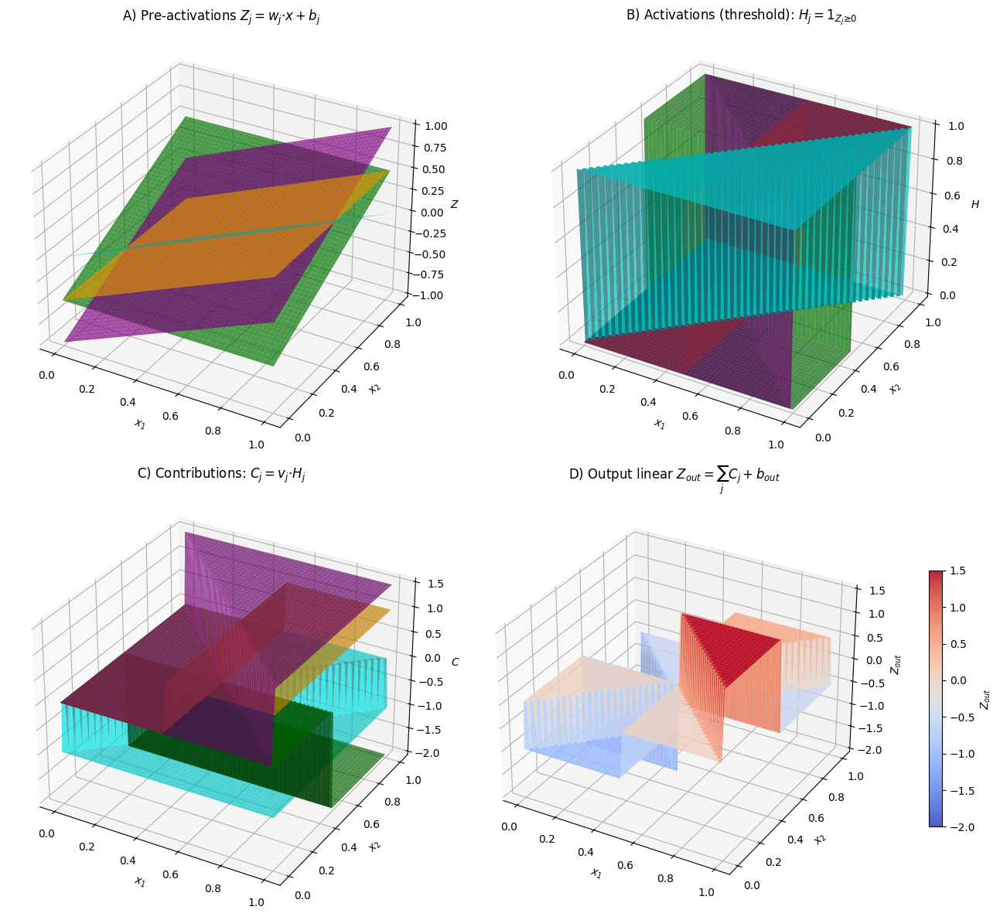

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ───────── Dominio de entrada 2D ─────────
n = 100
x = np.linspace(0, 1, n)
X1, X2 = np.meshgrid(x, x)

# ───────── Parámetros de la red threshold con 4 unidades ocultas ─────────
# Definimos 4 planos de corte (umbral)
# Z_j = w_j · x + b_j
W = np.array([
    [1.0,  0.0],   # z1 = x1 - 0.5
    [0.0,  1.0],   # z2 = x2 - 0.5
    [1.0,  1.0],   # z3 = x1 + x2 - 1.0
    [1.0, -1.0]    # z4 = x1 - x2 - 0.0
])
b = np.array([-0.5, -0.5, -1.0, 0.0])

# Pesos de salida para cada unidad oculta (sin activación final)
v = np.array([1.0, -2.0, 1.5, -1.0])
b_out = 0.0

# ───────── 1) Pre‐activaciones Z_h[j] ─────────
Z = np.zeros((4, n, n))
for j in range(4):
    Z[j] = W[j,0]*X1 + W[j,1]*X2 + b[j]

# ───────── 2) Activations threshold H[j] ─────────
H = (Z >= 0).astype(float)

# ───────── 3) Contributions C[j] = v[j]*H[j] ─────────
C = H * v[:, None, None]

# ───────── 4) Salida lineal Z_out ─────────
Z_out = np.sum(C, axis=0) + b_out

# ───────── Graficar 4 paneles 3D ─────────
fig = plt.figure(figsize=(14, 12))

# Panel A: Pre‐activaciones Z_j
axA = fig.add_subplot(2, 2, 1, projection='3d')
colors = ['orange','green','purple','cyan']
for j, color in enumerate(colors):
    axA.plot_surface(X1, X2, Z[j], color=color, alpha=0.7, linewidth=0)
axA.set_title("A) Pre‐activations $Z_j = w_j·x + b_j$")
axA.set_xlabel("$x_1$"); axA.set_ylabel("$x_2$"); axA.set_zlabel("$Z$")
axA.view_init(elev=30, azim=-60)

# Panel B: Activaciones threshold H[j]
axB = fig.add_subplot(2, 2, 2, projection='3d')
for j, color in enumerate(colors):
    axB.plot_surface(X1, X2, H[j], color=color, alpha=0.7, linewidth=0)
axB.set_title("B) Activations (threshold): $H_j = 1_{Z_j≥0}$")
axB.set_xlabel("$x_1$"); axB.set_ylabel("$x_2$"); axB.set_zlabel("$H$")
axB.view_init(elev=30, azim=-60)

# Panel C: Contributions C[j]
axC = fig.add_subplot(2, 2, 3, projection='3d')
for j, color in enumerate(colors):
    axC.plot_surface(X1, X2, C[j], color=color, alpha=0.7, linewidth=0)
axC.set_title("C) Contributions: $C_j = v_j·H_j$")
axC.set_xlabel("$x_1$"); axC.set_ylabel("$x_2$"); axC.set_zlabel("$C$")
axC.view_init(elev=30, azim=-60)

# Panel D: Salida lineal Z_out
axD = fig.add_subplot(2, 2, 4, projection='3d')
surf = axD.plot_surface(X1, X2, Z_out, cmap='coolwarm', alpha=0.9, linewidth=0)
axD.set_title("D) Output linear $Z_{out}=\\sum_j C_j + b_{out}$")
axD.set_xlabel("$x_1$"); axD.set_ylabel("$x_2$"); axD.set_zlabel("$Z_{out}$")
axD.view_init(elev=30, azim=-60)
fig.colorbar(surf, ax=axD, pad=0.1, shrink=0.6, label='$Z_{out}$')

plt.tight_layout()
plt.show()


## Aproximador Universal (shallow network)

Podemos aproximar cualquier funcion con muchas hidden units en la hidden layer

SOLO CON 4 HIDDEN UNITS Y SIGMOID ACTIVATION (TAMBIEN EN OUTPUT NEURON)

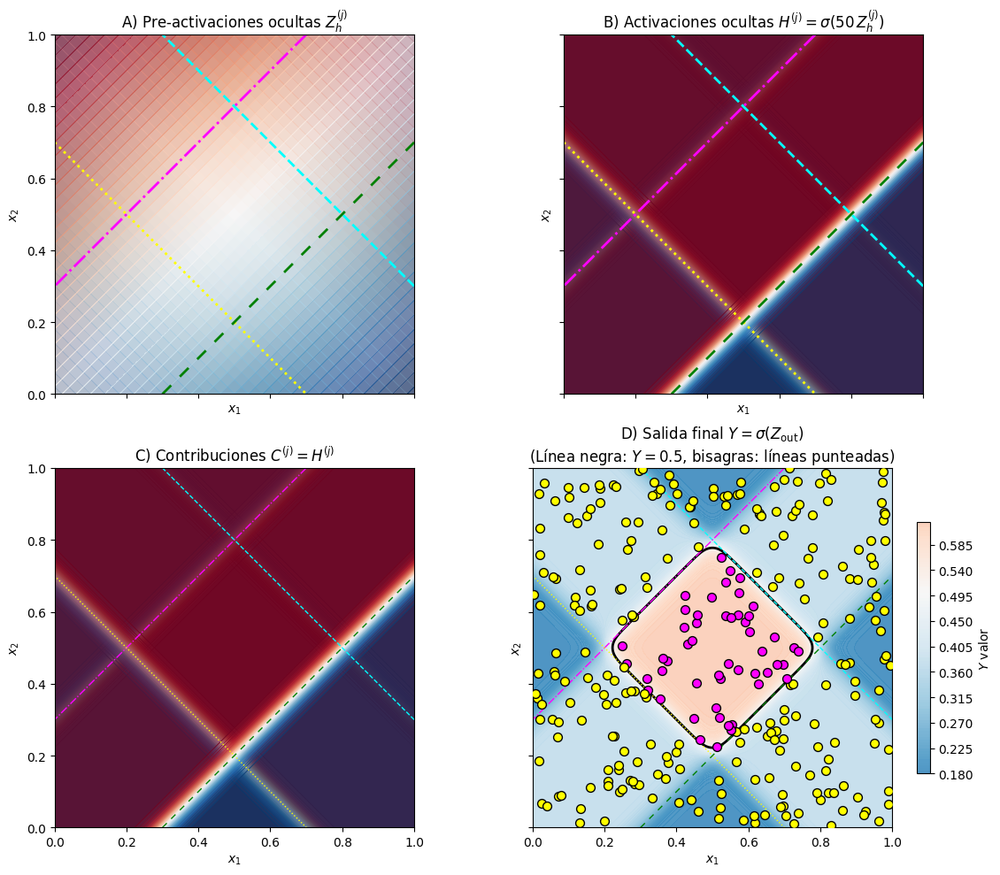

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import RegularGridInterpolator

# ───────── Definir el dataset: puntos dentro vs fuera de un diamante ─────────
r = 0.3
def is_inside_diamond(x, y, center=(0.5, 0.5), r=0.3):
    return (abs(x - center[0]) + abs(y - center[1])) <= r

np.random.seed(0)
n_samples = 300
data_points = np.random.rand(n_samples, 2)
true_labels = np.array([is_inside_diamond(x, y) for x, y in data_points], dtype=int)

# ───────── Definir la red manualmente (4 sigmoides + sigmoide de salida) ─────────
W_h = np.array([
    [-1.0, -1.0],   # Z_h1 = 1.3 - x - y
    [ 1.0, -1.0],   # Z_h2 = 0.3 + x - y
    [ 1.0,  1.0],   # Z_h3 = -0.7 + x + y
    [-1.0,  1.0],   # Z_h4 = 0.3 - x + y
])
b_h = np.array([1.3, 0.3, -0.7, 0.3])
k_hidden = 50.0

W_out = np.ones(4)
b_out = -3.5
k_output = 1.0

# ───────── Crear la malla 2D para visualizar ─────────
n_grid = 200
x_vals = np.linspace(0, 1, n_grid)
X1, X2 = np.meshgrid(x_vals, x_vals)

# ───────── Cálculos de la red sobre la malla ─────────
Z_h = np.zeros((4, n_grid, n_grid))
for j in range(4):
    Z_h[j] = W_h[j,0] * X1 + W_h[j,1] * X2 + b_h[j]

H = 1.0 / (1.0 + np.exp(-k_hidden * Z_h))

C = np.zeros_like(H)
for j in range(4):
    C[j] = W_out[j] * H[j]

Z_out = np.sum(C, axis=0) + b_out
Y_out = 1.0 / (1.0 + np.exp(-k_output * Z_out))

interp_sig = RegularGridInterpolator((x_vals, x_vals), Y_out)
predicted_vals = interp_sig(data_points)
pred_labels = (predicted_vals > 0.5).astype(int)

# ───────── Dibujar los 4 paneles en 2D ─────────
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=True)
axes = axes.ravel()
cmap = 'RdBu_r'

line_colors = ['cyan', 'magenta', 'yellow', 'green']
line_styles = ['--', '-.', ':', (0, (5, 5))]

# Panel A: Pre-activaciones ocultas Z_h[j]
ax = axes[0]
for j in range(4):
    ax.contourf(
        X1, X2, Z_h[j],
        levels=50,
        cmap=cmap,
        alpha=0.6,
        vmin=Z_h.min(), vmax=Z_h.max()
    )
    ax.contour(
        X1, X2, Z_h[j],
        levels=[0],
        colors=[line_colors[j]],
        linestyles=[line_styles[j]],
        linewidths=2
    )
ax.set_title("A) Pre-activaciones ocultas $Z_h^{(j)}$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")

# Panel B: Activaciones ocultas H[j]
ax = axes[1]
for j in range(4):
    ax.contourf(
        X1, X2, H[j],
        levels=50,
        cmap=cmap,
        alpha=0.6,
        vmin=0, vmax=1
    )
    ax.contour(
        X1, X2, Z_h[j],
        levels=[0],
        colors=[line_colors[j]],
        linestyles=[line_styles[j]],
        linewidths=2
    )
ax.set_title("B) Activaciones ocultas $H^{(j)} = σ(50\,Z_h^{(j)})$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")

# Panel C: Contribuciones C[j] = H[j]
ax = axes[2]
for j in range(4):
    ax.contourf(
        X1, X2, H[j],
        levels=50,
        cmap=cmap,
        alpha=0.6,
        vmin=0, vmax=1
    )
    ax.contour(
        X1, X2, Z_h[j],
        levels=[0],
        colors=[line_colors[j]],
        linestyles=[line_styles[j]],
        linewidths=1
    )
ax.set_title("C) Contribuciones $C^{(j)} = H^{(j)}$")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")

# Panel D: Salida final Y_out con puntos de prueba
ax = axes[3]
cf = ax.contourf(
    X1, X2, Y_out,
    levels=100,
    cmap=cmap,
    alpha=0.9,
    vmin=0, vmax=1
)
ax.contour(
    X1, X2, Y_out,
    levels=[0.5],
    colors='k',
    linewidths=2
)
for j in range(4):
    ax.contour(
        X1, X2, Z_h[j],
        levels=[0],
        colors=[line_colors[j]],
        linestyles=[line_styles[j]],
        linewidths=1
    )

for i in range(n_samples):
    x_pt, y_pt = data_points[i]
    if true_labels[i] == 1:
        edge_color = 'red' if pred_labels[i] == 0 else 'k'
        ax.scatter(x_pt, y_pt, color='magenta', edgecolor=edge_color, s=50, zorder=5)
    else:
        edge_color = 'red' if pred_labels[i] == 1 else 'k'
        ax.scatter(x_pt, y_pt, color='yellow', edgecolor=edge_color, s=50, zorder=5)

ax.set_title(
    "D) Salida final $Y = σ(Z_{\mathrm{out}})$\n"
    "(Línea negra: $Y=0.5$, bisagras: líneas punteadas)"
)
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")

for a in axes:
    a.set_aspect('equal')
    a.set_xlim(0,1)
    a.set_ylim(0,1)

cbar = fig.colorbar(cf, ax=axes[3], orientation='vertical', shrink=0.7)
cbar.set_label('$Y$ valor')

plt.tight_layout()
plt.show()


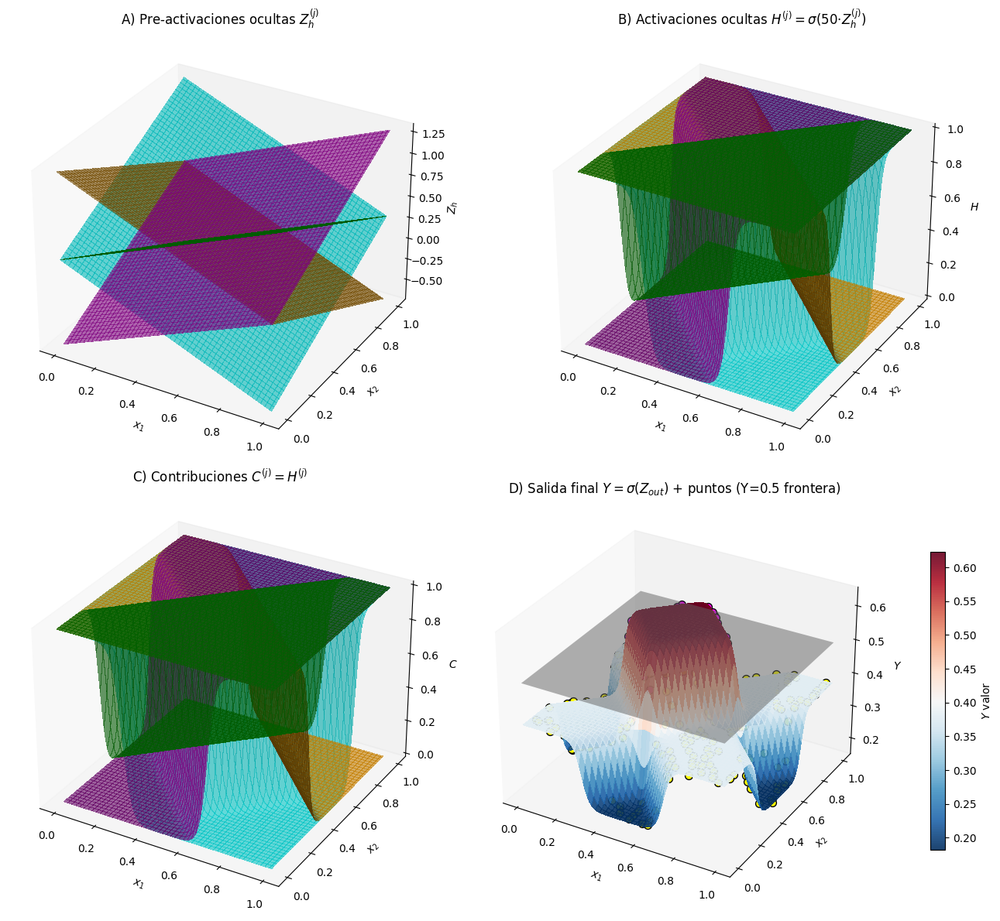

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import RegularGridInterpolator

# ───────── Definir el dataset: puntos dentro vs fuera de un diamante ─────────
r = 0.3
def is_inside_diamond(x, y, center=(0.5, 0.5), r=0.3):
    return (abs(x - center[0]) + abs(y - center[1])) <= r

np.random.seed(0)
n_samples = 300
data_points = np.random.rand(n_samples, 2)
true_labels = np.array([is_inside_diamond(x, y) for x, y in data_points], dtype=int)

# ───────── Parámetros de la red (4 sigmoides ocultas + sigmoide salida) ─────────
W_h = np.array([
    [-1.0, -1.0],   # Z_h1 = 1.3 - x - y
    [ 1.0, -1.0],   # Z_h2 = 0.3 + x - y
    [ 1.0,  1.0],   # Z_h3 = -0.7 + x + y
    [-1.0,  1.0],   # Z_h4 = 0.3 - x + y
])
b_h = np.array([1.3, 0.3, -0.7, 0.3])
k_hidden = 50.0

W_out = np.ones(4)
b_out = -3.5
k_output = 1.0

# ───────── Crear malla 2D para visualizar ─────────
n_grid = 100
x_vals = np.linspace(0, 1, n_grid)
X1, X2 = np.meshgrid(x_vals, x_vals)

# ───────── Cálculos de la red sobre la malla ─────────
# 1) Pre-activaciones ocultas Z_h[j]
Z_h = np.zeros((4, n_grid, n_grid))
for j in range(4):
    Z_h[j] = W_h[j,0] * X1 + W_h[j,1] * X2 + b_h[j]

# 2) Activaciones ocultas H[j]
H = 1.0 / (1.0 + np.exp(-k_hidden * Z_h))

# 3) Contribuciones C[j] = W_out[j]*H[j]
C = np.zeros_like(H)
for j in range(4):
    C[j] = W_out[j] * H[j]

# 4) Pre-activación de salida Z_out = Σ_j C[j] + b_out
Z_out = np.sum(C, axis=0) + b_out

# 5) Salida final Y_out = σ(k_output * Z_out)
Y_out = 1.0 / (1.0 + np.exp(-k_output * Z_out))

# ───────── Interpolador para etiquetar puntos de prueba ─────────
interp_sig = RegularGridInterpolator((x_vals, x_vals), Y_out)
predicted_vals = interp_sig(data_points)
pred_labels = (predicted_vals > 0.5).astype(int)

# ───────── Crear figura con 4 paneles 3D ─────────
fig = plt.figure(figsize=(14, 12))

# Colormap para las superficies
cmap = 'RdBu_r'

# Panel A: Pre-activaciones ocultas Z_h[j]
axA = fig.add_subplot(2, 2, 1, projection='3d')
for j, color in zip(range(4), ['orange', 'green', 'purple', 'cyan']):
    axA.plot_surface(
        X1, X2, Z_h[j],
        color=color, alpha=0.6, linewidth=0, antialiased=False
    )
axA.set_title("A) Pre-activaciones ocultas $Z_h^{(j)}$")
axA.set_xlabel("$x_1$")
axA.set_ylabel("$x_2$")
axA.set_zlabel("$Z_h$")
axA.view_init(elev=30, azim=-60)
axA.grid(False)

# Panel B: Activaciones ocultas H[j]
axB = fig.add_subplot(2, 2, 2, projection='3d')
for j, color in zip(range(4), ['orange', 'green', 'purple', 'cyan']):
    axB.plot_surface(
        X1, X2, H[j],
        color=color, alpha=0.6, linewidth=0, antialiased=False
    )
axB.set_title("B) Activaciones ocultas $H^{(j)} = σ(50·Z_h^{(j)})$")
axB.set_xlabel("$x_1$")
axB.set_ylabel("$x_2$")
axB.set_zlabel("$H$")
axB.view_init(elev=30, azim=-60)
axB.grid(False)

# Panel C: Contribuciones de cada unidad oculta C[j]
axC = fig.add_subplot(2, 2, 3, projection='3d')
for j, color in zip(range(4), ['orange', 'green', 'purple', 'cyan']):
    axC.plot_surface(
        X1, X2, C[j],
        color=color, alpha=0.6, linewidth=0, antialiased=False
    )
axC.set_title("C) Contribuciones $C^{(j)} = H^{(j)}$")
axC.set_xlabel("$x_1$")
axC.set_ylabel("$x_2$")
axC.set_zlabel("$C$")
axC.view_init(elev=30, azim=-60)
axC.grid(False)

# Panel D: Salida final Y_out con puntos de prueba
axD = fig.add_subplot(2, 2, 4, projection='3d')
# Superficie de probabilidad Y_out
surfD = axD.plot_surface(
    X1, X2, Y_out,
    cmap=cmap, alpha=0.9, linewidth=0, antialiased=False
)
# Plano Y_out = 0.5 para frontera de decisión
xx = np.linspace(0, 1, 2)
yy = np.linspace(0, 1, 2)
PX, PY = np.meshgrid(xx, yy)
PZ = 0.5 * np.ones_like(PX)
axD.plot_surface(PX, PY, PZ, color='gray', alpha=0.5)

# Dibujar puntos de ejemplo en 3D a altura Y_out(data)
for (x_pt, y_pt), true_lbl, pred_lbl in zip(data_points, true_labels, pred_labels):
    z_pt = interp_sig((x_pt, y_pt))
    color = 'magenta' if true_lbl == 1 else 'yellow'
    edgecol = 'red' if (pred_lbl != true_lbl) else 'k'
    axD.scatter(x_pt, y_pt, z_pt, color=color, edgecolor=edgecol, s=50, depthshade=True)

axD.set_title("D) Salida final $Y = σ(Z_{out})$ + puntos (Y=0.5 frontera)")
axD.set_xlabel("$x_1$")
axD.set_ylabel("$x_2$")
axD.set_zlabel("$Y$")
axD.view_init(elev=30, azim=-60)
axD.grid(False)

# Barra de color para panel D
fig.colorbar(surfD, ax=axD, pad=0.1, shrink=0.7, label='$Y$ valor')

plt.tight_layout()
plt.show()


CON 8 HIDDEN UNITS

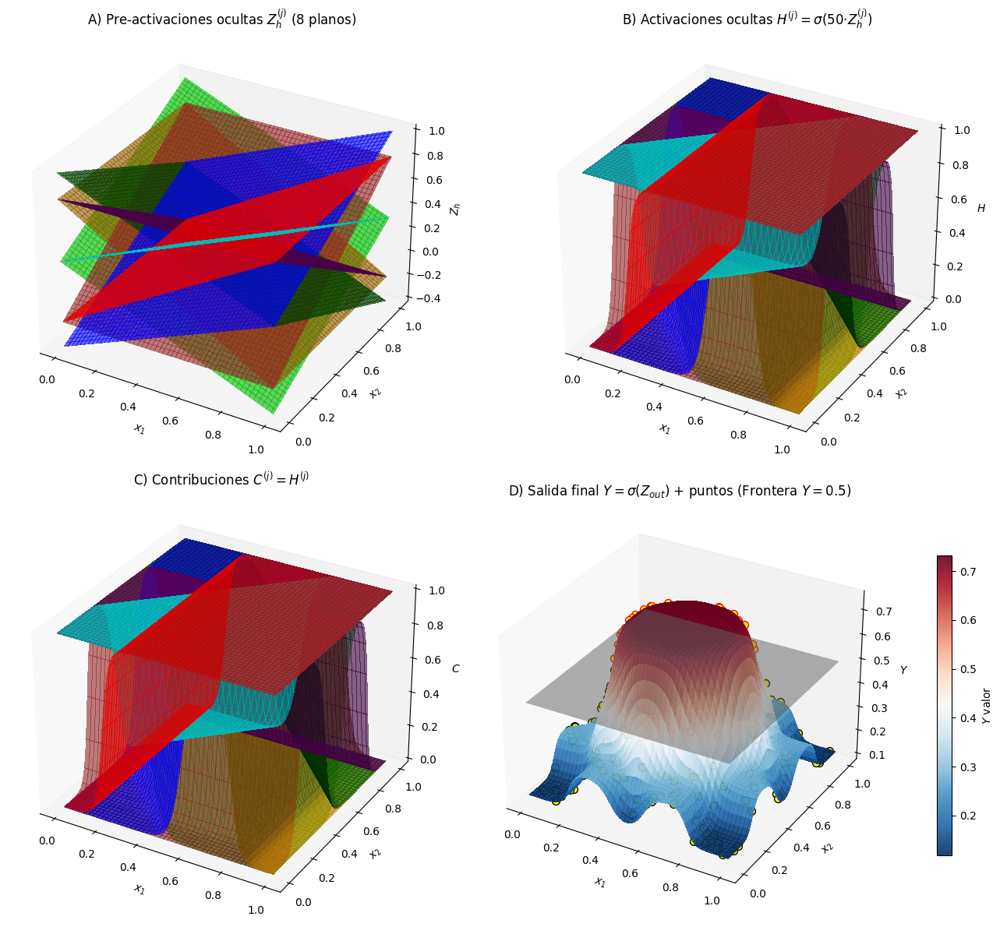

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import RegularGridInterpolator

# ───────── Definir el dataset: puntos dentro vs fuera de un círculo aproximado por un octágono ─────────
r = 0.3
def is_inside_octagon(x, y, center=(0.5, 0.5), r=0.3):
    return (abs(x - center[0]) + abs(y - center[1]) / np.tan(np.pi/8) <= r) and \
           (abs(y - center[1]) + abs(x - center[0]) / np.tan(np.pi/8) <= r)

np.random.seed(0)
n_samples = 300
data_points = np.random.rand(n_samples, 2)
true_labels = np.array([is_inside_octagon(x, y) for x, y in data_points], dtype=int)

# ───────── Parámetros de la red (8 sigmoides ocultas + sigmoide de salida) ─────────
# Normales para 8 planos (ángulos cada 45°)
angles = np.deg2rad(np.arange(0, 360, 45))
normals = [(np.cos(a), np.sin(a)) for a in angles]
center = (0.5, 0.5)
biases = [nx*center[0] + ny*center[1] + r for (nx, ny) in normals]

W_h = np.zeros((8, 2))
b_h = np.zeros(8)
for j, (nx, ny) in enumerate(normals):
    W_h[j] = np.array([-nx, -ny])
    b_h[j] = biases[j]

k_hidden = 50.0
W_out = np.ones(8)
b_out = -7.0   # Umbral: cuando las 8 H_j ≈ 1, ΣH ≈8 → Z_out ≈ 1 (dentro). Fuera, falta al menos 1 → Z_out ≤ 0
k_output = 1.0

# ───────── Crear malla 2D para visualizar ─────────
n_grid = 100
x_vals = np.linspace(0, 1, n_grid)
X1, X2 = np.meshgrid(x_vals, x_vals)

# ───────── Cálculos de la red sobre la malla ─────────
# 1) Pre-activaciones ocultas Z_h[j]
Z_h = np.zeros((8, n_grid, n_grid))
for j in range(8):
    Z_h[j] = W_h[j,0]*X1 + W_h[j,1]*X2 + b_h[j]

# 2) Activaciones ocultas H[j] = σ(50 * Z_h[j])
H = 1.0 / (1.0 + np.exp(-k_hidden * Z_h))

# 3) Contribuciones C[j] = W_out[j] * H[j]
C = np.zeros_like(H)
for j in range(8):
    C[j] = W_out[j] * H[j]

# 4) Pre-activación de salida Z_out = Σ_j C[j] + b_out
Z_out = np.sum(C, axis=0) + b_out

# 5) Salida final Y_out = σ(1 * Z_out)
Y_out = 1.0 / (1.0 + np.exp(-k_output * Z_out))

# ───────── Interpolador para etiquetar puntos de prueba ─────────
interp_sig = RegularGridInterpolator((x_vals, x_vals), Y_out)
predicted_vals = interp_sig(data_points)
pred_labels = (predicted_vals > 0.5).astype(int)

# ───────── Crear figura con 4 paneles en 3D ─────────
fig = plt.figure(figsize=(14, 12))
cmap = 'RdBu_r'
colors = ['orange','green','purple','cyan','red','blue','brown','lime']

# Panel A: Pre-activaciones ocultas Z_h[j]
axA = fig.add_subplot(2, 2, 1, projection='3d')
for j, color in enumerate(colors):
    axA.plot_surface(
        X1, X2, Z_h[j],
        color=color, alpha=0.6, linewidth=0, antialiased=False
    )
axA.set_title("A) Pre-activaciones ocultas $Z_h^{(j)}$ (8 planos)")
axA.set_xlabel("$x_1$")
axA.set_ylabel("$x_2$")
axA.set_zlabel("$Z_h$")
axA.view_init(elev=30, azim=-60)
axA.grid(False)

# Panel B: Activaciones ocultas H[j]
axB = fig.add_subplot(2, 2, 2, projection='3d')
for j, color in enumerate(colors):
    axB.plot_surface(
        X1, X2, H[j],
        color=color, alpha=0.6, linewidth=0, antialiased=False
    )
axB.set_title("B) Activaciones ocultas $H^{(j)} = σ(50·Z_h^{(j)})$")
axB.set_xlabel("$x_1$")
axB.set_ylabel("$x_2$")
axB.set_zlabel("$H$")
axB.view_init(elev=30, azim=-60)
axB.grid(False)

# Panel C: Contribuciones de cada unidad oculta C[j]
axC = fig.add_subplot(2, 2, 3, projection='3d')
for j, color in enumerate(colors):
    axC.plot_surface(
        X1, X2, C[j],
        color=color, alpha=0.6, linewidth=0, antialiased=False
    )
axC.set_title("C) Contribuciones $C^{(j)} = H^{(j)}$")
axC.set_xlabel("$x_1$")
axC.set_ylabel("$x_2$")
axC.set_zlabel("$C$")
axC.view_init(elev=30, azim=-60)
axC.grid(False)

# Panel D: Salida final Y_out con puntos de prueba
axD = fig.add_subplot(2, 2, 4, projection='3d')
surfD = axD.plot_surface(
    X1, X2, Y_out,
    cmap=cmap, alpha=0.9, linewidth=0, antialiased=False
)
# Plano Y_out = 0.5 para frontera de decisión
xx = np.linspace(0, 1, 2)
yy = np.linspace(0, 1, 2)
PX, PY = np.meshgrid(xx, yy)
PZ = 0.5 * np.ones_like(PX)
axD.plot_surface(PX, PY, PZ, color='gray', alpha=0.5)

# Dibujar puntos de ejemplo en 3D a altura Y_out(data)
for (x_pt, y_pt), true_lbl, pred_lbl in zip(data_points, true_labels, pred_labels):
    z_pt = interp_sig((x_pt, y_pt))
    color = 'magenta' if true_lbl == 1 else 'yellow'
    edgecol = 'red' if (pred_lbl != true_lbl) else 'k'
    axD.scatter(x_pt, y_pt, z_pt, color=color, edgecolor=edgecol, s=50, depthshade=True)

axD.set_title("D) Salida final $Y = σ(Z_{out})$ + puntos (Frontera $Y=0.5$)")
axD.set_xlabel("$x_1$")
axD.set_ylabel("$x_2$")
axD.set_zlabel("$Y$")
axD.view_init(elev=30, azim=-60)
axD.grid(False)

# Barra de color para panel D
fig.colorbar(surfD, ax=axD, pad=0.1, shrink=0.7, label='$Y$ valor')

plt.tight_layout()
plt.show()


MULTIPLES INPUTS Y OUTPUTS

![Arquitectura de red neuronal somera](images/shallow_network_architecture.png)

SI SALEN ASI, LOS DOS OUTPUTS SON COMO DOS FUNCIONES SEPARADAS.

SIN EMBARGO, SE SUELE USAR **SOFTMAX** PARA COMBINARLOS Y QUE TE DE UNA DISTRIBUCION DE PROBABILIDAD (CLASIFICACION)

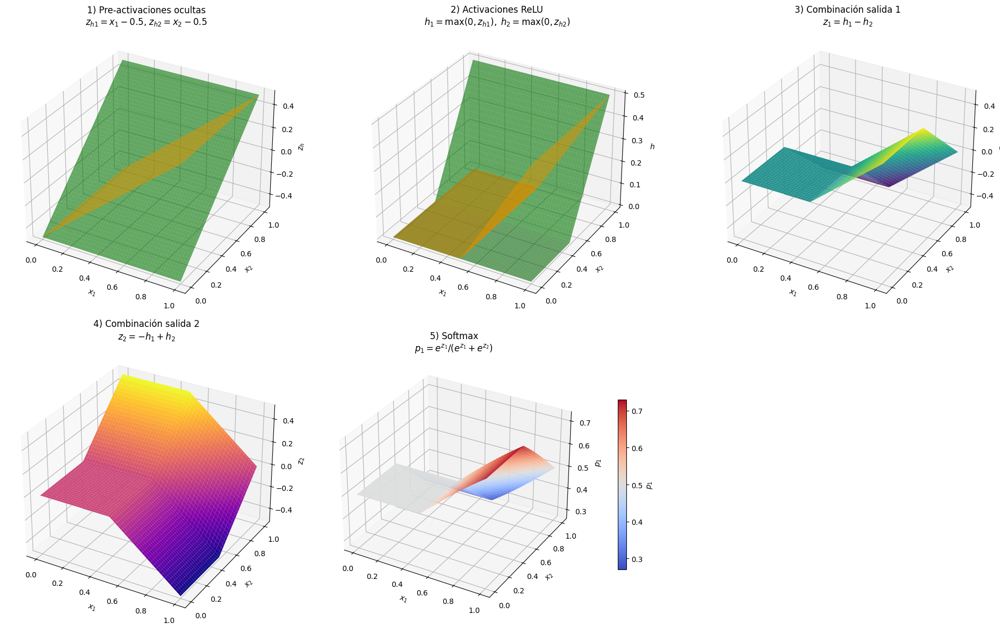

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ───────── Dominio de entrada ─────────
n = 100
x = np.linspace(0, 1, n)
X1, X2 = np.meshgrid(x, x)

# ───────── 1) Pre‐activaciones ocultas Z_h1, Z_h2 ─────────
Z_h1 = X1 - 0.5
Z_h2 = X2 - 0.5

# ───────── 2) Activaciones ReLU H1, H2 ─────────
H1 = np.maximum(0, Z_h1)
H2 = np.maximum(0, Z_h2)

# ───────── 3) Pre‐activaciones de salida z_out1, z_out2 ─────────
z_out1 = H1 - H2
z_out2 = -H1 + H2

# ───────── 4) Softmax p1 ─────────
exp1 = np.exp(z_out1)
exp2 = np.exp(z_out2)
den = exp1 + exp2
p1 = exp1 / den  # softmax class 1

# ───────── Visualización 3D en 5 paneles ─────────
fig = plt.figure(figsize=(20, 12))

# Panel 1: Pre‐activaciones ocultas
ax1 = fig.add_subplot(2, 3, 1, projection='3d')
ax1.plot_surface(X1, X2, Z_h1, color='orange', alpha=0.6, linewidth=0)
ax1.plot_surface(X1, X2, Z_h2, color='green', alpha=0.6, linewidth=0)
ax1.set_title("1) Pre‐activaciones ocultas\n$z_{h1}=x_1-0.5$, $z_{h2}=x_2-0.5$")
ax1.set_xlabel("$x_1$"); ax1.set_ylabel("$x_2$"); ax1.set_zlabel("$z_h$")
ax1.view_init(elev=30, azim=-60)

# Panel 2: Activaciones ReLU
ax2 = fig.add_subplot(2, 3, 2, projection='3d')
ax2.plot_surface(X1, X2, H1, color='orange', alpha=0.6, linewidth=0)
ax2.plot_surface(X1, X2, H2, color='green', alpha=0.6, linewidth=0)
ax2.set_title("2) Activaciones ReLU\n$h_1=\\max(0,z_{h1}),\\;h_2=\\max(0,z_{h2})$")
ax2.set_xlabel("$x_1$"); ax2.set_ylabel("$x_2$"); ax2.set_zlabel("$h$")
ax2.view_init(elev=30, azim=-60)

# Panel 3: z_out1
ax3 = fig.add_subplot(2, 3, 3, projection='3d')
ax3.plot_surface(X1, X2, z_out1, cmap='viridis', edgecolor='none')
ax3.set_title("3) Combinación salida 1\n$z_{1}=h_1 - h_2$")
ax3.set_xlabel("$x_1$"); ax3.set_ylabel("$x_2$"); ax3.set_zlabel("$z_1$")
ax3.view_init(elev=30, azim=-60)

# Panel 4: z_out2
ax4 = fig.add_subplot(2, 3, 4, projection='3d')
ax4.plot_surface(X1, X2, z_out2, cmap='plasma', edgecolor='none')
ax4.set_title("4) Combinación salida 2\n$z_{2}=-h_1 + h_2$")
ax4.set_xlabel("$x_1$"); ax4.set_ylabel("$x_2$"); ax4.set_zlabel("$z_2$")
ax4.view_init(elev=30, azim=-60)

# Panel 5: Softmax p1
ax5 = fig.add_subplot(2, 3, 5, projection='3d')
surf = ax5.plot_surface(X1, X2, p1, cmap='coolwarm', edgecolor='none')
ax5.set_title("5) Softmax\n$p_1 = e^{z_1}/(e^{z_1}+e^{z_2})$")
ax5.set_xlabel("$x_1$"); ax5.set_ylabel("$x_2$"); ax5.set_zlabel("$p_1$")
ax5.view_init(elev=30, azim=-60)
fig.colorbar(surf, ax=ax5, pad=0.1, shrink=0.6, label='$p_1$')

# Ocultar el sexto panel
fig.delaxes(fig.add_subplot(2,3,6))

plt.tight_layout()
plt.show()


# Deep neural network

La clave siempre es crear muchas linear regions para poder aproximar funciones mas complejas. Con una sola capa a veces hay que crear MUCHAS neuronas.

Con DEEP NETWORKS, o sea, composiciones de muchas capas, **se pueden crear muchas mas regiones con menos parametros**.

## Composicion de shallow networks

Si agarramos el output de una shallow y lo pasamos a otra shallow:

![shallow_network_composition](images/shallow_compositions.png)

https://udlbook.github.io/udlfigures/

EL EFECTO ES QUE SE MULTIPLICA TRES VECES! SI TENEMOS 3 REGIONES CON UNA SHALLOW, AHORA TENEMOS 9 COMPONIENDO DOS SHALLOWS

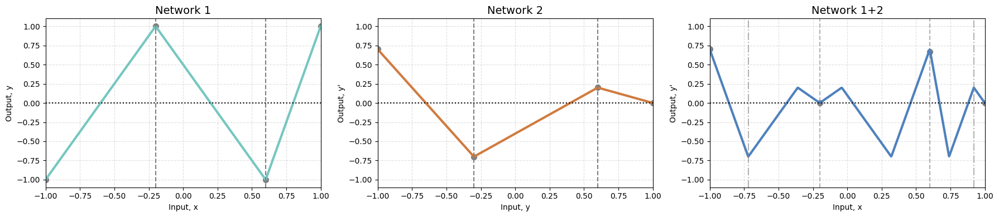

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── 1) Definir la primera red f(x) con 3 regiones lineales ─────────
pivot1, pivot2 = -0.2, 0.6
# pendientes e interceptos para cada tramo
m1, b1 = 2.5, 1.5
m2, b2 = -2.5, 0.5
m3, b3 = 5.0, -4.0

def f(x):
    return np.where(x <= pivot1,
                    m1*x + b1,
                    np.where(x <= pivot2,
                             m2*x + b2,
                             m3*x + b3))

# ───────── 2) Definir la segunda red g(y) con 3 regiones lineales ─────────
cut1, cut2 = -0.3, 0.6
n1, c1 = -2.0, -1.3
n2, c2 =  1.0, -0.4
n3, c3 = -0.5,  0.5

def g(y):
    return np.where(y <= cut1,
                    n1*y + c1,
                    np.where(y <= cut2,
                             n2*y + c2,
                             n3*y + c3))

# ───────── 3) Crear el dominio y calcular las salidas ─────────
x = np.linspace(-1, 1, 500)
y = f(x)
y_dom = np.linspace(-1, 1, 500)
gy_dom = g(y_dom)
h = g(y)

# ───────── 4) Dibujar los paneles b), c) y d) ─────────
fig, axes = plt.subplots(1, 3, figsize=(18, 4), sharey=False)

# Panel b) Network 1: f(x)
ax = axes[0]
ax.plot(x, y, color='#76c7c0', lw=3)
# cortes en x
for xp in [pivot1, pivot2]:
    ax.axvline(xp, color='gray', ls='--')
# eje y=0
ax.axhline(0, color='k', ls=':')
ax.scatter([-1, pivot1, pivot2, 1], f(np.array([-1, pivot1, pivot2, 1])),
           color='gray', s=50)
ax.set_title('Network 1', fontsize=14)
ax.set_xlabel('Input, x')
ax.set_ylabel('Output, y')
ax.set_xlim(-1,1); ax.set_ylim(-1.1,1.1)
ax.grid(ls='--', alpha=0.4)

# Panel c) Network 2: g(y)
ax = axes[1]
ax.plot(y_dom, gy_dom, color='#d07b3f', lw=3)
# cortes en y
for yc in [cut1, cut2]:
    ax.axvline(yc, color='gray', ls='--')
# eje y'=0
ax.axhline(0, color='k', ls=':')
# marcar puntos de ejemplo
ax.scatter([y_dom[0], cut1, cut2, y_dom[-1]],
           [gy_dom[0], g(cut1), g(cut2), gy_dom[-1]],
           color='gray', s=50)
ax.set_title('Network 2', fontsize=14)
ax.set_xlabel('Input, y')
ax.set_ylabel("Output, y'")
ax.set_xlim(-1,1); ax.set_ylim(-1.1,1.1)
ax.grid(ls='--', alpha=0.4)

# Panel d) Composición h(x)
ax = axes[2]
ax.plot(x, h, color='#4f81bd', lw=3)
# cortes de f (tramos de x)
for xp in [pivot1, pivot2]:
    ax.axvline(xp, color='gray', ls='--', alpha=0.6)
# cortes de g en x: donde f cruza cut1 y cut2
for yc in [cut1, cut2]:
    xi = x[np.argmin(np.abs(y - yc))]
    ax.axvline(xi, color='gray', ls='-.', alpha=0.6)
ax.axhline(0, color='k', ls=':')
# marcar puntos de ejemplo
pts_x = [-1, pivot1, pivot2, 1]
ax.scatter(pts_x, h[np.searchsorted(x, pts_x)], color='gray', s=50)
ax.set_title('Network 1+2', fontsize=14)
ax.set_xlabel('Input, x')
ax.set_ylabel("Output, y'")
ax.set_xlim(-1,1); ax.set_ylim(-1.1,1.1)
ax.grid(ls='--', alpha=0.4)

plt.tight_layout()
plt.show()


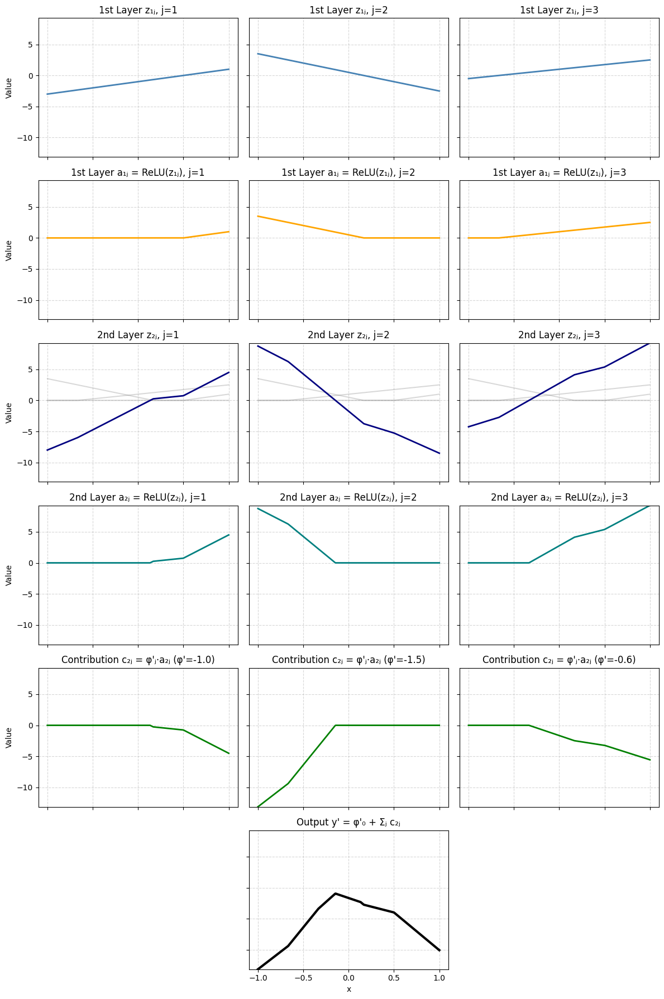

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── Dominio de entrada 1D ─────────
x = np.linspace(-1, 1, 400)

# ───────── Primera capa (3 unidades) ─────────
# Pesos θ_{j1} y sesgos θ_{j0}
theta_w = np.array([2.0, -3.0, 1.5])
theta_b = np.array([-1.0, 0.5, 1.0])

# Pre-activaciones z1_j(x) y activaciones a1_j = ReLU(z1_j)
Z1 = [theta_w[j] * x + theta_b[j] for j in range(3)]
A1 = [np.maximum(0, Z1[j]) for j in range(3)]

# ───────── Segunda capa (3 unidades) ─────────
# Pesos ψ_{jk} y sesgos ψ_{j0} elegidos para mayor variación
psi_W = np.array([
    [ 3.0, -2.0,  1.0],
    [-1.0,  2.5, -3.0],
    [ 2.0, -1.5,  2.5]
])
psi_b = np.array([-1.0, 0.0, 1.0])

# Pre-activaciones z2_j = ψ_j·a1 + ψ_{j0}; activaciones a2_j = ReLU(z2_j)
Z2 = [psi_W[j,0]*A1[0] + psi_W[j,1]*A1[1] + psi_W[j,2]*A1[2] + psi_b[j]
      for j in range(3)]
A2 = [np.maximum(0, Z2[j]) for j in range(3)]

# ───────── Capa de salida ─────────
# Pesos φ'_j y sesgo φ'_0
phi = np.array([-1.0, -1.5, -0.6])
phi0 = 0.0

# Contribuciones c2_j = φ'_j * a2_j
C2 = [phi[j] * A2[j] for j in range(3)]
# Salida final y'
Y = phi0 + sum(C2)

# ───────── Determinar límites comunes para el eje Y ─────────
all_curves = Z1 + A1 + Z2 + A2 + C2 + [Y]
ymin = min(map(np.min, all_curves))
ymax = max(map(np.max, all_curves))

# ───────── Visualización en 6 filas × 3 columnas ─────────
fig, axes = plt.subplots(6, 3, figsize=(12, 18), sharex=True, sharey=True)
axes = axes.flatten()

# Row 1: pre-activaciones de la primera capa
for j in range(3):
    ax = axes[j]
    ax.plot(x, Z1[j], lw=2, color='steelblue')
    ax.set_title(f"1st Layer z₁ⱼ, j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 2: activaciones ReLU de la primera capa
for j in range(3):
    ax = axes[3 + j]
    ax.plot(x, A1[j], lw=2, color='orange')
    ax.set_title(f"1st Layer a₁ⱼ = ReLU(z₁ⱼ), j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 3: pre-activaciones de la segunda capa sobre fondo de A1
for j in range(3):
    ax = axes[6 + j]
    # fondo de activaciones primera capa
    for k in range(3):
        ax.plot(x, A1[k], color='gray', alpha=0.3)
    ax.plot(x, Z2[j], lw=2, color='navy')
    ax.set_title(f"2nd Layer z₂ⱼ, j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 4: activaciones ReLU de la segunda capa
for j in range(3):
    ax = axes[9 + j]
    ax.plot(x, A2[j], lw=2, color='teal')
    ax.set_title(f"2nd Layer a₂ⱼ = ReLU(z₂ⱼ), j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 5: contribuciones al output
for j in range(3):
    ax = axes[12 + j]
    ax.plot(x, C2[j], lw=2, color='green')
    ax.set_title(f"Contribution c₂ⱼ = φ'ⱼ·a₂ⱼ (φ'={phi[j]:.1f})")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 6: salida final sólo en el panel central
for j in [15, 17]:
    axes[j].axis('off')
ax = axes[16]
ax.plot(x, Y, lw=3, color='black')
ax.set_title("Output y' = φ'₀ + Σⱼ c₂ⱼ")
ax.set_ylim(ymin, ymax)
ax.grid(ls='--', alpha=0.5)

# Etiquetas comunes
for idx, ax in enumerate(axes):
    if idx % 3 == 0:
        ax.set_ylabel("Value")
    if idx // 3 == 5:
        ax.set_xlabel("x")

plt.tight_layout()
plt.show()


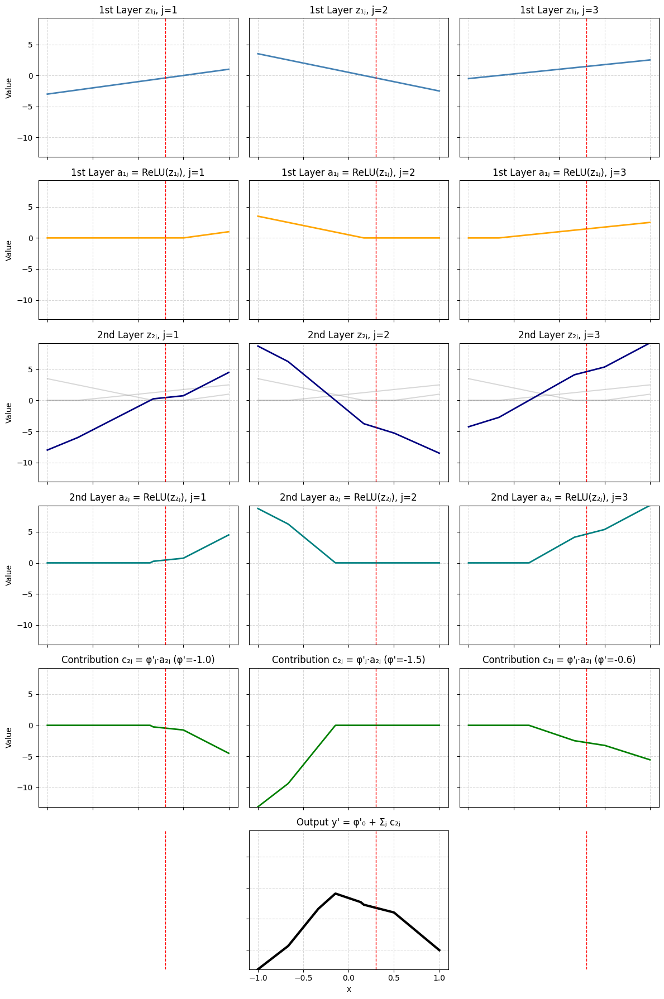

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# ───────── Parámetro a resaltar ─────────
# Cambia este valor para dibujar la línea vertical en la posición deseada
input_to_mark = 0.3

# ───────── Dominio de entrada 1D ─────────
x = np.linspace(-1, 1, 400)

# ───────── Primera capa (3 unidades) ─────────
# Pesos θ_{j1} y sesgos θ_{j0}
theta_w = np.array([2.0, -3.0, 1.5])
theta_b = np.array([-1.0, 0.5, 1.0])

# Pre-activaciones z1_j(x) y activaciones a1_j = ReLU(z1_j)
Z1 = [theta_w[j] * x + theta_b[j] for j in range(3)]
A1 = [np.maximum(0, Z1[j]) for j in range(3)]

# ───────── Segunda capa (3 unidades) ─────────
# Pesos ψ_{jk} y sesgos ψ_{j0}
psi_W = np.array([
    [ 3.0, -2.0,  1.0],
    [-1.0,  2.5, -3.0],
    [ 2.0, -1.5,  2.5]
])
psi_b = np.array([-1.0, 0.0, 1.0])

# Pre-activaciones z2_j = ψ_j·a1 + ψ_{j0}; activaciones a2_j = ReLU(z2_j)
Z2 = [
    psi_W[j,0]*A1[0] + psi_W[j,1]*A1[1] + psi_W[j,2]*A1[2] + psi_b[j]
    for j in range(3)
]
A2 = [np.maximum(0, Z2[j]) for j in range(3)]

# ───────── Capa de salida ─────────
# Pesos φ'_j y sesgo φ'_0
phi  = np.array([-1.0, -1.5, -0.6])
phi0 = 0.0

# Contribuciones c2_j = φ'_j * a2_j
C2 = [phi[j] * A2[j] for j in range(3)]
# Salida final y'
Y = phi0 + sum(C2)

# ───────── Límites comunes para el eje Y ─────────
all_curves = Z1 + A1 + Z2 + A2 + C2 + [Y]
ymin = min(map(np.min, all_curves))
ymax = max(map(np.max, all_curves))

# ───────── Visualización en 6 filas × 3 columnas ─────────
fig, axes = plt.subplots(6, 3, figsize=(12, 18), sharex=True, sharey=True)
axes = axes.flatten()

# Row 1: pre-activaciones de la primera capa
for j in range(3):
    ax = axes[j]
    ax.plot(x, Z1[j], lw=2, color='steelblue')
    ax.set_title(f"1st Layer z₁ⱼ, j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 2: activaciones ReLU de la primera capa
for j in range(3):
    ax = axes[3 + j]
    ax.plot(x, A1[j], lw=2, color='orange')
    ax.set_title(f"1st Layer a₁ⱼ = ReLU(z₁ⱼ), j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 3: pre-activaciones de la segunda capa sobre fondo de A1
for j in range(3):
    ax = axes[6 + j]
    # fondo de activaciones primera capa
    for k in range(3):
        ax.plot(x, A1[k], color='gray', alpha=0.3)
    ax.plot(x, Z2[j], lw=2, color='navy')
    ax.set_title(f"2nd Layer z₂ⱼ, j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 4: activaciones ReLU de la segunda capa
for j in range(3):
    ax = axes[9 + j]
    ax.plot(x, A2[j], lw=2, color='teal')
    ax.set_title(f"2nd Layer a₂ⱼ = ReLU(z₂ⱼ), j={j+1}")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 5: contribuciones al output
for j in range(3):
    ax = axes[12 + j]
    ax.plot(x, C2[j], lw=2, color='green')
    ax.set_title(f"Contribution c₂ⱼ = φ'ⱼ·a₂ⱼ (φ'={phi[j]:.1f})")
    ax.set_ylim(ymin, ymax)
    ax.grid(ls='--', alpha=0.5)

# Row 6: salida final solo en el panel central
# Desactivamos los dos paneles vacíos de la fila final
axes[15].axis('off')
axes[17].axis('off')
ax = axes[16]
ax.plot(x, Y, lw=3, color='black')
ax.set_title("Output y' = φ'₀ + Σⱼ c₂ⱼ")
ax.set_ylim(ymin, ymax)
ax.grid(ls='--', alpha=0.5)

# ───────── Dibujar línea vertical en todos los ejes ─────────
for ax in axes:
    # omitimos los ejes que están 'off'
    if not ax.get_visible():
        continue
    ax.axvline(input_to_mark, color='red', linestyle='--', linewidth=1)

# ───────── Etiquetas comunes ─────────
for idx, ax in enumerate(axes):
    if idx % 3 == 0:
        ax.set_ylabel("Value")
    if idx // 3 == 5:
        ax.set_xlabel("x")

plt.tight_layout()
plt.show()


# Loss function (visualizar)

## MSE sin activacion

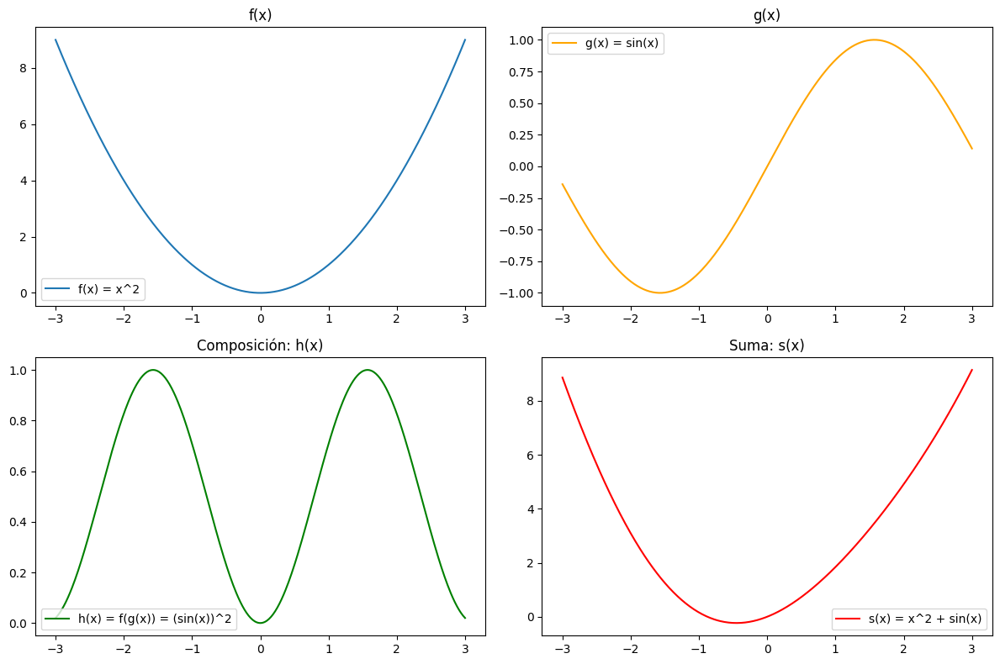

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definimos dos funciones diferenciables simples
def f(x):
    return x**2

def g(x):
    return np.sin(x)

# Composición: h(x) = f(g(x))
def h(x):
    return f(g(x))

# Suma: s(x) = f(x) + g(x)
def s(x):
    return f(x) + g(x)

# Dominio para graficar
x = np.linspace(-3, 3, 400)

plt.figure(figsize=(12, 8))

# Graficamos f(x)
plt.subplot(2, 2, 1)
plt.plot(x, f(x), label='f(x) = x^2')
plt.title('f(x)')
plt.legend()

# Graficamos g(x)
plt.subplot(2, 2, 2)
plt.plot(x, g(x), label='g(x) = sin(x)', color='orange')
plt.title('g(x)')
plt.legend()

# Graficamos h(x) = f(g(x))
plt.subplot(2, 2, 3)
plt.plot(x, h(x), label='h(x) = f(g(x)) = (sin(x))^2', color='green')
plt.title('Composición: h(x)')
plt.legend()

# Graficamos s(x) = f(x) + g(x)
plt.subplot(2, 2, 4)
plt.plot(x, s(x), label='s(x) = x^2 + sin(x)', color='red')
plt.title('Suma: s(x)')
plt.legend()

plt.tight_layout()
plt.show()

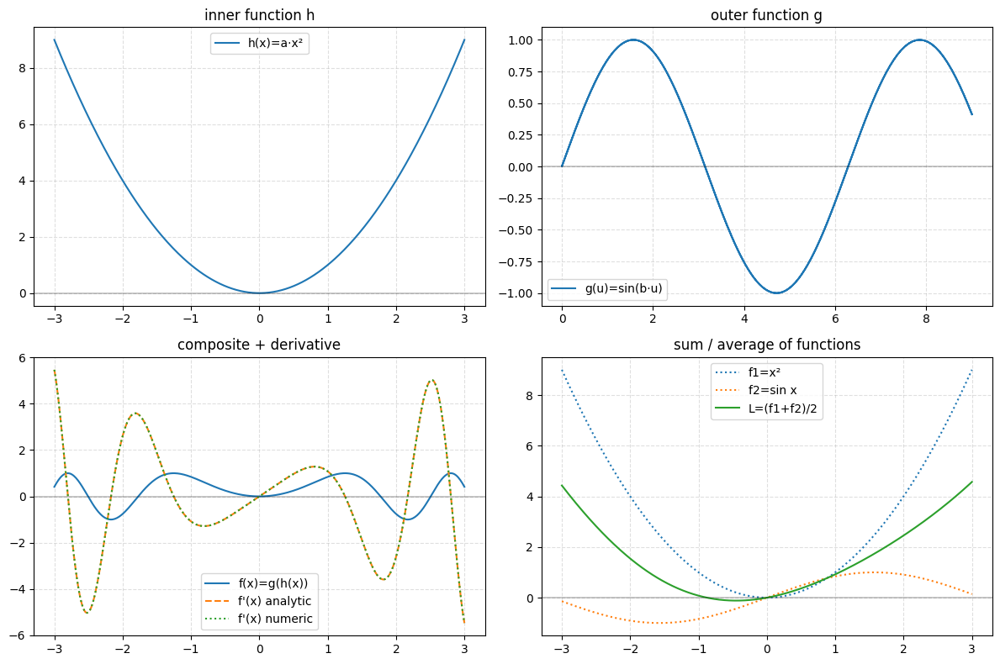

In [ ]:
# Foundations for back‑prop intuition: composition, sums and differentiability  
# You can run this cell as‑is, or tweak the parameters `a` and `b` below
# to see how everything changes.

import numpy as np
import matplotlib.pyplot as plt

# ---------- 1. pick parameters ----------
a = 1.0          # scales the inner (h) function
b = 1.0          # scales the outer (g) function
xmin, xmax = -3, 3
xs = np.linspace(xmin, xmax, 400)

# ---------- 2. define simple building‑block functions ----------
def h(x, a=a):
    """inner function (quadratic)"""
    return a * x**2                     # always differentiable

def g(u, b=b):
    """outer function (sine)"""
    return np.sin(b * u)                # always differentiable

def f(x, a=a, b=b):
    """composite f(x) = g(h(x))"""
    return g(h(x, a), b)

# analytic derivative via chain‑rule:  f'(x) = g'(h(x)) * h'(x)
def dh_dx(x, a=a):
    return 2 * a * x

def dg_du(u, b=b):
    return b * np.cos(b * u)

def df_dx_chain(x, a=a, b=b):
    return dg_du(h(x, a), b) * dh_dx(x, a)

# numeric derivative for sanity check
def df_dx_numeric(x, eps=1e-5):
    return (f(x + eps) - f(x - eps)) / (2 * eps)

# ---------- 3. another pair of functions for “sum / average” ----------
def f1(x):
    return x**2

def f2(x):
    return np.sin(x)

def L(x):
    return 0.5 * (f1(x) + f2(x))        # mean of two losses

# ---------- 4. plotting ----------
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
ax = axes.ravel()

# (a) h(x) and g(u)
ax[0].plot(xs, h(xs), label='h(x)=a·x²')
ax[0].set_title("inner function h")
ax[0].legend()

u_vals = h(xs)
ax[1].plot(u_vals, g(u_vals), label='g(u)=sin(b·u)')
ax[1].set_title("outer function g")
ax[1].legend()

# (b) composite f and its derivative
ax[2].plot(xs, f(xs), label='f(x)=g(h(x))')
ax[2].plot(xs, df_dx_chain(xs), '--', label="f'(x) analytic")
ax[2].plot(xs, df_dx_numeric(xs), ':', label="f'(x) numeric")
ax[2].set_title("composite + derivative")
ax[2].legend()

# (c) sum / average loss
ax[3].plot(xs, f1(xs), ':', label='f1=x²')
ax[3].plot(xs, f2(xs), ':', label='f2=sin x')
ax[3].plot(xs, L(xs), label='L=(f1+f2)/2')
ax[3].set_title("sum / average of functions")
ax[3].legend()

for a in ax:
    a.axhline(0, color='black', linewidth=0.3)
    a.grid(ls='--', alpha=0.4)

plt.tight_layout()



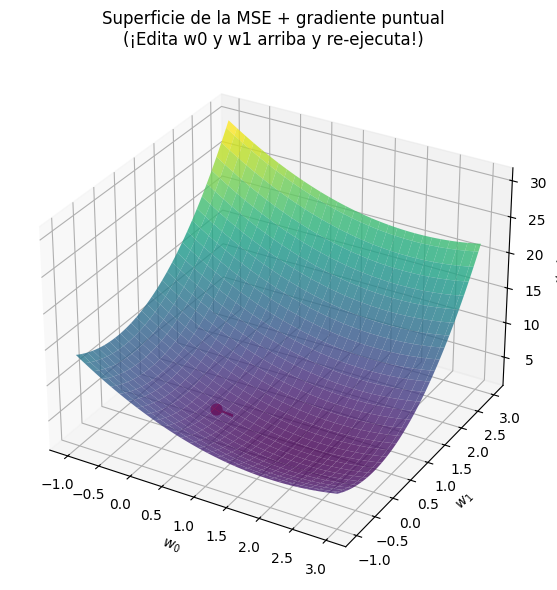

In [ ]:
# %% [markdown]
# ## MSE “bowl” en 3‑D — juega cambiando `w0` y `w1`
#
# 1. **Ajusta** los valores en la sección “AJUSTA AQUÍ”.  
# 2. Ejecuta la celda:  
#    • Verás la superficie de pérdida \(J(w_0,w_1)\).  
#    • Un punto rojo marca tus pesos \((w_0,w_1)\).  
#    • Una flecha muestra la dirección de descenso ( − gradiente).

import numpy as np
import matplotlib.pyplot as plt

# ---------- 1. Datos de juguete ----------
x_data = np.array([-2, -1, 0, 1, 2], dtype=float)
y_data = np.array([ 4,  1, 0, 1, 4], dtype=float)   # y = x²

def mse(w0, w1, x=x_data, y=y_data):
    """
    Calcula J(w0,w1) para un array de w0 y w1 (broadcast seguro).
    """
    # w0, w1 pueden ser mallas 2‑D; agregamos eje nuevo para x
    y_hat = w0[..., None] + w1[..., None] * x
    return np.mean((y - y_hat)**2, axis=-1)

def grad_mse(w0, w1, x=x_data, y=y_data):
    """
    Gradiente analítico de la MSE para modelo lineal y datos 1‑D.
    """
    y_hat = w0 + w1 * x
    error  = y - y_hat
    g0 = -2 * np.mean(error)
    g1 = -2 * np.mean(error * x)
    return g0, g1

# ---------- 2. AJUSTA AQUÍ  ----------
w0 = 0.5   # intercepto
w1 = 0.1   # pendiente
# ------------------------------------

# ---------- malla para la superficie ----------
w0_vals = np.linspace(-1, 3, 60)
w1_vals = np.linspace(-1, 3, 60)
W0, W1   = np.meshgrid(w0_vals, w1_vals)
J        = mse(W0, W1)   # ahora funciona con broadcasting

# ---------- gráfico ----------
fig = plt.figure(figsize=(8, 6))
ax  = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W0, W1, J, cmap='viridis', alpha=0.8, linewidth=0)

# punto actual y gradiente
j_val = mse(np.array(w0), np.array(w1))  # escalar
g0, g1 = grad_mse(w0, w1)
ax.scatter([w0], [w1], [j_val], color='crimson', s=60, depthshade=True)
ax.quiver(w0, w1, j_val,
          -g0, -g1, 0,
          length=0.3, normalize=True, color='crimson')

ax.set_xlabel('$w_0$')
ax.set_ylabel('$w_1$')
ax.set_zlabel('$J(w)$')
ax.set_title('Superficie de la MSE + gradiente puntual\n(¡Edita w0 y w1 arriba y re‑ejecuta!)')

plt.tight_layout()



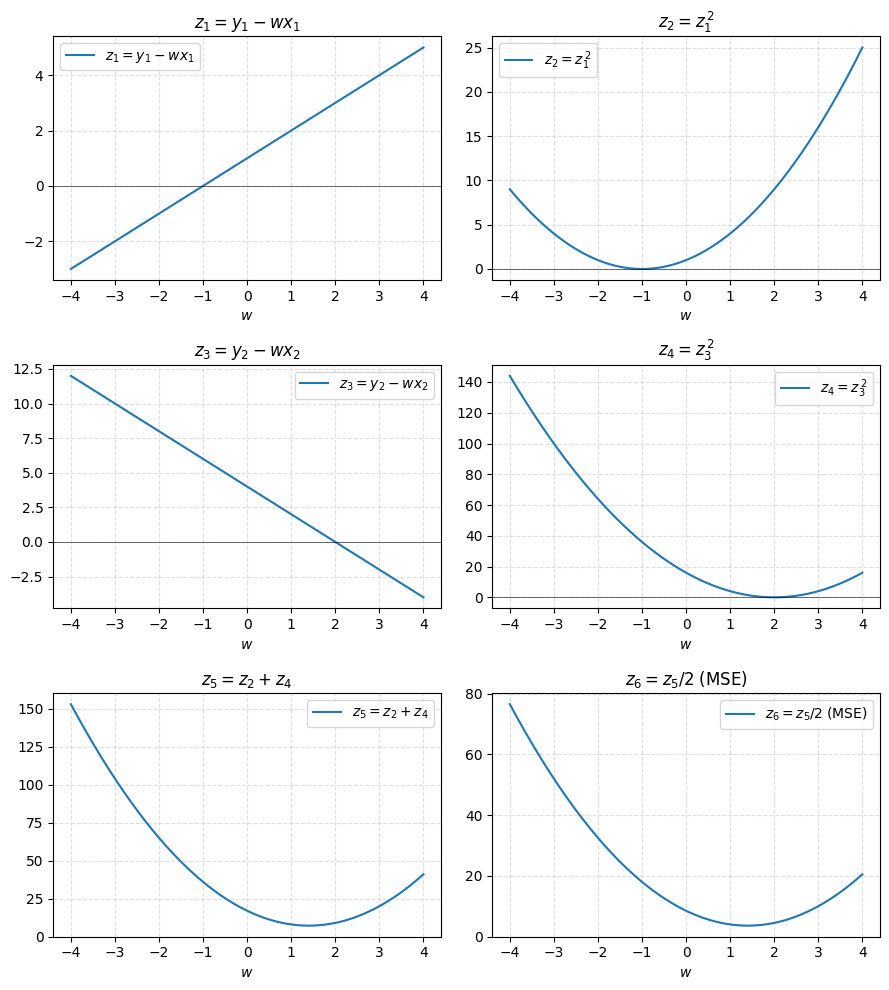

In [ ]:
# %% [markdown]
# # Paso a paso de una MSE con **n = 2** muestras
#
# Fijamos:
# - \(x_1 = -1,\; y_1 = 1\)
# - \(x_2 =  2,\; y_2 = 4\)
#
# Variables intermedias (cómputo hacia adelante):
#
# | Nombre | Expresión |
# |--------|-----------|
# | \(z_1\) | \(y_1 - w\,x_1\)               |
# | \(z_2\) | \(z_1^{\,2}\)                 |
# | \(z_3\) | \(y_2 - w\,x_2\)               |
# | \(z_4\) | \(z_3^{\,2}\)                 |
# | \(z_5\) | \(z_2 + z_4\)                  |
# | \(z_6\) | \(z_5 / n \quad (n=2)\)        |
#
# Veremos **6 gráficas** con cada función vs. `w`
# para tomar intuición de cómo la pérdida final (MSE) se va construyendo.

import numpy as np
import matplotlib.pyplot as plt

# ----- parámetros de los dos datos -----
x1, y1 = -1.0, 1.0
x2, y2 =  2.0, 4.0
n = 2

# rango de pesos
w = np.linspace(-4, 4, 400)

# variables intermedias
z1 = y1 - w * x1          # lineal
z2 = z1**2                # cuadrática
z3 = y2 - w * x2          # lineal
z4 = z3**2                # cuadrática
z5 = z2 + z4              # suma
z6 = z5 / n               # promedio → MSE

# ----- plotting -----
fig, axes = plt.subplots(3, 2, figsize=(9, 10))
ax = axes.ravel()  # flatten for easy indexing

titles = [
    r'$z_1 = y_1 - w x_1$',
    r'$z_2 = z_1^{\,2}$',
    r'$z_3 = y_2 - w x_2$',
    r'$z_4 = z_3^{\,2}$',
    r'$z_5 = z_2 + z_4$',
    r'$z_6 = z_5 / 2\;(\mathrm{MSE})$'
]
series = [z1, z2, z3, z4, z5, z6]

for a, title, s in zip(ax, titles, series):
    a.plot(w, s, label=title)
    a.set_title(title, fontsize=12)
    a.set_xlabel('$w$')
    a.grid(ls='--', alpha=0.4)
    # centre line for visual reference
    a.axhline(0, color='black', linewidth=0.4)
    a.legend()

plt.tight_layout()



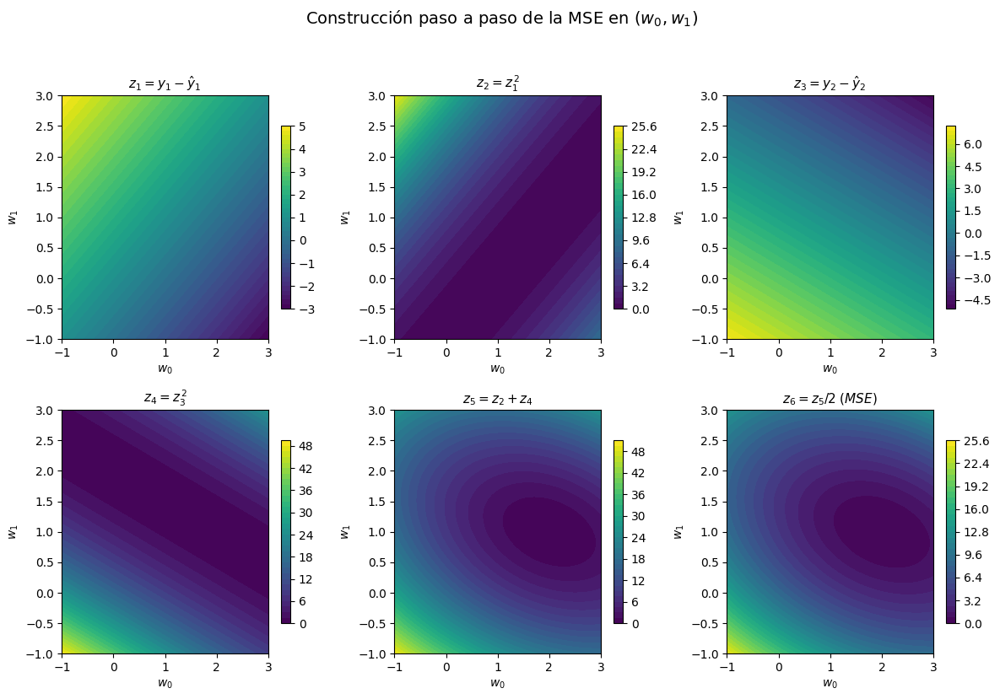

In [ ]:
# %% [markdown]
# # Cadena de funciones con **dos pesos** \(w_0,\;w_1\)  
# _(modelo lineal + MSE para n = 2 ejemplos)_
#
# Definimos
# \[
# \hat y_i = w_0 + w_1 x_i
# \]
# y reproducimos los pasos intermedios
# \[
# \begin{aligned}
# z_1 &= y_1-\hat y_1 &\qquad z_2 &= z_1^2 \\
# z_3 &= y_2-\hat y_2 &\qquad z_4 &= z_3^2 \\
# z_5 &= z_2+z_4 &\qquad z_6 &= \tfrac12 z_5
# \end{aligned}
# \]
# Visualizamos cada \(z_k(w_0,w_1)\) como un **mapa de colores** (contorno),
# para ver cómo se va formando la superficie “bowl” de la MSE.

import numpy as np
import matplotlib.pyplot as plt

# ---------- datos ----------
x1, y1 = -1.0, 1.0
x2, y2 =  2.0, 4.0
n = 2

# ---------- malla de pesos ----------
w0_vals = np.linspace(-1, 3, 200)
w1_vals = np.linspace(-1, 3, 200)
W0, W1  = np.meshgrid(w0_vals, w1_vals)

# ---------- variables intermedias ----------
Z1 = y1 - (W0 + W1 * x1)
Z2 = Z1**2
Z3 = y2 - (W0 + W1 * x2)
Z4 = Z3**2
Z5 = Z2 + Z4
Z6 = Z5 / n   # MSE

names = [
    r'$z_1 = y_1-\hat y_1$',
    r'$z_2 = z_1^{\,2}$',
    r'$z_3 = y_2-\hat y_2$',
    r'$z_4 = z_3^{\,2}$',
    r'$z_5 = z_2+z_4$',
    r'$z_6 = z_5/2\;(MSE)$'
]
fields = [Z1, Z2, Z3, Z4, Z5, Z6]

# ---------- plotting ----------
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.ravel()

for ax, title, field in zip(axes, names, fields):
    c = ax.contourf(W0, W1, field, levels=40, cmap='viridis')
    fig.colorbar(c, ax=ax, shrink=0.75)
    ax.set_title(title, fontsize=11)
    ax.set_xlabel('$w_0$')
    ax.set_ylabel('$w_1$')

plt.suptitle('Construcción paso a paso de la MSE en $(w_0,w_1)$', fontsize=14, y=1.03)
plt.tight_layout()



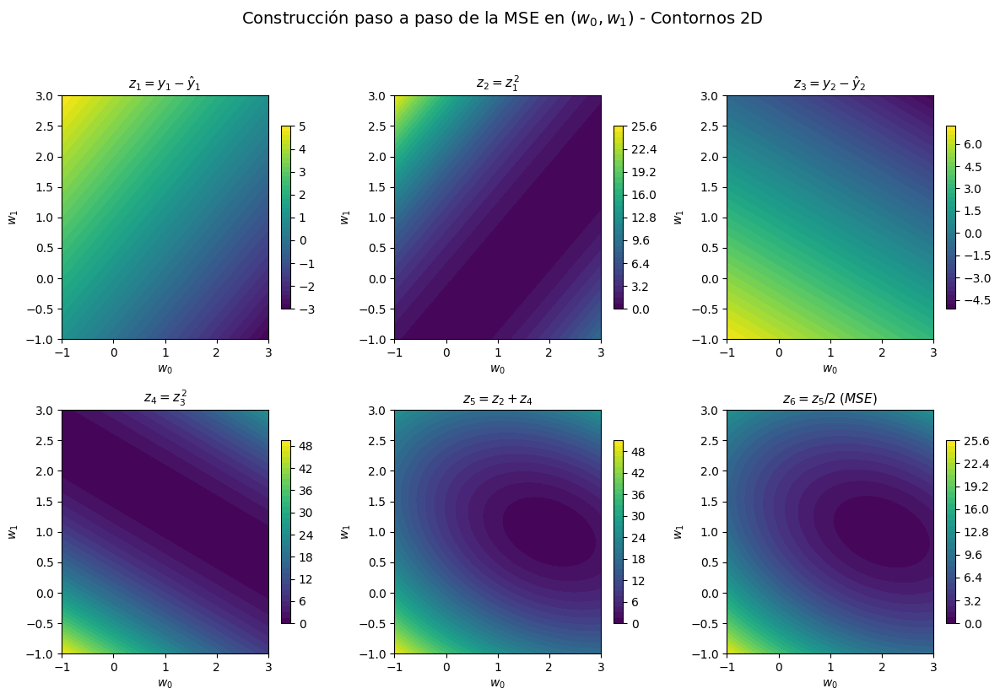

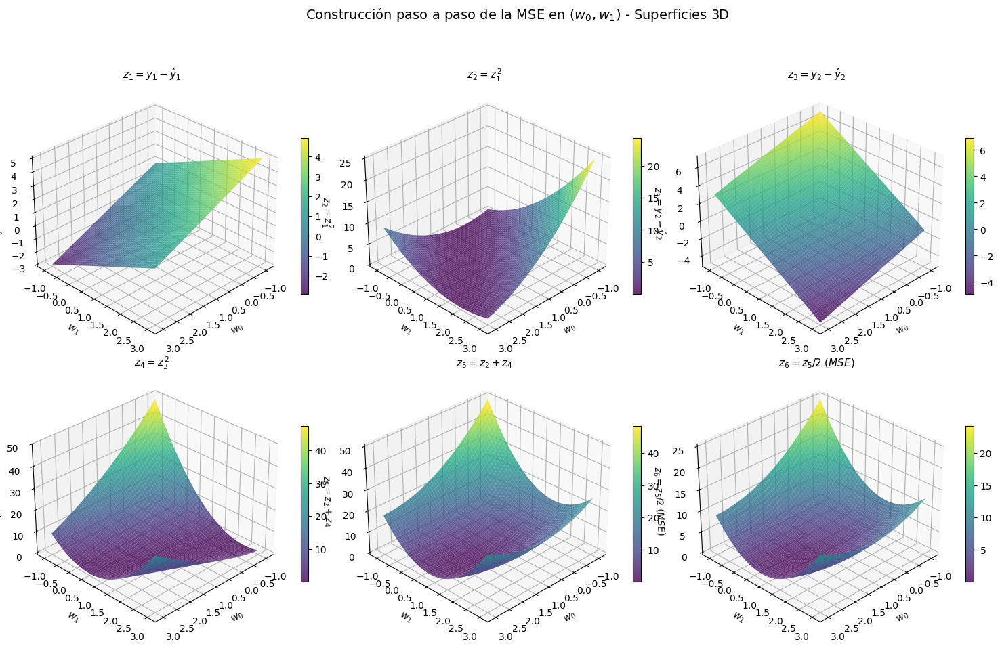

In [ ]:
# %% [markdown]
# # Cadena de funciones con **dos pesos** \(w_0,\;w_1\)  
# _(modelo lineal + MSE para n = 2 ejemplos)_
#
# Definimos
# \[
# \hat y_i = w_0 + w_1 x_i
# \]
# y reproducimos los pasos intermedios
# \[
# \begin{aligned}
# z_1 &= y_1-\hat y_1 &\qquad z_2 &= z_1^2 \\
# z_3 &= y_2-\hat y_2 &\qquad z_4 &= z_3^2 \\
# z_5 &= z_2+z_4 &\qquad z_6 &= \tfrac12 z_5
# \end{aligned}
# \]
# Visualizamos cada \(z_k(w_0,w_1)\) como un **mapa de colores** (contorno) y en 3D,
# para ver mejor cómo se va formando la superficie "bowl" de la MSE.

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ---------- datos ----------
x1, y1 = -1.0, 1.0
x2, y2 =  2.0, 4.0
n = 2

# ---------- malla de pesos ----------
w0_vals = np.linspace(-1, 3, 200)
w1_vals = np.linspace(-1, 3, 200)
W0, W1  = np.meshgrid(w0_vals, w1_vals)

# ---------- variables intermedias ----------
Z1 = y1 - (W0 + W1 * x1)
Z2 = Z1**2
Z3 = y2 - (W0 + W1 * x2)
Z4 = Z3**2
Z5 = Z2 + Z4
Z6 = Z5 / n   # MSE

names = [
    r'$z_1 = y_1-\hat y_1$',
    r'$z_2 = z_1^{\,2}$',
    r'$z_3 = y_2-\hat y_2$',
    r'$z_4 = z_3^{\,2}$',
    r'$z_5 = z_2+z_4$',
    r'$z_6 = z_5/2\;(MSE)$'
]
fields = [Z1, Z2, Z3, Z4, Z5, Z6]

# ---------- plotting 2D contours ----------
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.ravel()

for ax, title, field in zip(axes, names, fields):
    c = ax.contourf(W0, W1, field, levels=40, cmap='viridis')
    fig.colorbar(c, ax=ax, shrink=0.75)
    ax.set_title(title, fontsize=11)
    ax.set_xlabel('$w_0$')
    ax.set_ylabel('$w_1$')

plt.suptitle('Construcción paso a paso de la MSE en $(w_0,w_1)$ - Contornos 2D', fontsize=14, y=1.03)
plt.tight_layout()

# ---------- plotting 3D surfaces ----------
fig = plt.figure(figsize=(15, 10))
fig.suptitle('Construcción paso a paso de la MSE en $(w_0,w_1)$ - Superficies 3D', fontsize=14, y=0.98)

for i, (title, field) in enumerate(zip(names, fields)):
    ax = fig.add_subplot(2, 3, i+1, projection='3d')
    surf = ax.plot_surface(W0, W1, field, cmap='viridis', alpha=0.8, 
                          linewidth=0, antialiased=True)
    fig.colorbar(surf, ax=ax, shrink=0.5)
    ax.set_title(title, fontsize=11)
    ax.set_xlabel('$w_0$')
    ax.set_ylabel('$w_1$')
    ax.set_zlabel(title)
    # Ajustar ángulo de vista para mejor visualización
    ax.view_init(elev=30, azim=45)

plt.tight_layout()
plt.subplots_adjust(top=0.9)


## MSE con activacion (tanh)

Dataset:
x[0] = -3.000, y[0] = -0.500
x[1] = 4.000, y[1] = -0.000
x[2] = 1.000, y[2] = -2.000


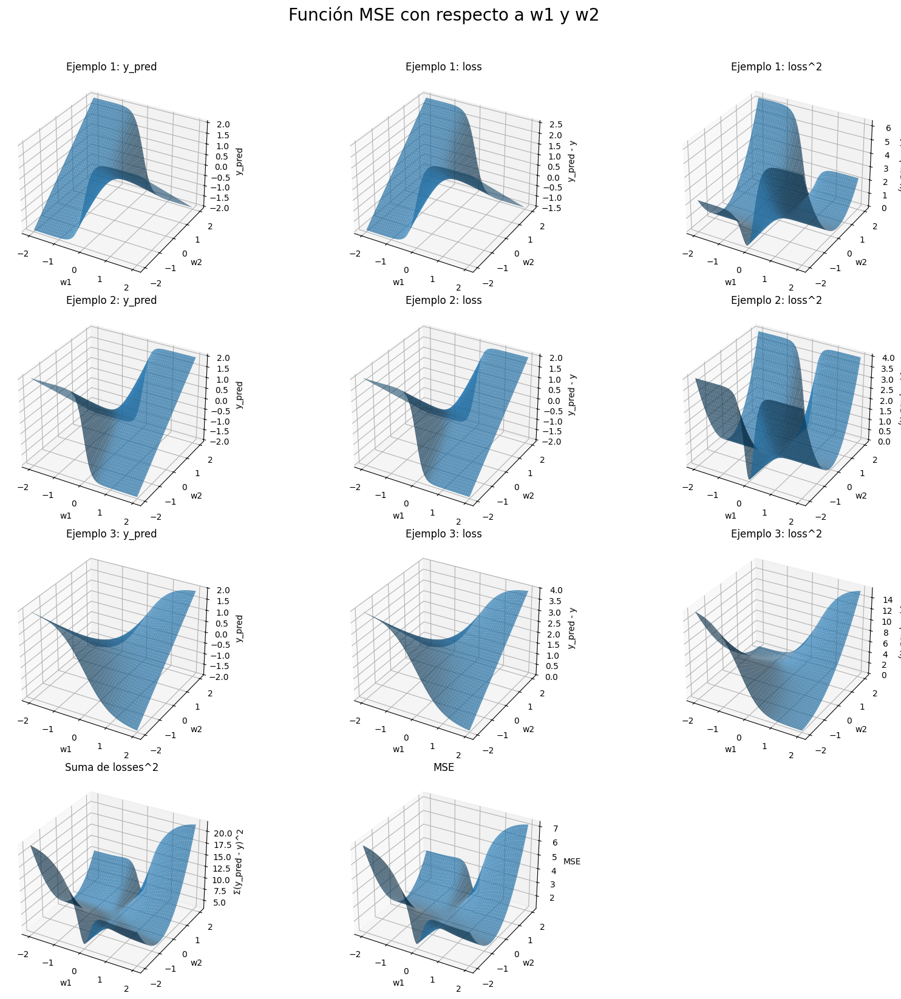

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Datos
x_data = np.array([-3.0, 4.0, 1.0])
y_data = np.array([-0.5, -0.0, -2])

# print the dataset
print("Dataset:")
for i in range(len(x_data)):
    print(f"x[{i}] = {x_data[i]:.3f}, y[{i}] = {y_data[i]:.3f}")

# Rejilla de pesos
w1 = np.linspace(-2, 2, 100)
w2 = np.linspace(-2, 2, 100)
W1, W2 = np.meshgrid(w1, w2)

# Cálculos
pred_list = [np.tanh(W1 * x) * W2 for x in x_data]
loss_list = [pred - y for pred, y in zip(pred_list, y_data)]
sq_loss_list = [loss**2 for loss in loss_list]
sum_sq = sum(sq_loss_list)
mse = sum_sq / len(x_data)

# Configuración de la grilla de plots
fig = plt.figure(figsize=(18, 16))
axs = [[fig.add_subplot(4, 3, i*3 + j + 1, projection='3d') for j in range(3)] for i in range(4)]
plt.suptitle('Función MSE con respecto a w1 y w2', fontsize=20, y=1.02)

# Tres primeras filas: cada ejemplo
for i in range(3):
    # Salida de la red
    axs[i][0].plot_surface(W1, W2, pred_list[i], alpha=0.7)
    axs[i][0].set_title(f'Ejemplo {i+1}: y_pred')
    axs[i][0].set_xlabel('w1'); axs[i][0].set_ylabel('w2'); axs[i][0].set_zlabel('y_pred')

    # Loss individual
    axs[i][1].plot_surface(W1, W2, loss_list[i], alpha=0.7)
    axs[i][1].set_title(f'Ejemplo {i+1}: loss')
    axs[i][1].set_xlabel('w1'); axs[i][1].set_ylabel('w2'); axs[i][1].set_zlabel('y_pred - y')

    # Loss al cuadrado
    axs[i][2].plot_surface(W1, W2, sq_loss_list[i], alpha=0.7)
    axs[i][2].set_title(f'Ejemplo {i+1}: loss^2')
    axs[i][2].set_xlabel('w1'); axs[i][2].set_ylabel('w2'); axs[i][2].set_zlabel('(y_pred - y)^2')

# Última fila: suma de losses cuadradas y MSE
# Suma de squared losses
axs[3][0].plot_surface(W1, W2, sum_sq, alpha=0.7)
axs[3][0].set_title('Suma de losses^2')
axs[3][0].set_xlabel('w1'); axs[3][0].set_ylabel('w2'); axs[3][0].set_zlabel('Σ(y_pred - y)^2')

# MSE
axs[3][1].plot_surface(W1, W2, mse, alpha=0.7)
axs[3][1].set_title('MSE')
axs[3][1].set_xlabel('w1'); axs[3][1].set_ylabel('w2'); axs[3][1].set_zlabel('MSE')

# Subplot vacío
axs[3][2].axis('off')

plt.tight_layout()
plt.show()



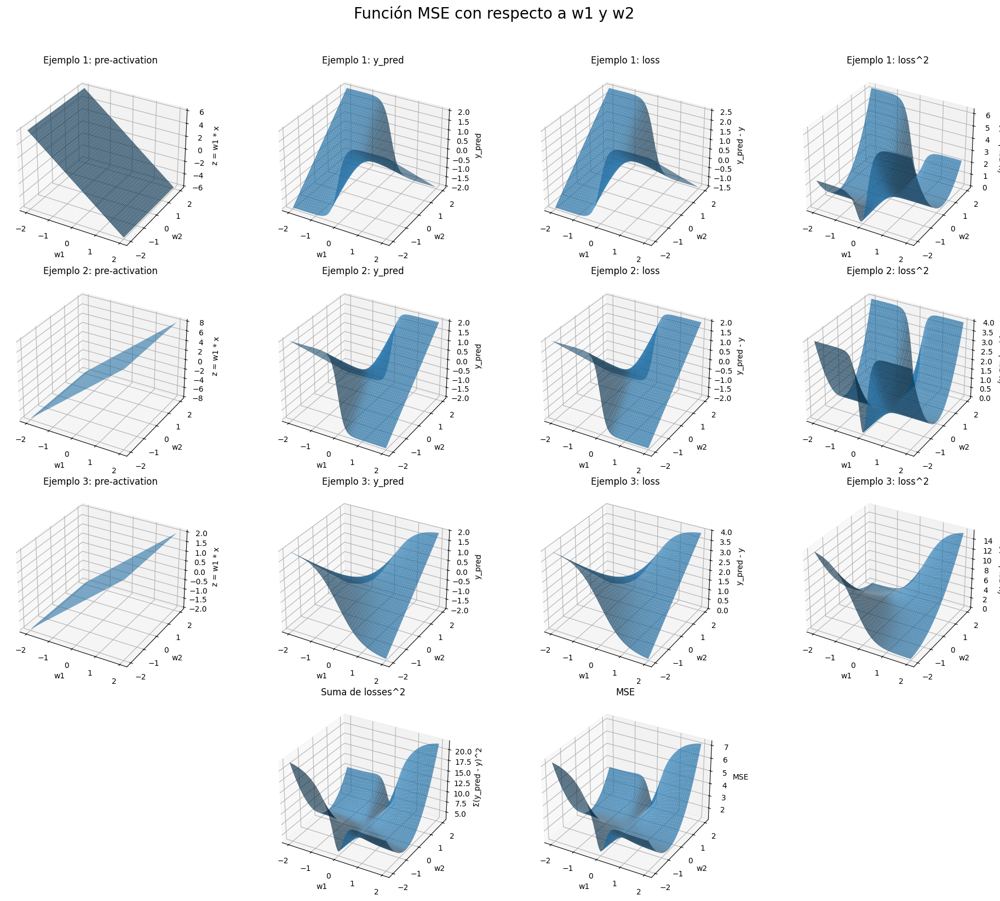

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Datos
x_data = np.array([-3.0, 4.0, 1.0])
y_data = np.array([-0.5, -0.0, -2])

# Rejilla de pesos
w1 = np.linspace(-2, 2, 100)
w2 = np.linspace(-2, 2, 100)
W1, W2 = np.meshgrid(w1, w2)

# Cálculos
pre_act_list = [W1 * x for x in x_data]                      # Pre-activación (antes de tanh)
pred_list = [np.tanh(pre) * W2 for pre in pre_act_list]     # Salida de la red
loss_list = [pred - y for pred, y in zip(pred_list, y_data)]
sq_loss_list = [loss**2 for loss in loss_list]
sum_sq = sum(sq_loss_list)
mse = sum_sq / len(x_data)

# Configuración de la grilla de plots 4x4
fig = plt.figure(figsize=(20, 16))
axs = [[fig.add_subplot(4, 4, i*4 + j + 1, projection='3d') for j in range(4)] for i in range(4)]
plt.suptitle('Función MSE con respecto a w1 y w2', fontsize=20, y=1.02)

# Filas 1-3: Ejemplos 1,2,3
for i in range(3):
    # Columna 0: pre-activación
    axs[i][0].plot_surface(W1, W2, pre_act_list[i], alpha=0.7)
    axs[i][0].set_title(f'Ejemplo {i+1}: pre-activation')
    axs[i][0].set_xlabel('w1'); axs[i][0].set_ylabel('w2'); axs[i][0].set_zlabel('z = w1 * x')

    # Columna 1: salida de la red
    axs[i][1].plot_surface(W1, W2, pred_list[i], alpha=0.7)
    axs[i][1].set_title(f'Ejemplo {i+1}: y_pred')
    axs[i][1].set_xlabel('w1'); axs[i][1].set_ylabel('w2'); axs[i][1].set_zlabel('y_pred')

    # Columna 2: loss individual
    axs[i][2].plot_surface(W1, W2, loss_list[i], alpha=0.7)
    axs[i][2].set_title(f'Ejemplo {i+1}: loss')
    axs[i][2].set_xlabel('w1'); axs[i][2].set_ylabel('w2'); axs[i][2].set_zlabel('y_pred - y')

    # Columna 3: loss al cuadrado
    axs[i][3].plot_surface(W1, W2, sq_loss_list[i], alpha=0.7)
    axs[i][3].set_title(f'Ejemplo {i+1}: loss^2')
    axs[i][3].set_xlabel('w1'); axs[i][3].set_ylabel('w2'); axs[i][3].set_zlabel('(y_pred - y)^2')

# Fila 4: Suma de losses^2 y MSE
# Columna 0 vacía
axs[3][0].axis('off')

# Columna 1: suma de losses^2
axs[3][1].plot_surface(W1, W2, sum_sq, alpha=0.7)
axs[3][1].set_title('Suma de losses^2')
axs[3][1].set_xlabel('w1'); axs[3][1].set_ylabel('w2'); axs[3][1].set_zlabel('Σ(y_pred - y)^2')

# Columna 2: MSE
axs[3][2].plot_surface(W1, W2, mse, alpha=0.7)
axs[3][2].set_title('MSE')
axs[3][2].set_xlabel('w1'); axs[3][2].set_ylabel('w2'); axs[3][2].set_zlabel('MSE')

# Columna 3 vacía
axs[3][3].axis('off')

plt.tight_layout()
plt.show()


## Cross-entropy (log loss)

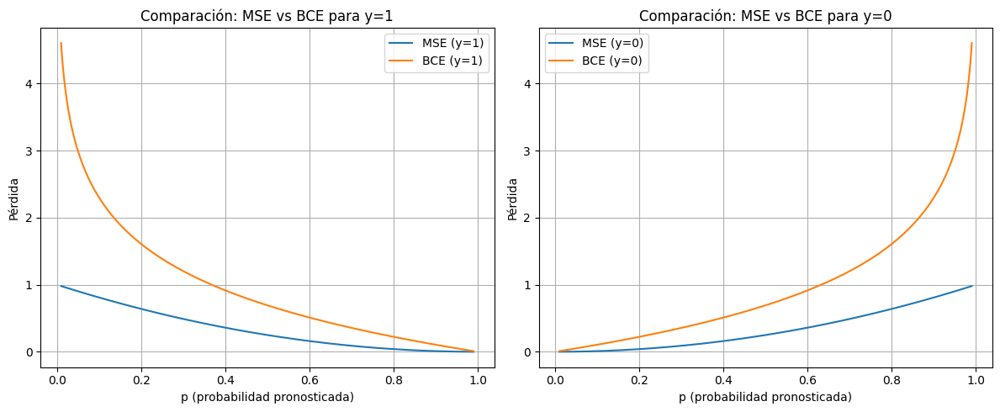

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definimos un rango de probabilidades predichas (p) entre 0.01 y 0.99
p = np.linspace(0.01, 0.99, 500)

# Etiquetas verdaderas para y=1 y y=0
y1 = np.ones_like(p)
y0 = np.zeros_like(p)

# Cálculo de MSE para y=1 y y=0
mse_y1 = (y1 - p) ** 2
mse_y0 = (y0 - p) ** 2

# Cálculo de Binary Cross-Entropy (BCE) para y=1 y y=0
bce_y1 = - (y1 * np.log(p) + (1 - y1) * np.log(1 - p))
bce_y0 = - (y0 * np.log(p) + (1 - y0) * np.log(1 - p))

# Creamos la figura con dos subplots: uno para el caso y=1 y otro para y=0
plt.figure(figsize=(12, 5))

# Subplot para y=1
plt.subplot(1, 2, 1)
plt.plot(p, mse_y1, label='MSE (y=1)')
plt.plot(p, bce_y1, label='BCE (y=1)')
plt.xlabel('p (probabilidad pronosticada)')
plt.ylabel('Pérdida')
plt.title('Comparación: MSE vs BCE para y=1')
plt.legend()
plt.grid(True)

# Subplot para y=0
plt.subplot(1, 2, 2)
plt.plot(p, mse_y0, label='MSE (y=0)')
plt.plot(p, bce_y0, label='BCE (y=0)')
plt.xlabel('p (probabilidad pronosticada)')
plt.ylabel('Pérdida')
plt.title('Comparación: MSE vs BCE para y=0')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


CLASIFICACION -> a diferencia de usar MSE como en regresion

**1. Contexto general**
En estos gráficos comparamos dos maneras de medir “qué tan mal” lo está haciendo un modelo de clasificación binaria:

* **MSE (Mean Squared Error):** $\;(y - p)^2$.
* **BCE (Binary Cross-Entropy):**

  $$
    -\Bigl[y \log(p) + (1-y)\log(1-p)\Bigr].
  $$

Aquí, $p$ es la probabilidad que el modelo asigna a la etiqueta “1” (por ejemplo, “es un perro”). La variable $y$ es la etiqueta real:

* $y = 1$ si la muestra sí tiene perro.
* $y = 0$ si la muestra no tiene perro.

En el eje horizontal de ambos gráficos está $p$, que va de 0.01 a 0.99 (es decir, de “modelo casi seguro de que NO es perro” hasta “modelo casi seguro de que SÍ es perro”). En el eje vertical está la pérdida (o “qué tan castigado” sale el modelo) según MSE y según BCE. Cada curva nos dice: “si el modelo predice $p$, ¿cuánto le estoy penalizando?”

---

**2. Gráfico izquierdo: caso $y = 1$**
En este primer gráfico estamos “en realidad sí hay perro” ($y=1$) y variamos $p$ para ver cómo castigamos:

* **Cuando $p$ está cerca de 1** (izquierda del eje, p ≈ 0.9 o 0.99):

  * El modelo está prácticamente acertando y bastante seguro de que es perro.
  * **MSE:** $(1 - 0.99)^2 = 0.0001$ (casi cero).
  * **BCE:** $-\log(0.99) \approx 0.01$ (también muy pequeño).
  * Ambos castigan muy poco porque el modelo estuvo correcto y muy “confiado”.

* **Cuando $p$ baja hacia 0.5**:

  * El modelo se está volviendo incierto (confianza del 50%).
  * **MSE:** $(1 - 0.5)^2 = 0.25$.
  * **BCE:** $-\log(0.5) ≈ 0.69$.
  * Aquí BCE ya empieza a castigar un poco más, porque la probabilidad “0.5” equivale a “no sé si es perro o no”.
  * MSE crece de forma cuadrática, pero más suave que BCE en estos valores intermedios.

* **Cuando $p$ se acerca a 0** (el modelo piensa con casi total seguridad que NO es perro, pero en realidad sí lo es):

  * **MSE:** $(1 - 0.01)^2 = 0.9801$. Este valor es grande, sí, pero no llega a valores estratosféricos.
  * **BCE:** $-\log(0.01) ≈ 4.60$. ¡Esto es un castigo enorme!
  * **Interpretación:** Si el modelo está muy “equivocado con seguridad” (predice $p$ muy cercano a 0 cuando en realidad es 1), la entropía cruzada lo penaliza muchísimo más que MSE. Esto fuerza al modelo a corregir con fuerza sus parámetros y evitar quedarse en esa zona extrema donde está convencido y equivocado.

En el gráfico, verás que la curva naranja (BCE) se dispara hacia arriba de manera casi exponencial a medida que $p \to 0$, mientras que la curva amarilla (MSE) sube más lento y “apenas” toca valores alrededor de 1.

---

**3. Gráfico derecho: caso $y = 0$**
Ahora estamos “en realidad NO hay perro” ($y=0$), y volvemos a variar $p$ –la probabilidad que el modelo asigna a “sí hay perro”– para ver cuánto castigan las pérdidas:

* **Cuando $p$ está cerca de 0** (el modelo acierta, pues dice “casi 0% de probabilidad de perro”):

  * **MSE:** $(0 - 0.01)^2 = 0.0001$.
  * **BCE:** $-\log(1 - 0.01) = -\log(0.99) ≈ 0.01$.
  * Ambas pérdidas son muy pequeñas porque el modelo estuvo confiado y correcto.

* **Cuando $p$ sube hacia 0.5**:

  * El modelo está “indeciso” (50% de probabilidad de perro).
  * **MSE:** $(0 - 0.5)^2 = 0.25$.
  * **BCE:** $-\log(1 - 0.5) = -\log(0.5) ≈ 0.69$.
  * De nuevo, BCE castiga un poco más que MSE cuando el modelo está poco seguro.

* **Cuando $p$ se acerca a 1** (el modelo está muy convencido de que SÍ hay perro, pero en realidad NO lo hay):

  * **MSE:** $(0 - 0.99)^2 ≈ 0.98$.
  * **BCE:** $-\log(1 - 0.99) = -\log(0.01) ≈ 4.60$.
  * Igual que antes, BCE crece explosivamente, mientras que MSE permanece en un rango cercano a 1.

Por tanto, en este gráfico de $y=0$ la curva naranja (BCE) vuelve a dispararse cuando $p \to 1$, penalizando muchísimo las predicciones “muy confiadas pero erróneas”. La curva amarilla (MSE) sube también, pero de forma suave.

---

**4. ¿Qué aprendemos de estos gráficos?**

1. **Penalización suave vs. fuerte**

   * Cuando el modelo hace una predicción equivocada **pero moderadamente equivocada** (por ejemplo, $p=0.5$ cuando debería ser $y=1$ o cuando $y=0$), la diferencia entre BCE y MSE no es brutal: ambas pérdidas están en el rango de 0.25–0.7.
   * Sin embargo, **cuando la equivocación es “confiada y extrema”** (por ejemplo, el modelo cree que la probabilidad de perro es 0.01 en lugar de 1, o cree 0.99 cuando debería ser 0), la BCE va a valores alrededor de 4.6 (en estos ejemplos), mientras que la MSE apenas llega a \~0.98.

2. **Impacto en el aprendizaje (gradientes)**

   * A la hora de actualizar parámetros, el modelo ajusta sus pesos según la derivada de la función de pérdida.
   * **Con MSE y la capa sigmoide** (o softmax en multiclasificación), los gradientes en regiones donde $p$ es muy cercano a 0 o 1 son muy pequeños (efecto de saturación de la sigmoide). Esto significa que, si el modelo está muy seguro y equivocado (por ejemplo, produce $p = 0.01$ o $p = 0.99$ cuando no corresponde), la derivada $\frac{\partial (y - p)^2}{\partial p} = 2(p - y)$ puede ser grande, pero la derivada de la sigmoide $\sigma'(z) = p(1-p)$ es extremadamente pequeña en esos extremos; el producto final es un gradiente diminuto, por lo que el modelo “no aprende rápido” a corregir ese error.
   * **Con BCE y la capa sigmoide**, la derivada de la pérdida respecto a $z$ se simplifica en $(p - y)$. Es decir, la entropía cruzada “anula” el factor $p(1-p)$ de la derivada de la sigmoide (para clasificación binaria). Como resultado, **incluso cuando $p$ está muy cerca de 0 o 1, el gradiente sigue siendo grande si $y$ es distinto**, forzando un ajuste vigoroso de los pesos.

3. **Conclusión clara**

   * **MSE no incentiva el modelo a “salir rápido” de las regiones de confianza equivocada**, porque sus gradientes se vuelven muy pequeños cuando las predicciones $p$ están cerca de 0 o 1.
   * **BCE castiga de manera exponencial** a las predicciones muy seguras y equivocadas, y **mantiene gradientes significativos** para corregir con rapidez esos errores, incluso en los extremos.
   * Por esto, **en problemas de clasificación (binaria o multiclase), la entropía cruzada es la función de pérdida estándar**: guía el aprendizaje de forma más estable y eficiente, asegurando que el modelo “aprenda rápido” si está muy convencido y equivocado.


### El rol de log

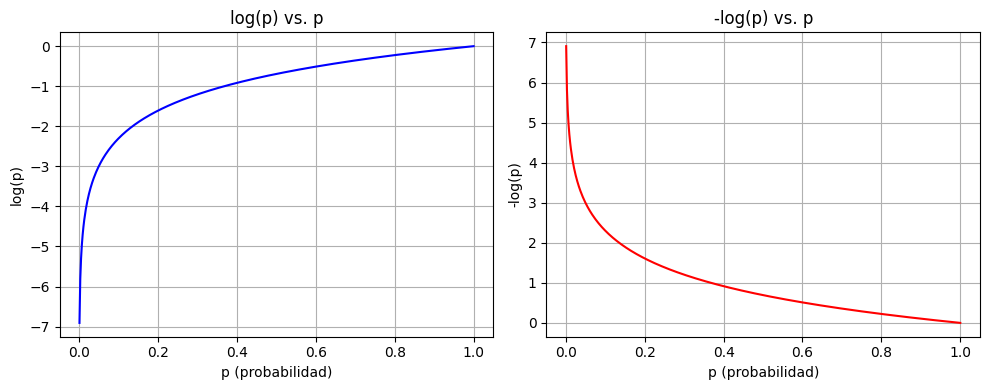

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definir rango de probabilidades de 0.001 a 1
p = np.linspace(0.001, 1, 500)

# Calcular log(p) y -log(p)
log_p = np.log(p)
neg_log_p = -np.log(p)

# Crear figura con dos subplots
plt.figure(figsize=(10, 4))

# Subplot 1: log(p) vs p
plt.subplot(1, 2, 1)
plt.plot(p, log_p, color='blue')
plt.xlabel('p (probabilidad)')
plt.ylabel('log(p)')
plt.title('log(p) vs. p')
plt.grid(True)

# Subplot 2: -log(p) vs p
plt.subplot(1, 2, 2)
plt.plot(p, neg_log_p, color='red')
plt.xlabel('p (probabilidad)')
plt.ylabel('-log(p)')
plt.title('-log(p) vs. p')
plt.grid(True)

plt.tight_layout()
plt.show()


**Explicación breve e intuitiva:**

1. **¿Qué hace log(p)?**

   * Cuando $p$ es cercano a 1, $\log(p)$ está cerca de 0 (baja “sorpresa”).
   * Cuando $p$ es pequeño ($p\ll1$), $\log(p)$ se hace muy negativo (gran “sorpresa”).
   * El gráfico azul muestra que al bajar $p$ de 1 a 0, $\log(p)$ pasa de 0 a $ -\infty$, pero lo hace de forma suave, primero cae rápido y luego tiende a $-\infty$ al final.

2. **¿Por qué usar $-\log(p)$?**

   * Si un evento de probabilidad $p$ sucede realmente, queremos convertir esa “probabilidad” en un “coste” o “pérdida”.
   * $-\log(p)$ (curva roja) asigna:

     * **Poco coste** cuando $p$ está cerca de 1, porque $-\log(0.9)\approx 0.105$.
     * **Coste enorme** cuando $p$ está muy cerca de 0, porque $-\log(0.01)\approx 4.6$.
   * Esto refleja “si algo improbabilísimo ocurre, castíguenlo fuerte”.

3. **Aplicación en pérdida de clasificación (BCE):**

   * Cuando la etiqueta es 1 y el modelo predice probabilidad $p$ de “1”, la pérdida es $-\log(p)$.
   * Cuando la etiqueta es 0 y el modelo predice $p$ de “1”, la pérdida es $-\log(1 - p)$.
   * Gracias a que el log expande el rango para $p$ pequeños, **un error muy confiado** (por ejemplo, $p=0.01$ cuando debería ser 1) recibe un castigo grande y produce gradientes fuertes que corrigen rápido al modelo.

4. **Resumen visual:**

   * En el gráfico derecho, nota cómo $-\log(p)$ (rojo) “explota” cuando $p\to0$, mientras que $\log(p)$ (azul) simplemente baja a valores muy negativos.
   * Esa “explosión” es la razón por la que, en clasificación, convertir $p$ a $-\log(p)$ nos da una pérdida que obliga a ajustar con urgencia cuando el modelo se equivoca con alta confianza.

Con estos dos gráficos queda claro que **el log cambia la escala de probabilidades** para hacer crecer mucho el castigo de eventos improbables, y por eso se usa en la función de pérdida (BCE) en lugar de “medir distancia” de otra forma.


POR QUE NO USAR CROSS ENTROPY EN REGRESION ENTONCES?

Aunque la predicción esté acotada a \[0, 1], **si el “target” es un valor continuo**, BCE (-log p) no captura bien el error de distancia numérica.

* **BCE asume que el target es la probabilidad de una etiqueta binaria** (0 o 1), o como “etiqueta difusa” en \[0, 1] interpretada como probabilidad.

  * Ejemplo: si el target fuese 0.7, BCE lo trataría como “70 % de probabilidad de etiqueta 1” en un Bernoulli, no como “el número 0.7 exacto” que queremos predecir.

* **Usar BCE con target continuo tiende a forzar la predicción a valores “extremos” (0 o 1)** en vez de acercarla linealmente a 0.7. Eso hace que:

  1. Si predices 0.5 y el target es 0.7, BCE = $-[0.7·\log(0.5)+0.3·\log(0.5)]\approx0.69$.
  2. Si predices 0.9 para ese mismo target 0.7, BCE = $-[0.7·\log(0.9)+0.3·\log(0.1)]\approx1.20$ (peor), aunque 0.9 está “numéricamente más cerca” de 0.7 que 0.5.

Con **MSE** en cambio:

* Si target=0.7 y tú predices 0.5, MSE=(0.7–0.5)²=0.04.
* Si predices 0.9, MSE=(0.7–0.9)²=0.04.
  Ambas predicciones equidistan de 0.7 y reciben el mismo castigo, reflejando la distancia real.

**Conclusión:**

* BCE (–log p) “mide sorpresa” de eventos binarios o probabilidades de etiquetas, no la cercanía de números continuos.
* Aunque la salida esté en \[0, 1], si el objetivo es un valor real, usa MSE (o MAE). Si quisiéramos forzar un modelo probabilístico con datos en \[0, 1], habría que usar una distribución continua apropiada (por ejemplo, Beta loss), pero no BCE.
